In [1]:
#All Required Libraries
import os
import time
import math
import csv
import numpy as np
from IPython.display import clear_output
from tqdm import tqdm_notebook as tqdm
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.color_palette("bright")
import matplotlib.cm as cm
import torch
import torch.nn as nn
import torch.optim as optim
from torchdiffeq import odeint_adjoint as odeint #Otherwise only "odeint_adjoint"

In [2]:
#Configuration
method = 'rk4' #RK-45 (rk4)
data_size = 900 #300 every 10 seconds
batch_time = 30
batch_size = 20
niters = 2000
test_freq = 20
viz = True
gpu = 0
#device = torch.device('cuda:' + str(gpu) if torch.cuda.is_available() else 'cpu')
device = 'cpu'

In [3]:
#Define ODE System
#torch.set_default_dtype(torch.float64)
omega0 = torch.tensor(2*60*np.pi)
delta1star = 0.543714502378423
omega1star = 0
delta2star = -0.657898240642551
omega2star = 0
delta3star = 0.038658833144357
omega3star = 0
v1star = torch.tensor(2.342701509994240)
v2star = torch.tensor(2.417838912110000)
v3star = torch.tensor(2.050366207960740)

x0 = torch.tensor([[delta1star + np.pi/6], [omega1star], [delta2star], [omega2star], [delta3star], [omega3star]]).to(device)
t = torch.arange(0.,30., 1/30).to(device) #1/30

M1 = torch.tensor(100)
D1 = torch.tensor(10)
#X1 = torch.tensor(0.963)
M2 = torch.tensor(18)
D2 = torch.tensor(10)
#X2 = torch.tensor(0.911)
M3 = torch.tensor(12)
D3 = torch.tensor(10)
#X3 = torch.tensor(0.667)

G12 = torch.tensor(0.00059569205479165)
B12 = torch.tensor(-0.310894430043027)
G13 = torch.tensor(-0.007639071017719)
B13 = torch.tensor(-0.372984139080232)
G23 = torch.tensor(-0.004693638897659)
B23 = torch.tensor(-0.429158911598529)

Pmech1star = torch.tensor(2.478317367015360)
Pmech2star = torch.tensor(-3.023956371876450)
Pmech3star = torch.tensor(0.448153267946861)

#Pmech1star = torch.tensor(-v1star*v2star*B12*np.sin(delta1star - delta2star) + v1star*v2star*G12*np.cos(delta1star-delta2star) - v1star*v3star*B13*np.sin(delta1star - delta3star) + v1star*v3star*G13*np.cos(delta1star-delta3star))
#Pmech2star = torch.tensor(-v1star*v2star*B12*np.sin(delta2star - delta1star) + v1star*v2star*G12*np.cos(delta2star-delta1star) - v2star*v3star*B23*np.sin(delta2star - delta3star) + v2star*v3star*G23*np.cos(delta2star-delta3star))
#Pmech3star = torch.tensor(-v1star*v3star*B13*np.sin(delta3star - delta1star) + v1star*v3star*G13*np.cos(delta3star-delta1star) - v2star*v3star*B23*np.sin(delta3star - delta2star) + v2star*v3star*G23*np.cos(delta3star-delta2star))

class Real(nn.Module):
    def forward(self,t,x):
        dxdt = torch.zeros_like(x)
        dxdt[0] = x[1]
        dxdt[1] = (-D1*x[1]/omega0 + v1star*v2star*B12*torch.sin(x[0]-x[2]) - v1star*v2star*G12*torch.cos(x[0]-x[2]) + v1star*v3star*B13*torch.sin(x[0]-x[4]) - v1star*v3star*G13*torch.cos(x[0]-x[4]) + Pmech1star)*omega0/M1
        dxdt[2] = x[3]
        dxdt[3] = (-D2*x[3]/omega0 + v1star*v2star*B12*torch.sin(x[2]-x[0]) - v1star*v2star*G12*torch.cos(x[2]-x[0]) + v2star*v3star*B23*torch.sin(x[2]-x[4]) - v2star*v3star*G23*torch.cos(x[2]-x[4]) + Pmech2star)*omega0/M2
        dxdt[4] = x[5]
        dxdt[5] = (-D3*x[5]/omega0 + v1star*v3star*B13*torch.sin(x[4]-x[0]) - v1star*v3star*G13*torch.cos(x[4]-x[0]) + v2star*v3star*B23*torch.sin(x[4]-x[2]) - v2star*v3star*G23*torch.cos(x[4]-x[2]) + Pmech3star)*omega0/M3
        self.dxdt = dxdt
        return dxdt

real_dynamics = Real()  
  
with torch.no_grad():
    true_x = odeint(real_dynamics, x0, t, method = method)

true_delta1 = true_x[:,0,0]
true_omega1 = true_x[:,1,0] / omega0
true_delta2 = true_x[:,2,0]
true_omega2 = true_x[:,3,0] / omega0
true_delta3 = true_x[:,4,0]
true_omega3 = true_x[:,5,0] / omega0

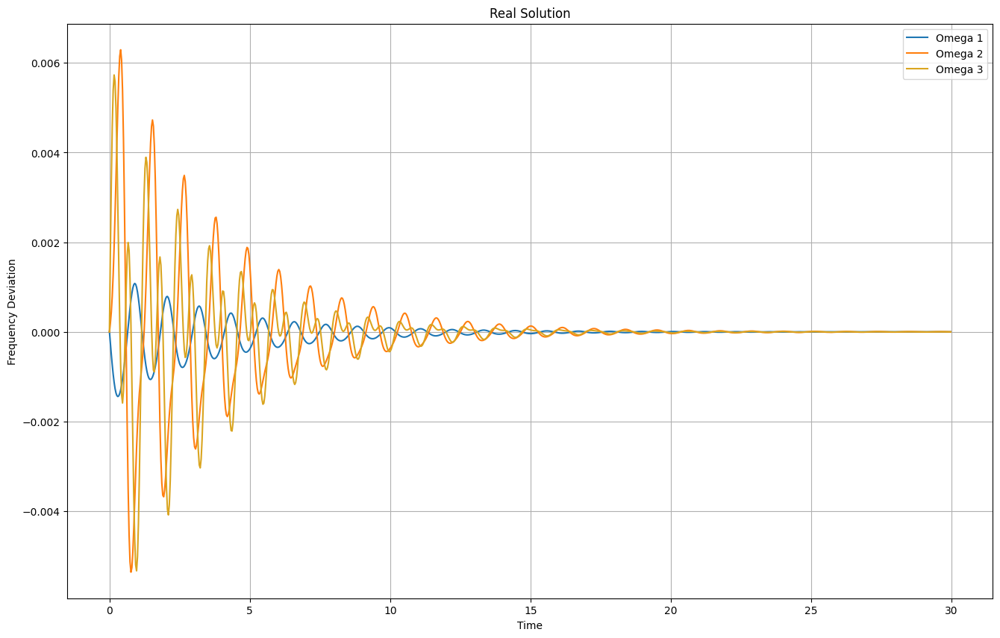

In [4]:
#Plot Correct Data
plt.figure(figsize=(16, 10))
plt.plot(t.cpu().numpy(), true_omega1.cpu().numpy(), label='Omega 1')
plt.plot(t.cpu().numpy(), true_omega2.cpu().numpy(), label='Omega 2')
plt.plot(t.cpu().numpy(), true_omega3.cpu().numpy(), label='Omega 3', color='goldenrod')
plt.xlabel('Time')
plt.ylabel('Frequency Deviation')
plt.title('Real Solution')
plt.legend()
plt.grid(True)
plt.show()

In [5]:
#Define Mini-Batches
def get_batch():
    s = torch.from_numpy(np.random.choice(np.arange(data_size - batch_time, dtype=np.int64), batch_size, replace=False))
    batch_x0 = true_x[s]
    batch_t = t[:batch_time]
    batch_x = torch.stack([true_x[s + i] for i in range(batch_time)], dim=0)
    return s.to(device), batch_x0.to(device), batch_t.to(device), batch_x.to(device)

In [6]:
#Visualization

def visualize(true_x, pred_x, t, omega0, viz, save_path):
    if viz:
        # Create a 3x2 subplot layout
        fig, axs = plt.subplots(3, 2, figsize=(16, 10), facecolor='white')

        # Generator 1 - Rotor Angle and Frequency Deviation
        axs[0, 0].set_title('Generator 1 - Rotor Angle')
        axs[0, 0].set_xlabel('Time [s]')
        axs[0, 0].set_ylabel('Rotor Angle [p.u.]')
        axs[0, 0].plot(t.cpu().numpy(), true_x.cpu().numpy()[:,0,0], label='True $\delta_1$')
        axs[0, 0].plot(t.cpu().numpy(), pred_x.cpu().numpy()[:,0,0], '--', label='Predicted $\delta_1$')
        axs[0, 0].legend()

        axs[0, 1].set_title('Generator 1 - Frequency Deviation')
        axs[0, 1].set_xlabel('Time [s]')
        axs[0, 1].set_ylabel('Frequency Deviation [p.u.]')
        axs[0, 1].plot(t.cpu().numpy(), true_x.cpu().numpy()[:,1,0] / omega0, label='True $\omega_1$')
        axs[0, 1].plot(t.cpu().numpy(), pred_x.cpu().numpy()[:,1,0] / omega0, '--', label='Predicted $\omega_1$')
        axs[0, 1].legend()

        # Generator 2 - Rotor Angle and Frequency Deviation
        axs[1, 0].set_title('Generator 2 - Rotor Angle')
        axs[1, 0].set_xlabel('Time [s]')
        axs[1, 0].set_ylabel('Rotor Angle [p.u.]')
        axs[1, 0].plot(t.cpu().numpy(), true_x.cpu().numpy()[:,2,0], label='True $\delta_2$')
        axs[1, 0].plot(t.cpu().numpy(), pred_x.cpu().numpy()[:,2,0], '--', label='Predicted $\delta_2$')
        axs[1, 0].legend()

        axs[1, 1].set_title('Generator 2 - Frequency Deviation')
        axs[1, 1].set_xlabel('Time [s]')
        axs[1, 1].set_ylabel('Frequency Deviation [p.u.]')
        axs[1, 1].plot(t.cpu().numpy(), true_x.cpu().numpy()[:,3,0] / omega0, label='True $\omega_2$')
        axs[1, 1].plot(t.cpu().numpy(), pred_x.cpu().numpy()[:,3,0] / omega0, '--', label='Predicted $\omega_2$')
        axs[1, 1].legend()

        # Generator 3 - Rotor Angle and Frequency Deviation
        axs[2, 0].set_title('Generator 3 - Rotor Angle')
        axs[2, 0].set_xlabel('Time [s]')
        axs[2, 0].set_ylabel('Rotor Angle [p.u.]')
        axs[2, 0].plot(t.cpu().numpy(), true_x.cpu().numpy()[:,4,0], label='True $\delta_3$')
        axs[2, 0].plot(t.cpu().numpy(), pred_x.cpu().numpy()[:,4,0], '--', label='Predicted $\delta_3$')
        axs[2, 0].legend()

        axs[2, 1].set_title('Generator 3 - Frequency Deviation')
        axs[2, 1].set_xlabel('Time [s]')
        axs[2, 1].set_ylabel('Frequency Deviation [p.u.]')
        axs[2, 1].plot(t.cpu().numpy(), true_x.cpu().numpy()[:,5,0] / omega0, label='True $\omega_3$')
        axs[2, 1].plot(t.cpu().numpy(), pred_x.cpu().numpy()[:,5,0] / omega0, '--', label='Predicted $\omega_3$')
        axs[2, 1].legend()

        # Adjust layout
        plt.tight_layout()
        
        # Create directory if it doesn't exist and save the figure
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path)

        # Show the plot
        plt.show()

        # Close the plot to free up memory
        plt.close(fig)


In [7]:
#NN to learn the ODE

class NeuralODE(nn.Module):
    def __init__(self, M1, D1, M2, D2, M3, D3, V1, V2, V3, B12, B13, B23, G12, G13, G23, Pmech1, Pmech2, Pmech3):
        super(NeuralODE, self).__init__()
        self.M1 = M1
        self.M2 = nn.Parameter(M2)
        self.M3 = nn.Parameter(M3)
        self.D1 = D1
        self.D2 = nn.Parameter(D2)
        self.D3 = nn.Parameter(D3)
        self.V1 = V1
        #self.V2 = V2
        self.V2 = nn.Parameter(V2)
        #self.V3 = V3
        self.V3 = nn.Parameter(V3)
        self.B12 = B12
        self.B13 = B13
        self.B23 = B23
        self.G12 = G12
        self.G13 = G13
        self.G23 = G23
        self.Pmech1 = Pmech1
        #self.Pmech2 = Pmech2
        self.Pmech2 = nn.Parameter(Pmech2)
        #self.Pmech3 = Pmech3
        self.Pmech3 = nn.Parameter(Pmech3)

    def forward(self, t, y):
        dydt = torch.zeros_like(y)
        dydt[0] = y[1]
        dydt[1] = (-self.D1*y[1]/omega0 + self.V1*self.V2*self.B12*torch.sin(y[0]-y[2]) - self.V1*self.V2*self.G12*torch.cos(y[0]-y[2]) + self.V1*self.V3*self.B13*torch.sin(y[0]-y[4]) - self.V1*self.V3*self.G13*torch.cos(y[0]-y[4]) + self.Pmech1)*omega0/self.M1
        dydt[2] = y[3]
        dydt[3] = (-self.D2*y[3]/omega0 + self.V1*self.V2*self.B12*torch.sin(y[2]-y[0]) - self.V1*self.V2*self.G12*torch.cos(y[2]-y[0]) + self.V2*self.V3*self.B23*torch.sin(y[2]-y[4]) - self.V2*self.V3*self.G23*torch.cos(y[2]-y[4]) + self.Pmech2)*omega0/self.M2
        dydt[4] = y[5]
        dydt[5] = (-self.D3*y[5]/omega0 + self.V1*self.V3*self.B13*torch.sin(y[4]-y[0]) - self.V1*self.V3*self.G13*torch.cos(y[4]-y[0]) + self.V2*self.V3*self.B23*torch.sin(y[4]-y[2]) - self.V2*self.V3*self.G23*torch.cos(y[4]-y[2]) + self.Pmech3)*omega0/self.M3
        self.dydt = dydt
        return dydt

In [8]:
#DEBUGGING ZONE

Delta = 1.000001 #Porcentual deviation from real value
TargetPercent = 1
M1_G = M1
D1_G = D1
M2_G = Delta*M2
D2_G = Delta*D2
M3_G = Delta*M3
D3_G = Delta*D3
V1_G = v1star
V2_G = v2star
V3_G = v3star
B12_G = B12
B13_G = B13
B23_G = B23
G12_G = G12
G13_G = G13
G23_G = G23
Pmech1_G = Pmech1star
Pmech2_G = Pmech2star
Pmech3_G = Pmech3star

def percent_deviation(current_value, target_value):
     return abs(current_value - target_value) / target_value * 100


print(f"M1: {M1.item()}", f"M1_G: {M1_G.item()}")
print(f"D1: {D1.item()}", f"D1_G: {D1_G.item()}")
print(f"M2: {M2.item()}", f"M2_G: {M2_G.item()}")
print(f"D2: {D2.item()}", f"D2_G: {D2_G.item()}")
print(f"M3: {M3.item()}", f"M3_G: {M3_G.item()}")
print(f"D3: {D3.item()}", f"D3_G: {D3_G.item()}")
print(f"V1: {v1star.item()}", f"V1_G: {V1_G.item()}")
print(f"V2: {v2star.item()}", f"V2_G: {V2_G.item()}")
print(f"V3: {v3star.item()}", f"V3_G: {V3_G.item()}")
print(f"B12: {B12.item()}", f"B12_G: {B12_G.item()}")
print(f"B13: {B13.item()}", f"B13_G: {B13_G.item()}")
print(f"B23: {B23.item()}", f"B23_G: {B23_G.item()}")
print(f"G12: {G12.item()}", f"G12_G: {G12_G.item()}")
print(f"G13: {G13.item()}", f"G13_G: {G13_G.item()}")
print(f"G23: {G23.item()}", f"G23_G: {G23_G.item()}")
print(f"Pmech1: {Pmech1star.item()}", f"Pmech1_G: {Pmech1_G.item()}")
print(f"Pmech2: {Pmech2star.item()}", f"Pmech2_G: {Pmech2_G.item()}")
print(f"Pmech3: {Pmech3star.item()}", f"Pmech3_G: {Pmech3_G.item()}")

def get_batch():
    s = torch.from_numpy(np.random.choice(np.arange(data_size - batch_time, dtype=np.int64), batch_size, replace=False))
    batch_x0 = true_x[s]
    batch_t = t[:batch_time]
    batch_x = torch.stack([true_x[s + i] for i in range(batch_time)], dim=0)
    return s.to(device), batch_x0.to(device), batch_t.to(device), batch_x.to(device)

func = NeuralODE(M1_G, D1_G, M2_G, D2_G, M3_G, D3_G, V1_G, V2_G, V3_G, B12_G, B13_G, B23_G, G12_G, G13_G, G23_G, Pmech1_G, Pmech2_G, Pmech3_G).to(device)
optimizer = torch.optim.RMSprop(func.parameters(), lr = 0.001) #RMSprop
end = time.time()
ii = 0

s, batch_x0, batch_t, batch_x = get_batch()

with torch.no_grad():
     for batches in range(0,batch_size):
          pred_x = odeint(func, batch_x0[batches], batch_t, method=method).to(device)
          print(batches+1)
     
#visualize(batch_x, pred_x, func, 0)     

M1: 100 M1_G: 100
D1: 10 D1_G: 10
M2: 18 M2_G: 18.000017166137695
D2: 10 D2_G: 10.000009536743164
M3: 12 M3_G: 12.000011444091797
D3: 10 D3_G: 10.000009536743164
V1: 2.3427014350891113 V1_G: 2.3427014350891113
V2: 2.4178388118743896 V2_G: 2.4178388118743896
V3: 2.050366163253784 V3_G: 2.050366163253784
B12: -0.3108944296836853 B12_G: -0.3108944296836853
B13: -0.3729841411113739 B13_G: -0.3729841411113739
B23: -0.42915892601013184 B23_G: -0.42915892601013184
G12: 0.0005956920795142651 G12_G: 0.0005956920795142651
G13: -0.007639070972800255 G13_G: -0.007639070972800255
G23: -0.004693638999015093 G23_G: -0.004693638999015093
Pmech1: 2.4783172607421875 Pmech1_G: 2.4783172607421875
Pmech2: -3.023956298828125 Pmech2_G: -3.023956298828125
Pmech3: 0.4481532573699951 Pmech3_G: 0.4481532573699951
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


In [9]:
#DEBUG PRINT
print(batch_x.size())
print(pred_x.size())

print(pred_x[0,0:2,0])
print(batch_x[0,4,0:2,0])
print(pred_x[0,0:2,0] - batch_x[0,4,0:2,0])



torch.Size([30, 20, 6, 1])
torch.Size([30, 6, 1])
tensor([ 0.8703, -0.2409])
tensor([5.9598e-01, 4.8428e-04])
tensor([ 0.2744, -0.2414])


M1: 100 M1_G: 100
D1: 10 D1_G: 10
M2: 18 M2_G: 19.80000114440918
D2: 10 D2_G: 11.0
M3: 12 M3_G: 13.200000762939453
D3: 10 D3_G: 11.0
V1: 2.3427014350891113 V1_G: 2.3427014350891113
V2: 2.4178388118743896 V2_G: 2.6596226692199707
V3: 2.050366163253784 V3_G: 2.2554028034210205
B12: -0.3108944296836853 B12_G: -0.3108944296836853
B13: -0.3729841411113739 B13_G: -0.3729841411113739
B23: -0.42915892601013184 B23_G: -0.42915892601013184
G12: 0.0005956920795142651 G12_G: 0.0005956920795142651
G13: -0.007639070972800255 G13_G: -0.007639070972800255
G23: -0.004693638999015093 G23_G: -0.004693638999015093
Pmech1: 2.4783172607421875 Pmech1_G: 2.4783172607421875
Pmech2: -3.023956298828125 Pmech2_G: -3.326352119445801
Pmech3: 0.4481532573699951 Pmech3_G: 0.4929685890674591
Initial Parameters:
M2: 19.80000114440918
M3: 13.200000762939453
D2: 11.0
D3: 11.0
V2: 2.6596226692199707
V3: 2.2554028034210205
Pmech2: -3.326352119445801
Pmech3: 0.4929685890674591


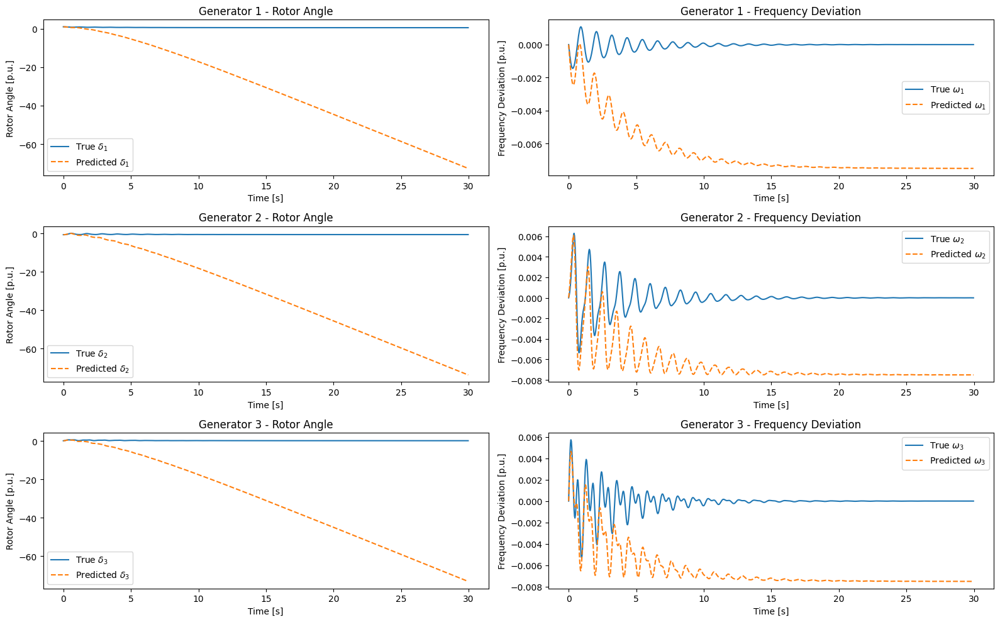


Iteration 0 | Total Loss 181.10948181152343750000
Updated Parameters:
M2: 20.29754066467285
M3: 13.715814590454102
D2: 10.68355941772461
D3: 11.526786804199219
V2: 2.3349554538726807
V3: 2.7137839794158936
Pmech2: -3.2725818157196045
Pmech3: 0.54688960313797


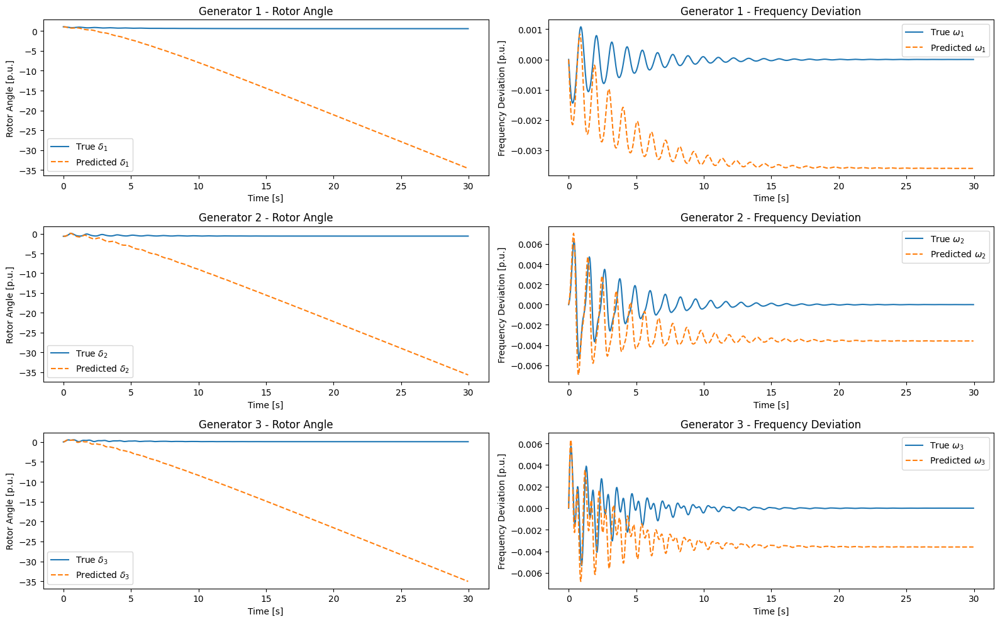

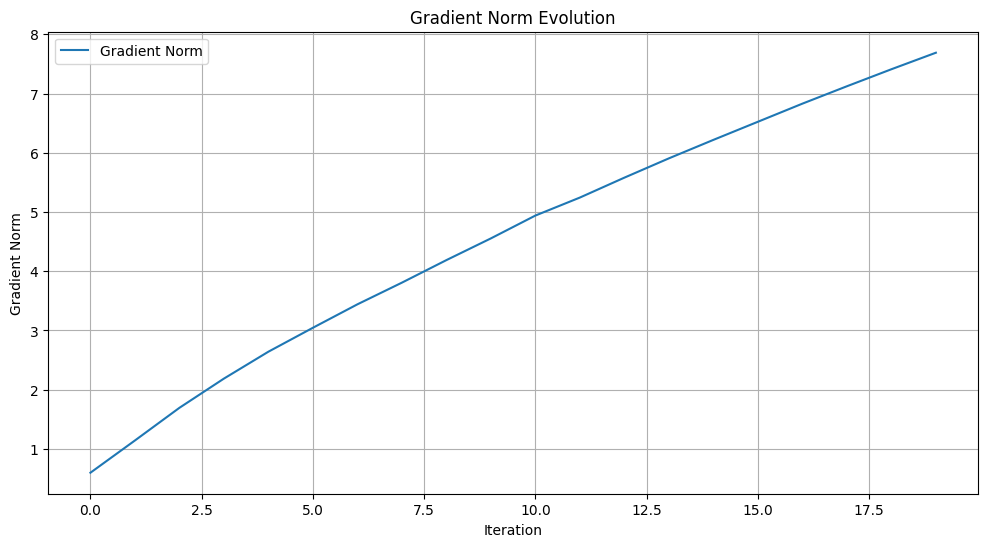


Iteration 20 | Total Loss 0.03782641142606735229
Updated Parameters:
M2: 19.9916934967041
M3: 13.137364387512207
D2: 11.653095245361328
D3: 11.955511093139648
V2: 2.0552914142608643
V3: 2.9270787239074707
Pmech2: -3.2144672870635986
Pmech3: 0.6018303632736206


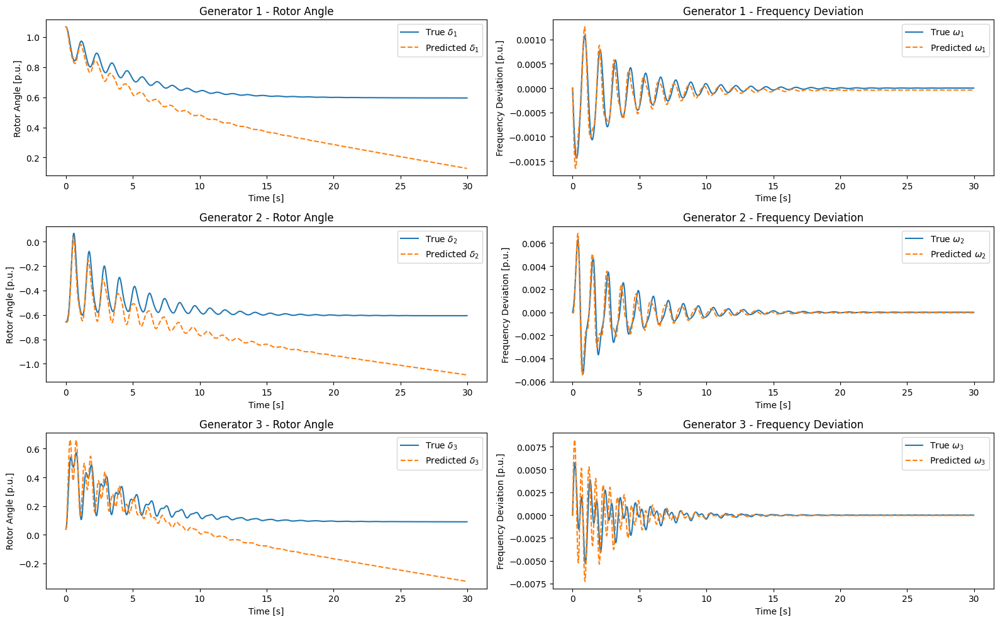

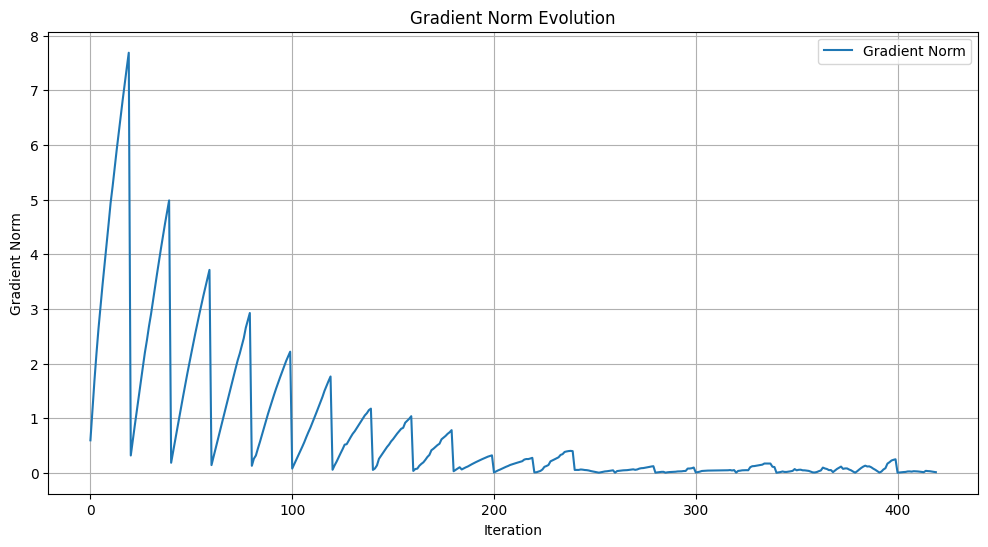


Iteration 40 | Total Loss 0.21354505419731140137
Updated Parameters:
M2: 19.045146942138672
M3: 12.28053092956543
D2: 12.67358112335205
D3: 13.039726257324219
V2: 2.1839182376861572
V3: 2.5455336570739746
Pmech2: -3.200477361679077
Pmech3: 0.6014561653137207


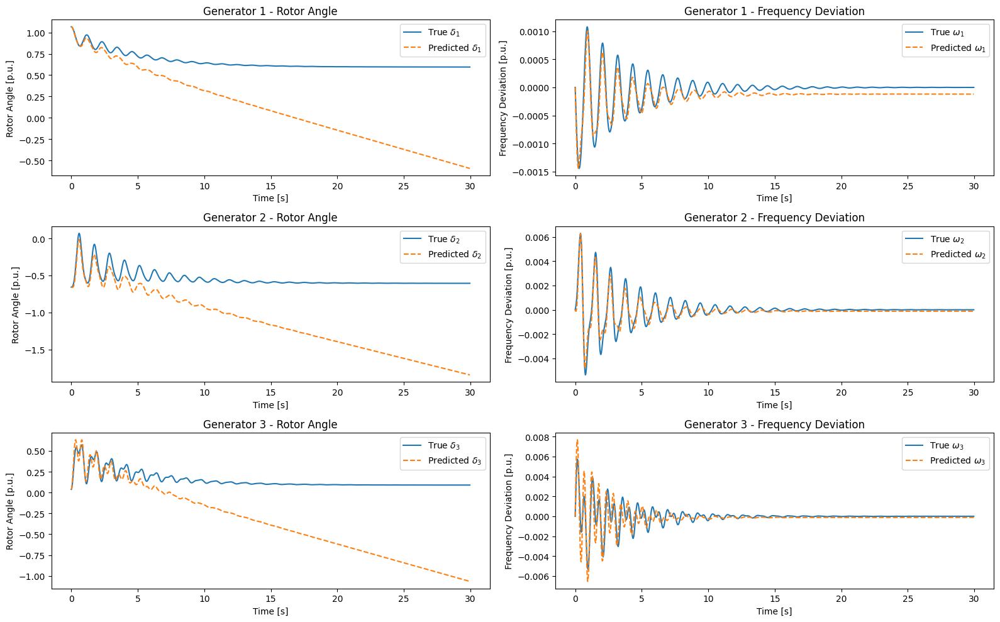

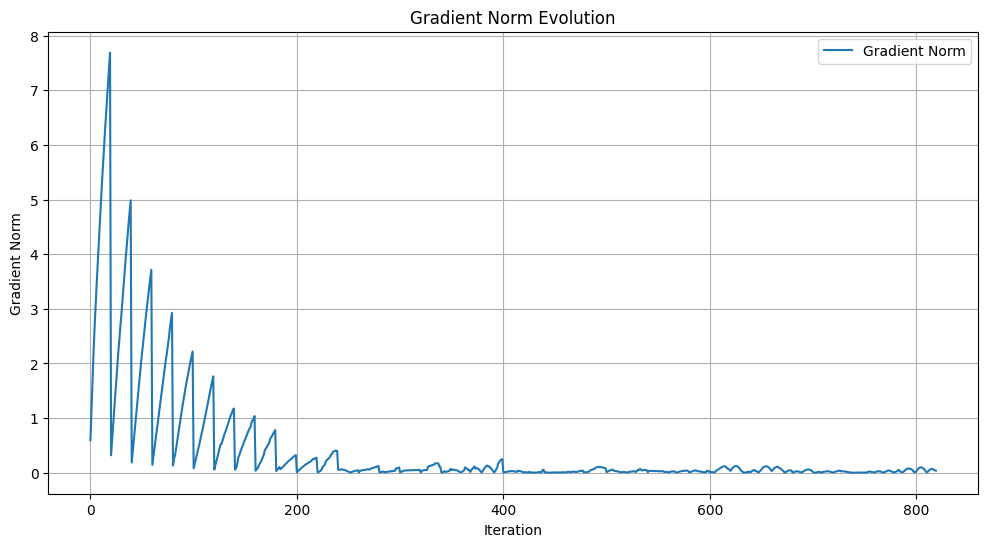


Iteration 60 | Total Loss 0.03696670383214950562
Updated Parameters:
M2: 18.263113021850586
M3: 12.190114974975586
D2: 12.557183265686035
D3: 13.60733413696289
V2: 2.364854097366333
V3: 2.2415366172790527
Pmech2: -3.1719863414764404
Pmech3: 0.5862106084823608


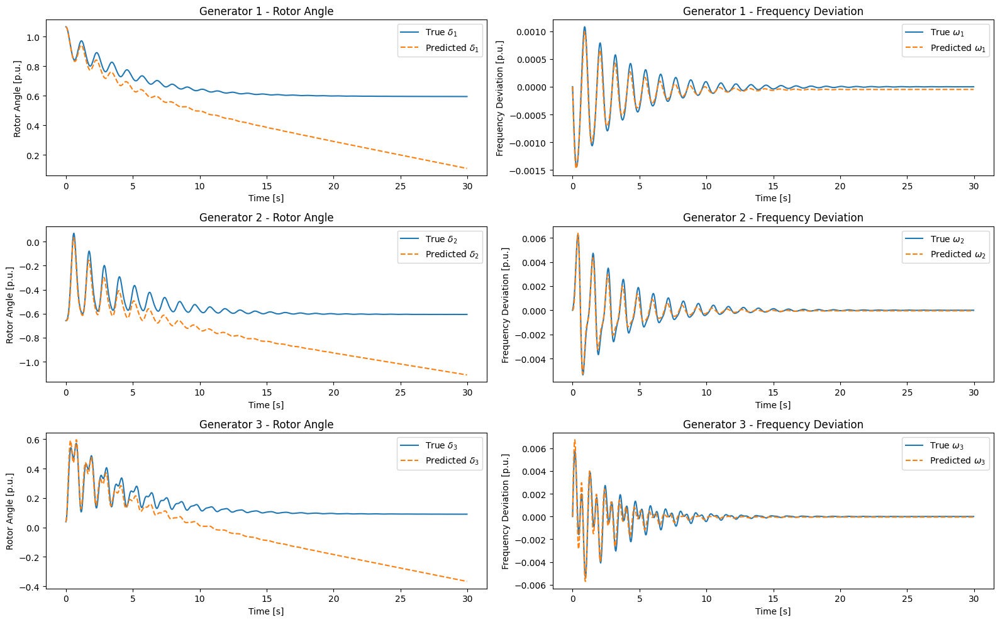

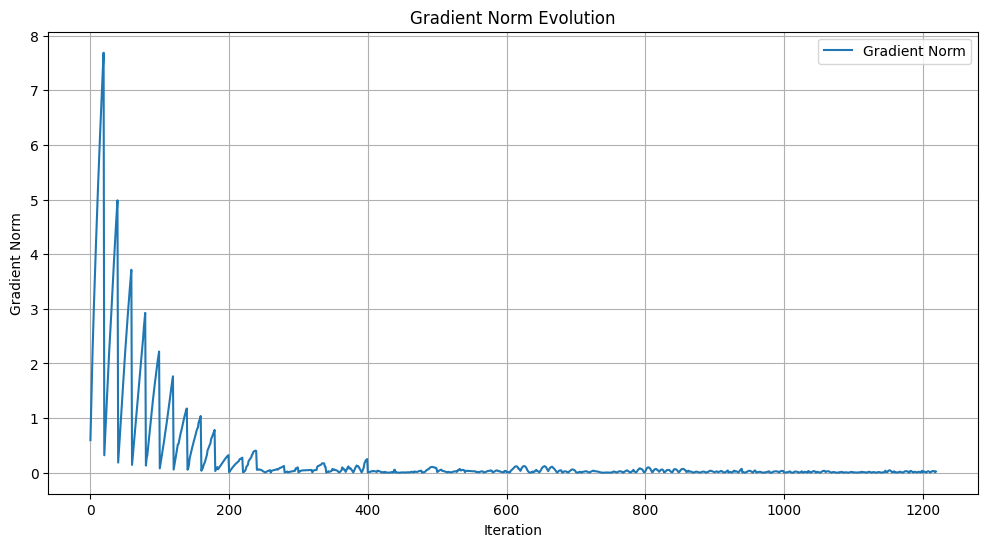


Iteration 80 | Total Loss 0.03921116143465042114
Updated Parameters:
M2: 17.86365509033203
M3: 12.336596488952637
D2: 11.276521682739258
D3: 12.868977546691895
V2: 2.438441276550293
V3: 2.101522207260132
Pmech2: -3.1387298107147217
Pmech3: 0.5584749579429626


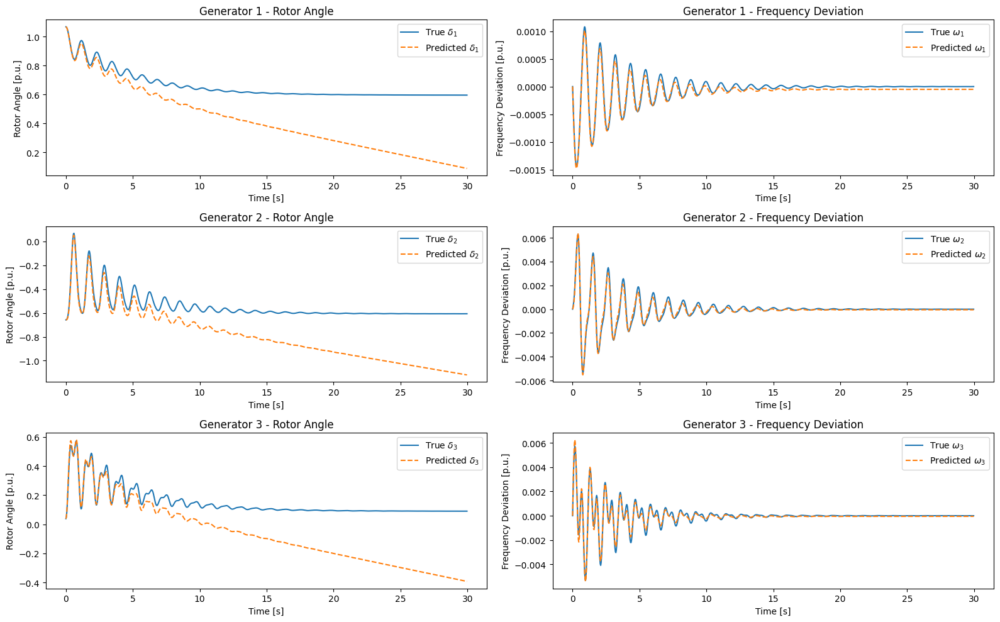

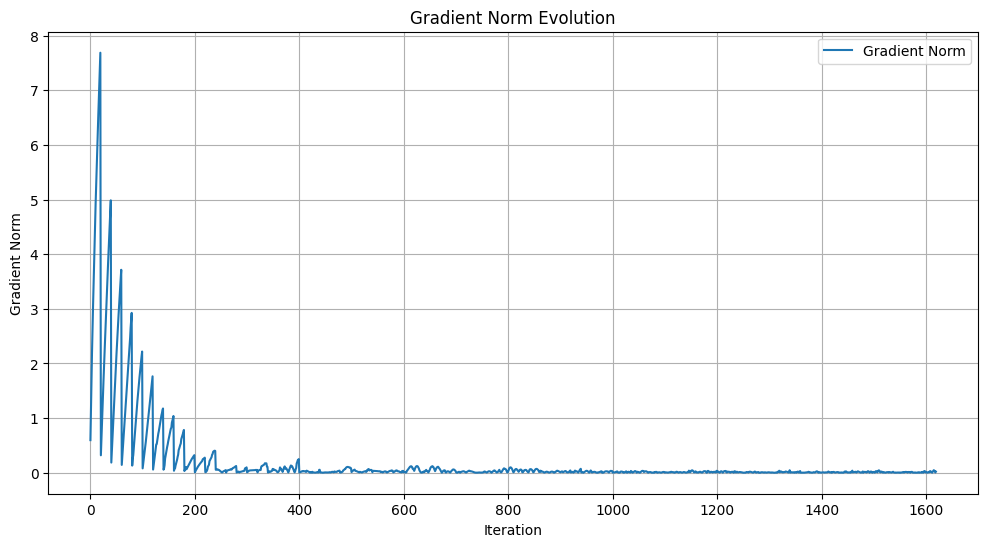


Iteration 100 | Total Loss 0.18976165354251861572
Updated Parameters:
M2: 17.953704833984375
M3: 12.19225025177002
D2: 10.241186141967773
D3: 12.000571250915527
V2: 2.4614768028259277
V3: 2.028571844100952
Pmech2: -3.1123600006103516
Pmech3: 0.5334537625312805


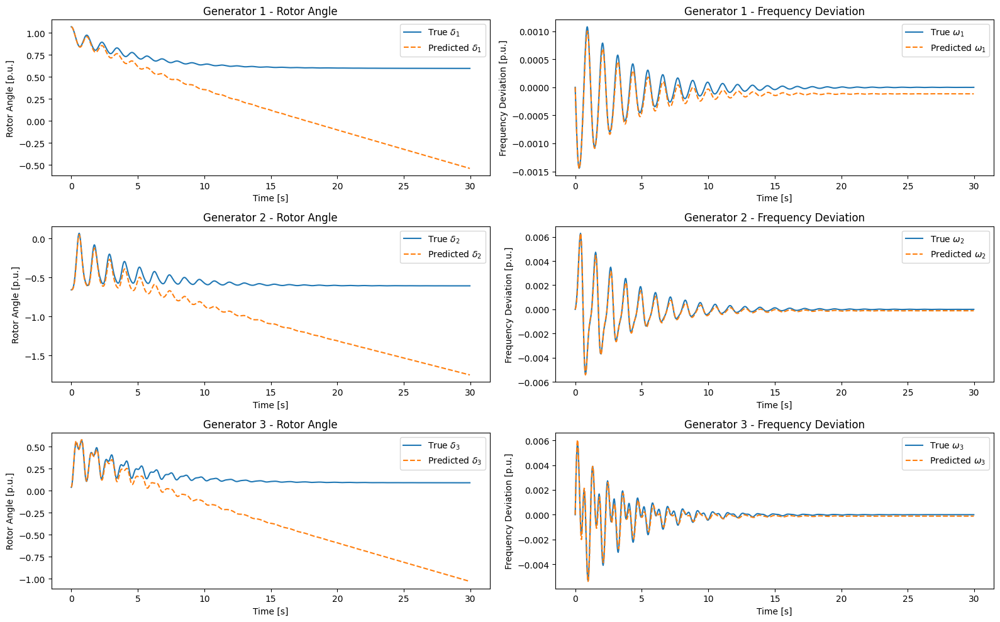

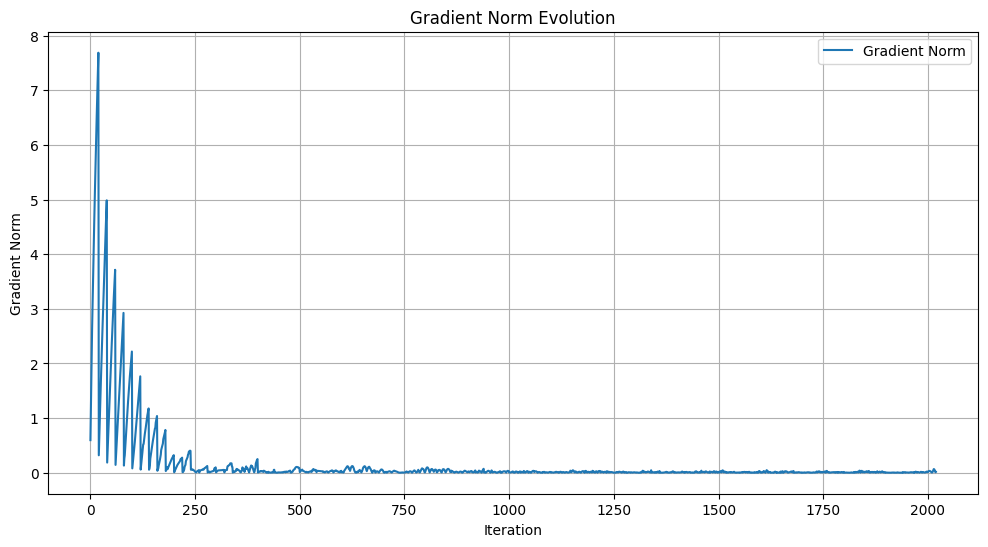


Iteration 120 | Total Loss 0.00412755506113171577
Updated Parameters:
M2: 17.826488494873047
M3: 12.106507301330566
D2: 9.811123847961426
D3: 11.692699432373047
V2: 2.481537342071533
V3: 1.9969967603683472
Pmech2: -3.1009280681610107
Pmech3: 0.5263922810554504


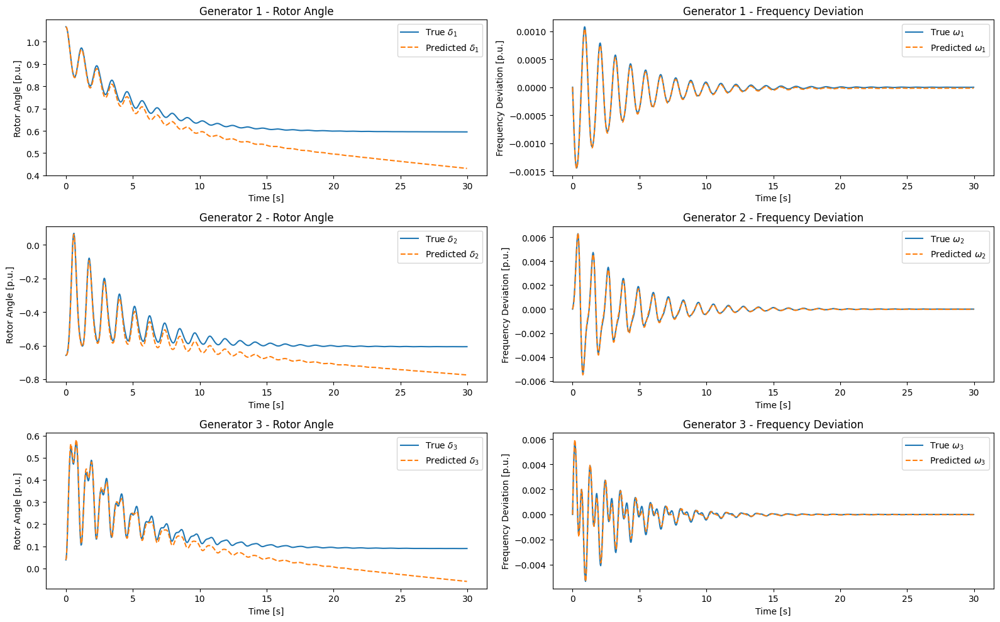

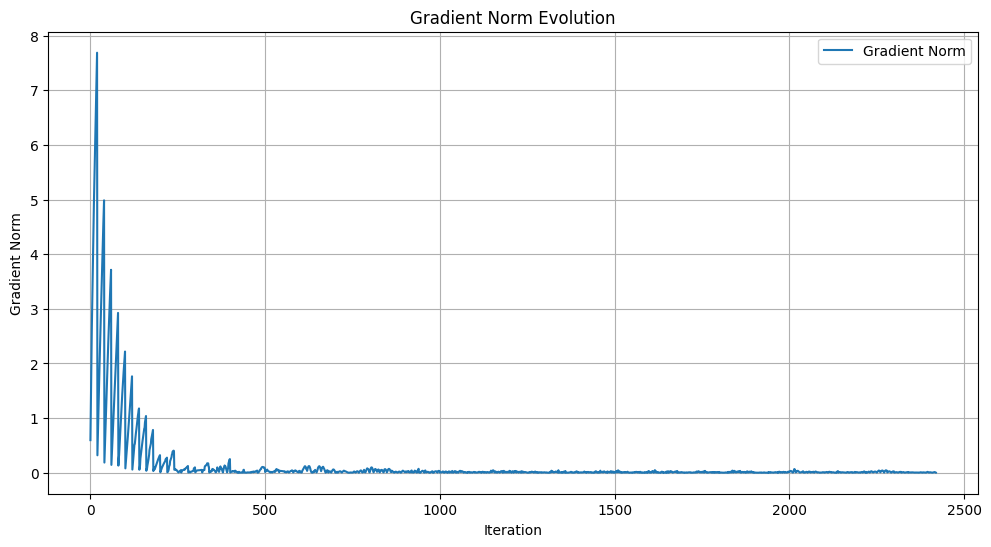


Iteration 140 | Total Loss 0.38084712624549865723
Updated Parameters:
M2: 17.82474708557129
M3: 12.002774238586426
D2: 9.579514503479004
D3: 11.194602012634277
V2: 2.47086763381958
V3: 2.0132040977478027
Pmech2: -3.0885818004608154
Pmech3: 0.5189889073371887


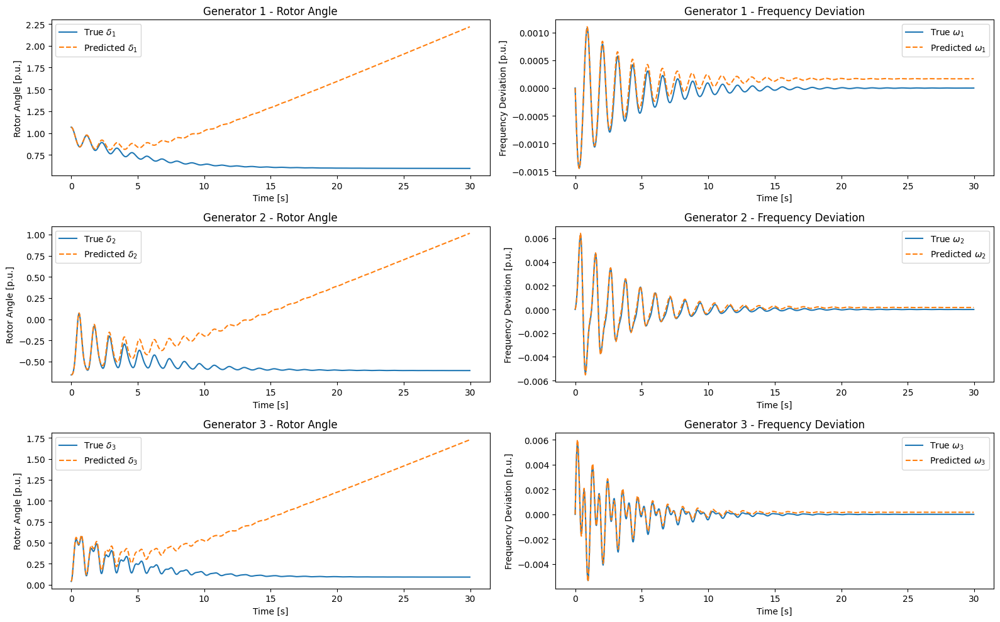

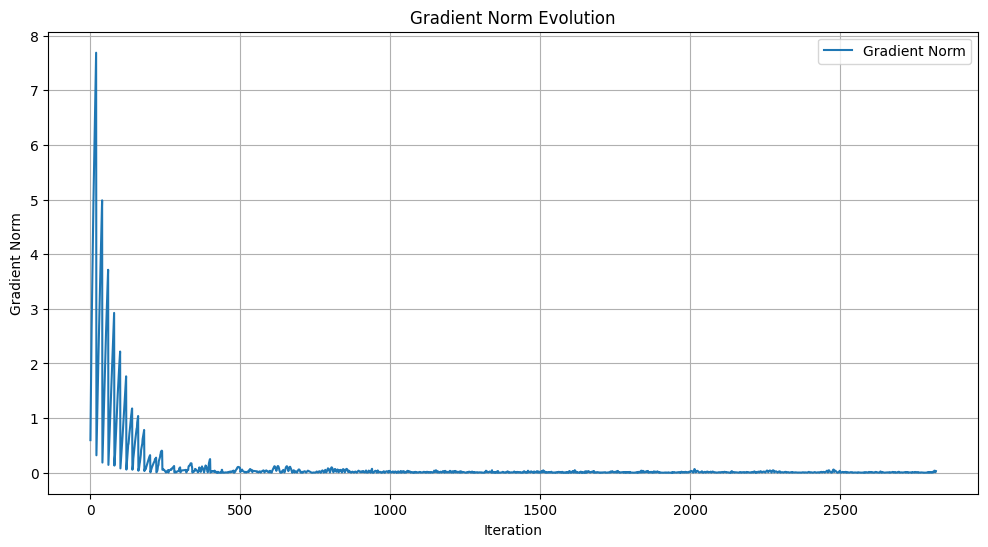


Iteration 160 | Total Loss 1.34283721446990966797
Updated Parameters:
M2: 17.730213165283203
M3: 11.76697826385498
D2: 9.480063438415527
D3: 10.979628562927246
V2: 2.4710328578948975
V3: 2.027597427368164
Pmech2: -3.0793776512145996
Pmech3: 0.5132952928543091


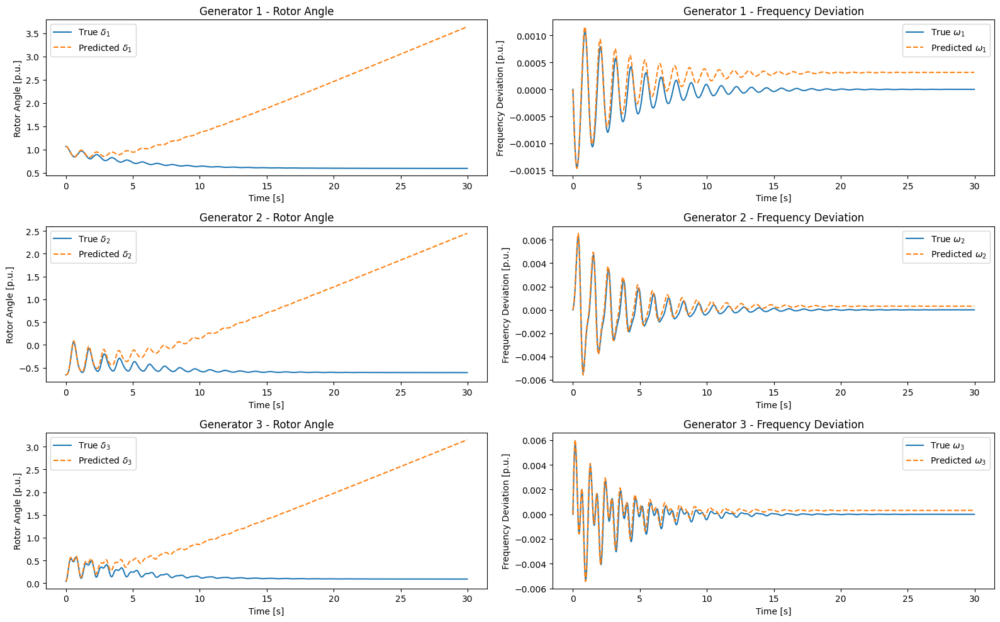

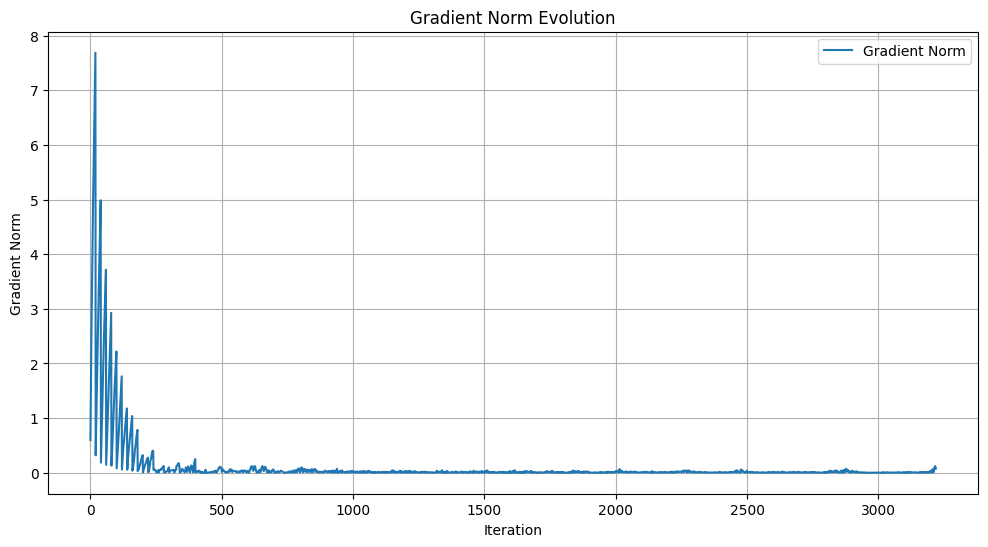


Iteration 180 | Total Loss 0.25784149765968322754
Updated Parameters:
M2: 17.785232543945312
M3: 11.981029510498047
D2: 9.332491874694824
D3: 10.760348320007324
V2: 2.4668471813201904
V3: 2.0081841945648193
Pmech2: -3.0793404579162598
Pmech3: 0.5091030597686768


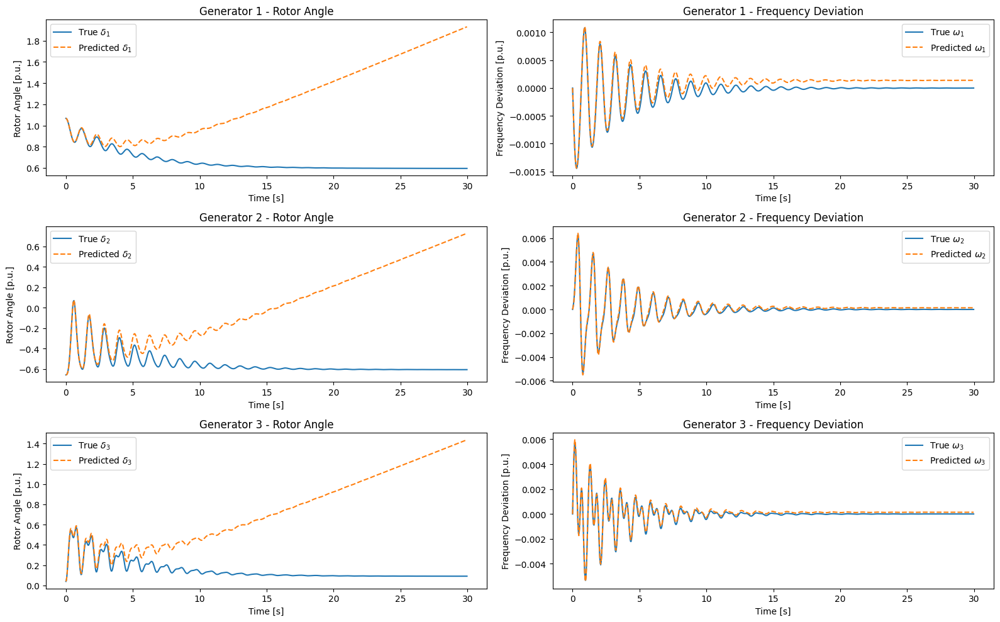

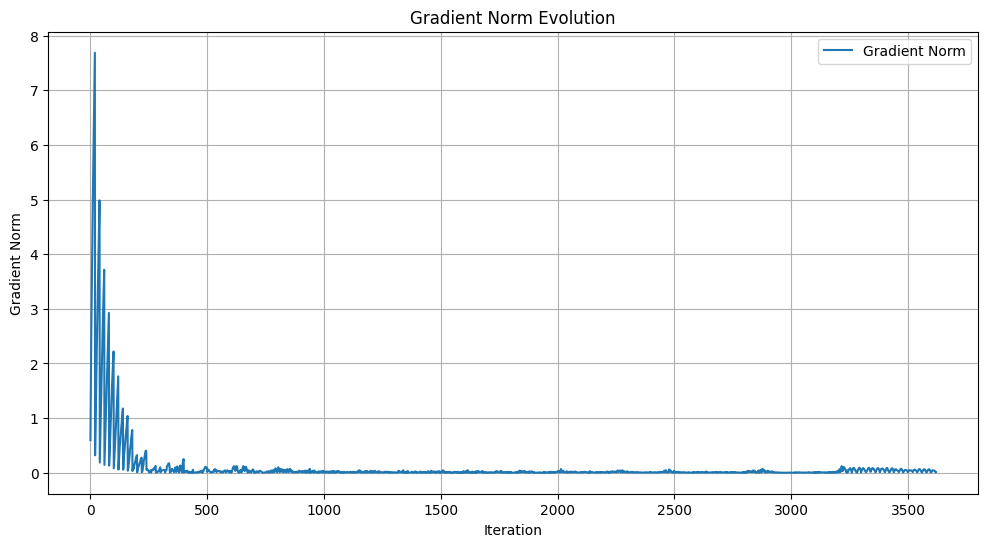


Iteration 200 | Total Loss 0.00145935814362019300
Updated Parameters:
M2: 17.832664489746094
M3: 11.918354034423828
D2: 9.171025276184082
D3: 10.565285682678223
V2: 2.4745054244995117
V3: 1.9849406480789185
Pmech2: -3.0765268802642822
Pmech3: 0.5035542249679565


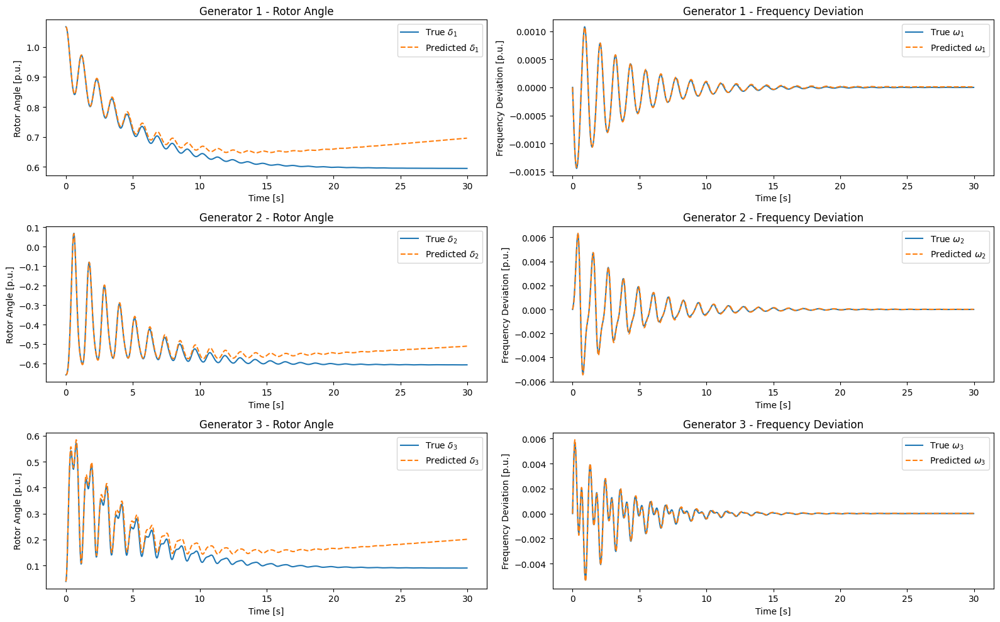

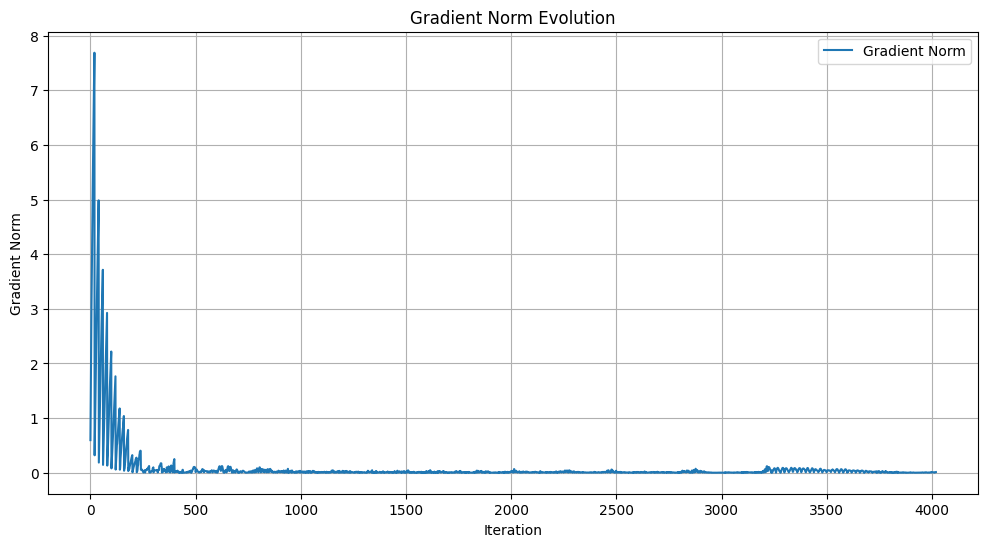


Iteration 220 | Total Loss 0.06924201548099517822
Updated Parameters:
M2: 17.863780975341797
M3: 11.869324684143066
D2: 9.19547176361084
D3: 10.54325008392334
V2: 2.4731972217559814
V3: 1.9826833009719849
Pmech2: -3.0693788528442383
Pmech3: 0.49833711981773376


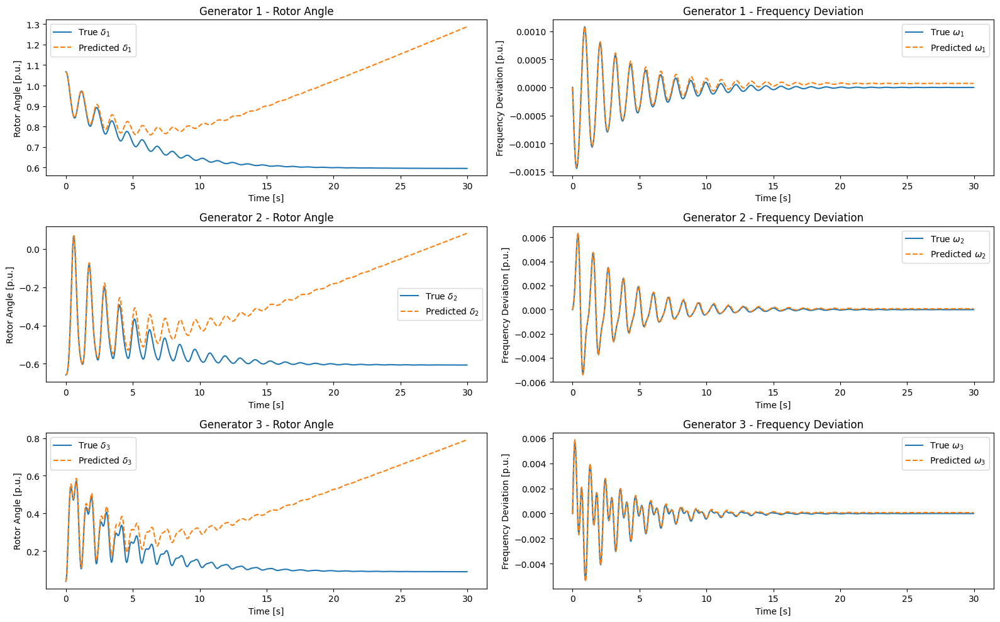

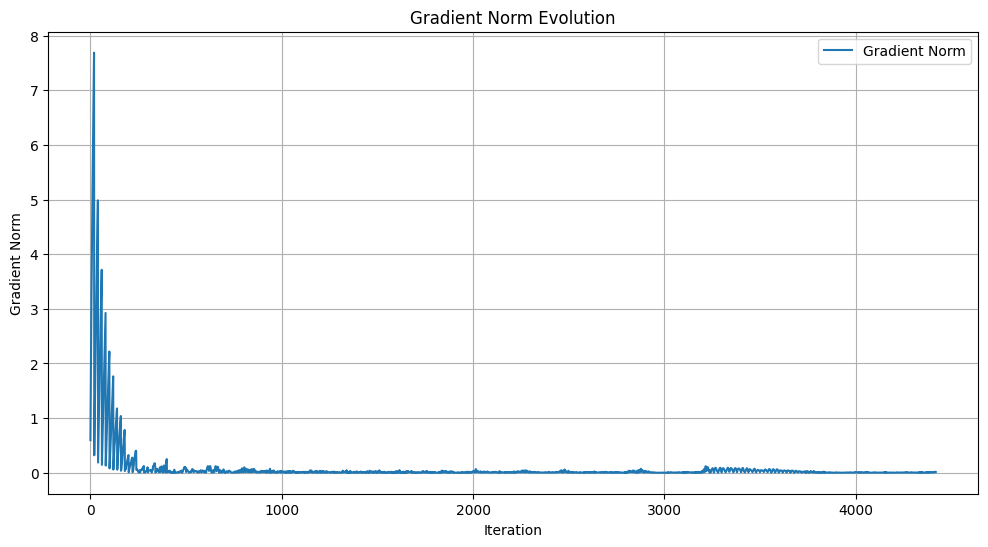


Iteration 240 | Total Loss 0.04111448675394058228
Updated Parameters:
M2: 17.883344650268555
M3: 11.887386322021484
D2: 9.239219665527344
D3: 10.501705169677734
V2: 2.4779248237609863
V3: 1.9867137670516968
Pmech2: -3.0649654865264893
Pmech3: 0.4930422604084015


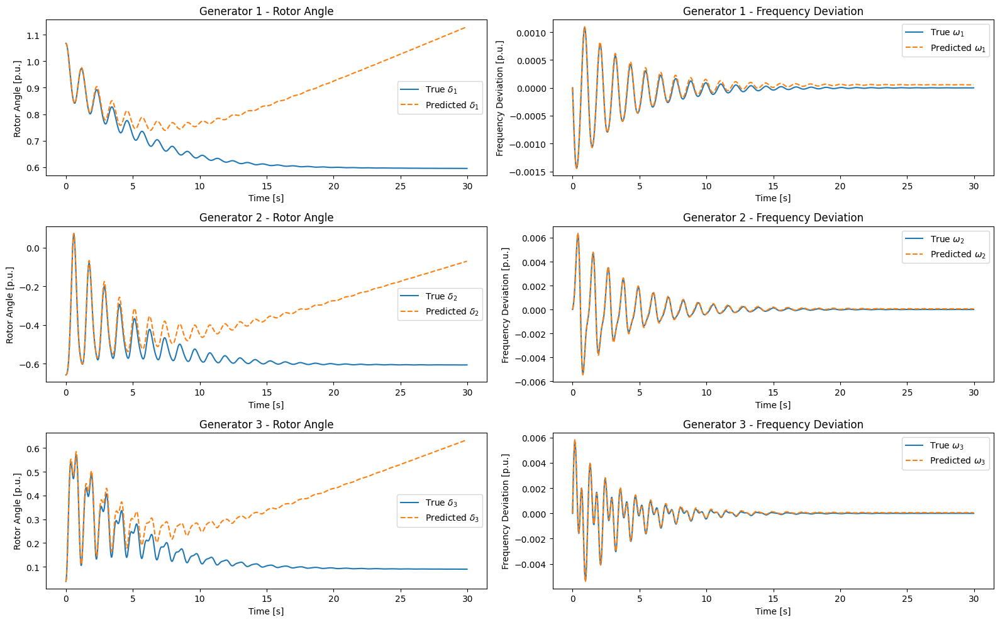

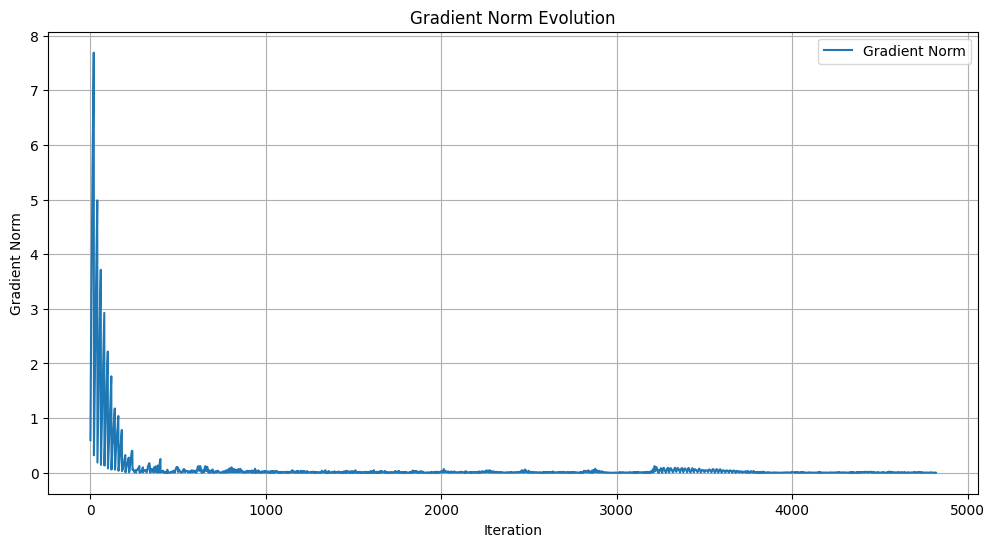


Iteration 260 | Total Loss 0.07828713953495025635
Updated Parameters:
M2: 17.878408432006836
M3: 11.925398826599121
D2: 9.290584564208984
D3: 10.325403213500977
V2: 2.465280055999756
V3: 1.9970961809158325
Pmech2: -3.060272455215454
Pmech3: 0.4886883795261383


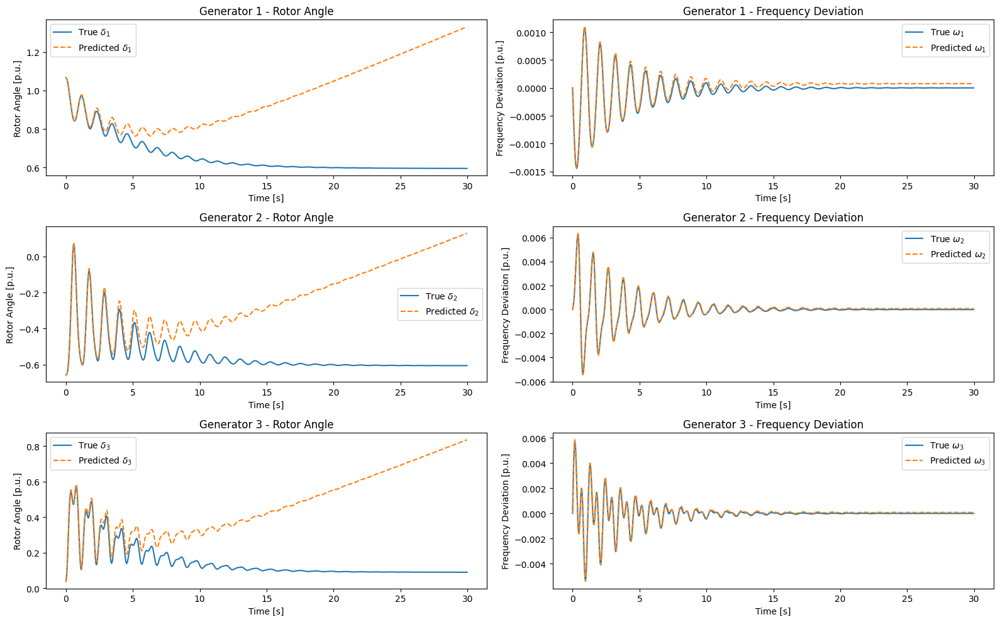

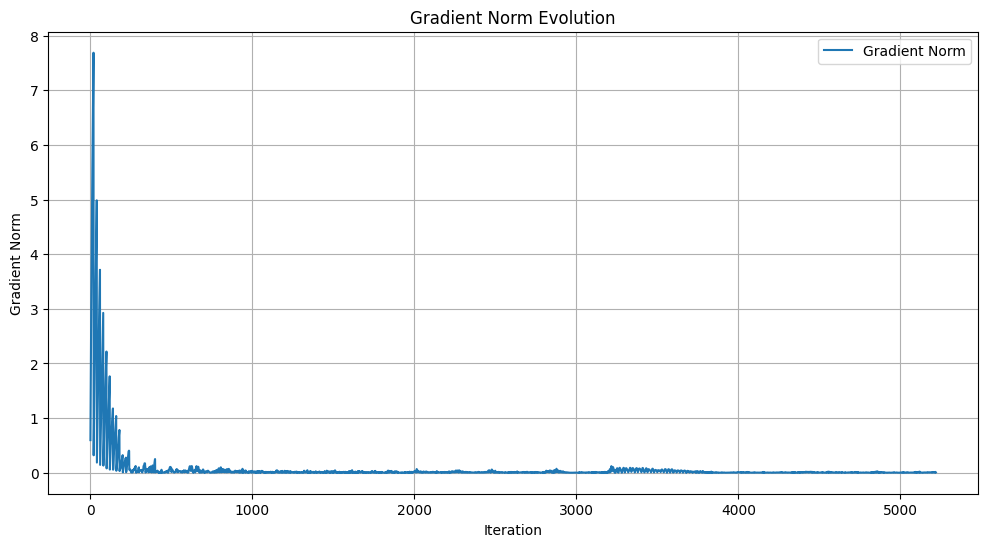


Iteration 280 | Total Loss 0.00172465573996305466
Updated Parameters:
M2: 17.940563201904297
M3: 11.922652244567871
D2: 9.350894927978516
D3: 10.216106414794922
V2: 2.459351062774658
V3: 1.9967448711395264
Pmech2: -3.056959629058838
Pmech3: 0.4829505681991577


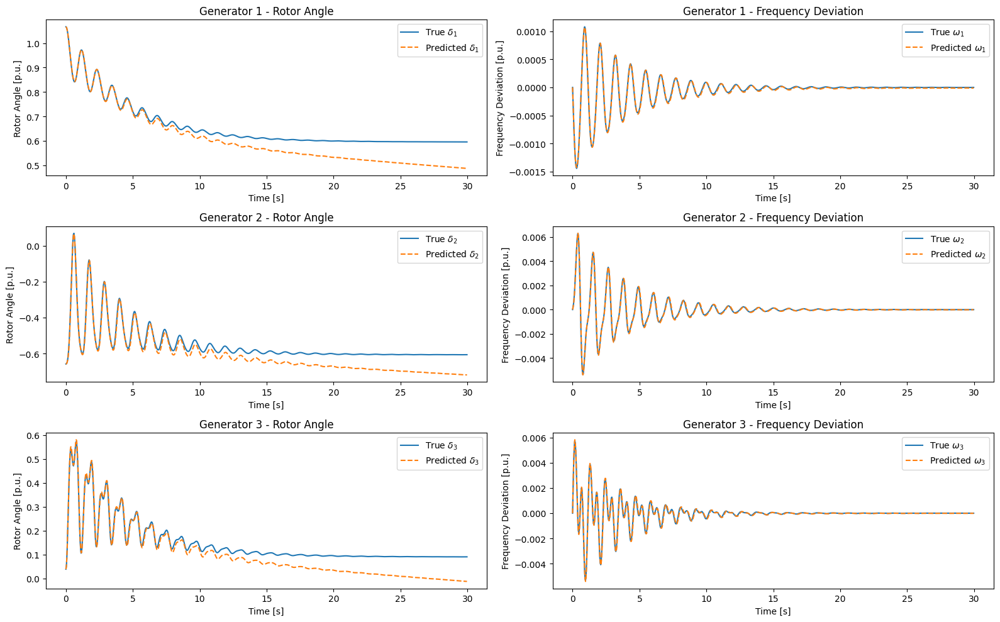

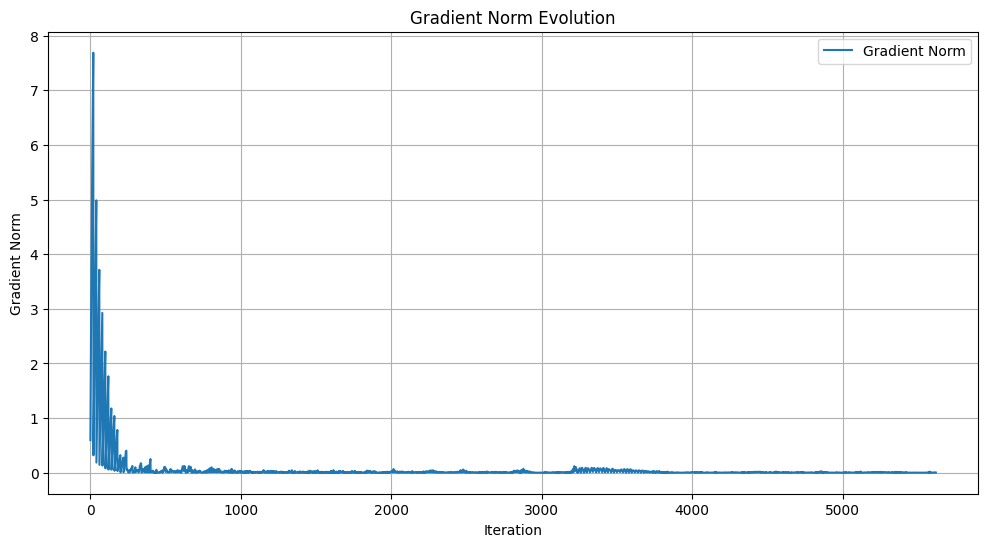


Iteration 300 | Total Loss 0.00247531826607882977
Updated Parameters:
M2: 17.90384292602539
M3: 11.924544334411621
D2: 9.55573558807373
D3: 10.177789688110352
V2: 2.4574666023254395
V3: 2.0021843910217285
Pmech2: -3.052079677581787
Pmech3: 0.4777033030986786


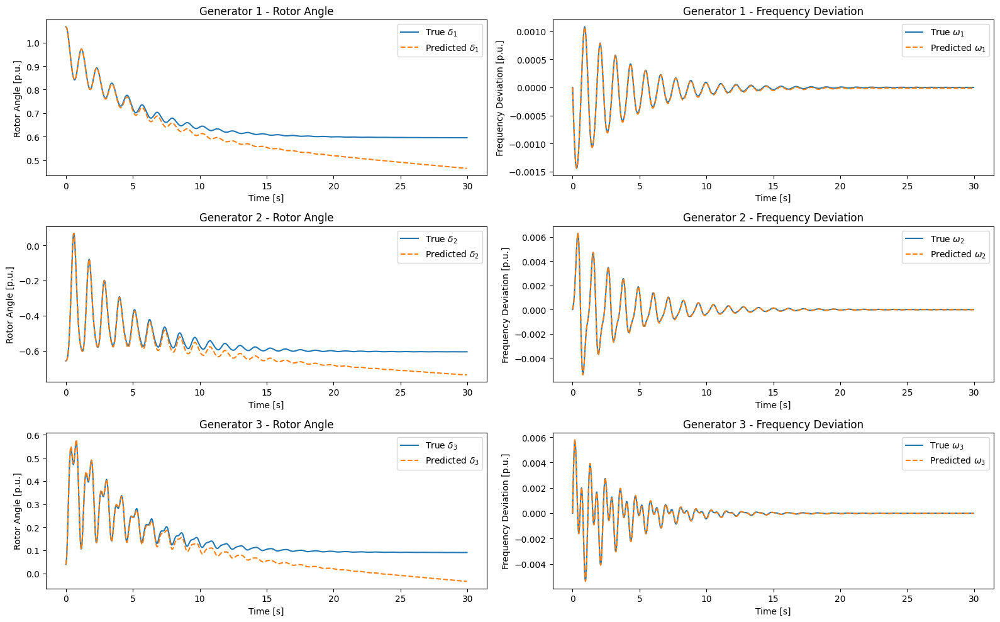

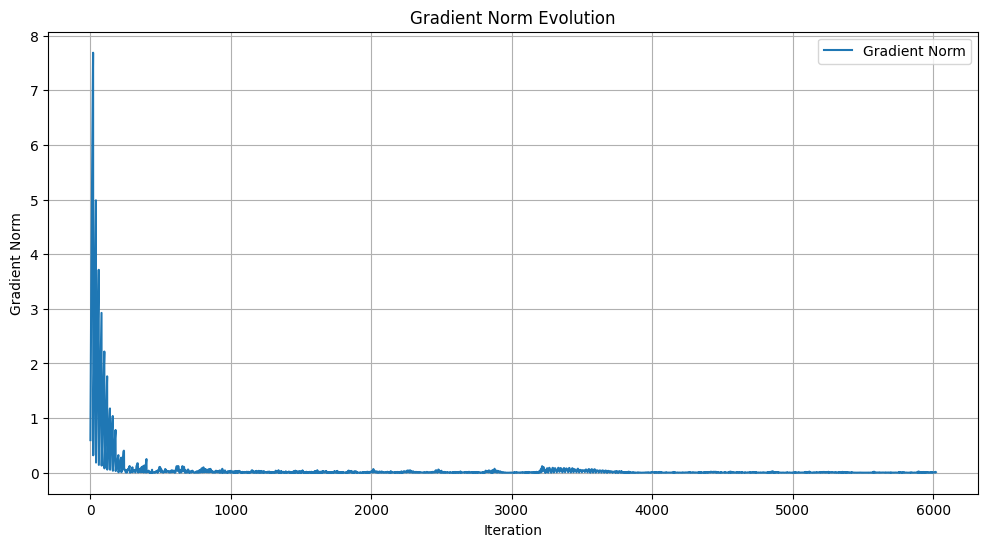


Iteration 320 | Total Loss 0.02473386377096176147
Updated Parameters:
M2: 17.933923721313477
M3: 11.915396690368652
D2: 9.586633682250977
D3: 10.073241233825684
V2: 2.448230028152466
V3: 2.0060982704162598
Pmech2: -3.0503079891204834
Pmech3: 0.4750884175300598


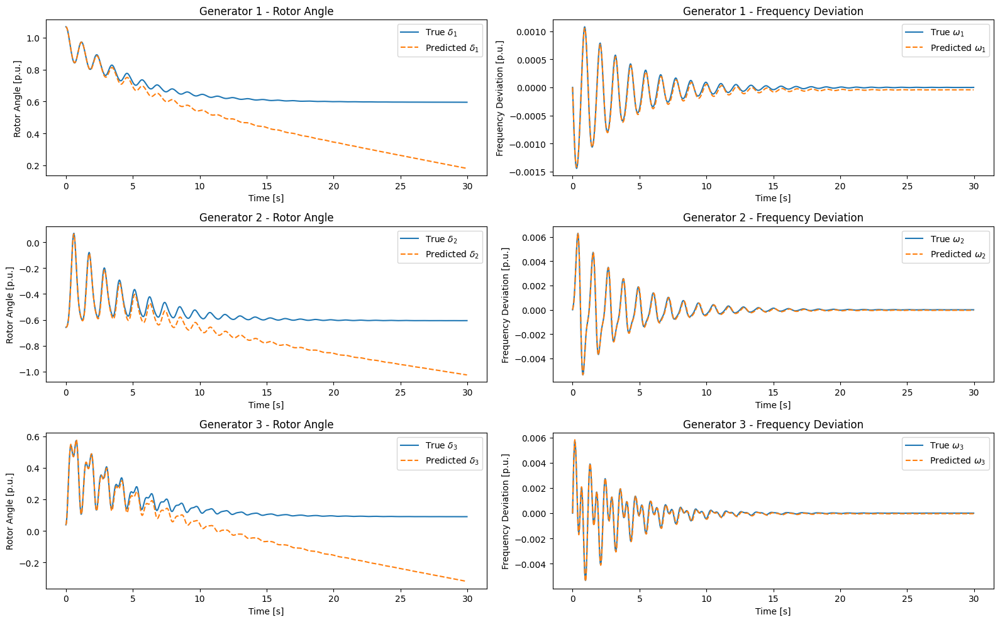

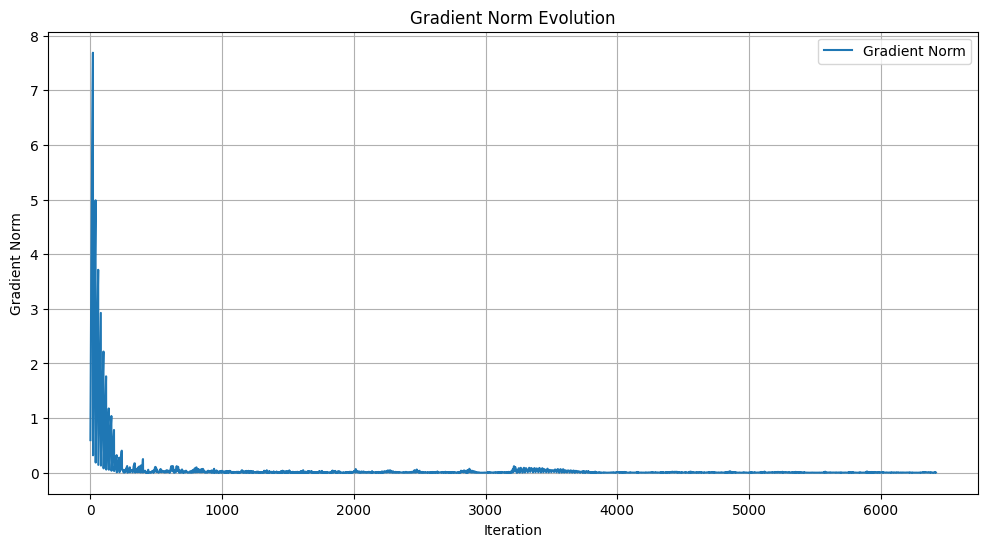


Iteration 340 | Total Loss 0.00963404215872287750
Updated Parameters:
M2: 17.928918838500977
M3: 11.922039031982422
D2: 9.576859474182129
D3: 10.023386001586914
V2: 2.452549695968628
V3: 2.015972137451172
Pmech2: -3.0474305152893066
Pmech3: 0.4735638201236725


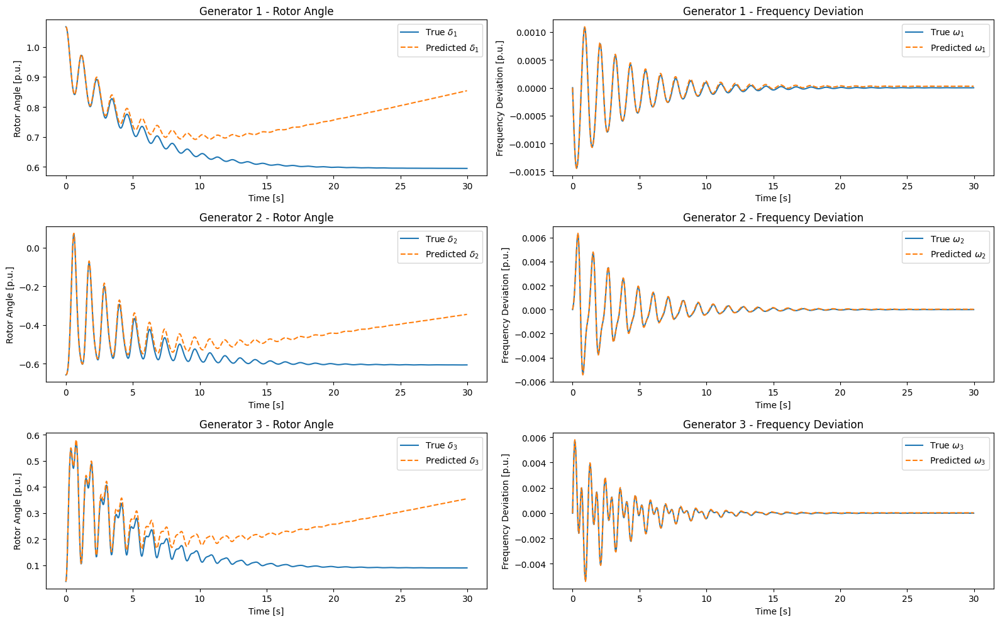

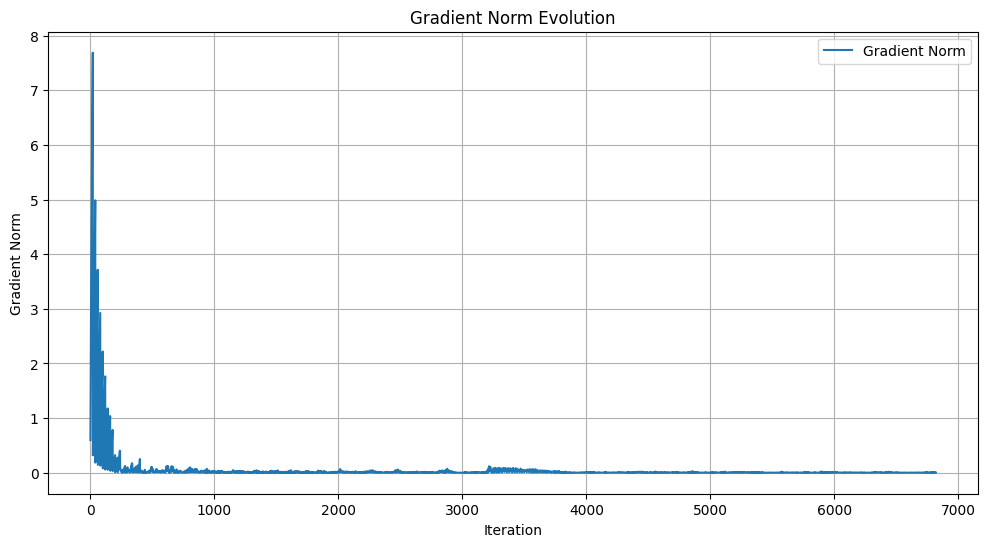


Iteration 360 | Total Loss 0.00034590330324135721
Updated Parameters:
M2: 17.964237213134766
M3: 11.93733024597168
D2: 9.612202644348145
D3: 10.03104305267334
V2: 2.44822359085083
V3: 2.013317584991455
Pmech2: -3.046030282974243
Pmech3: 0.47148770093917847


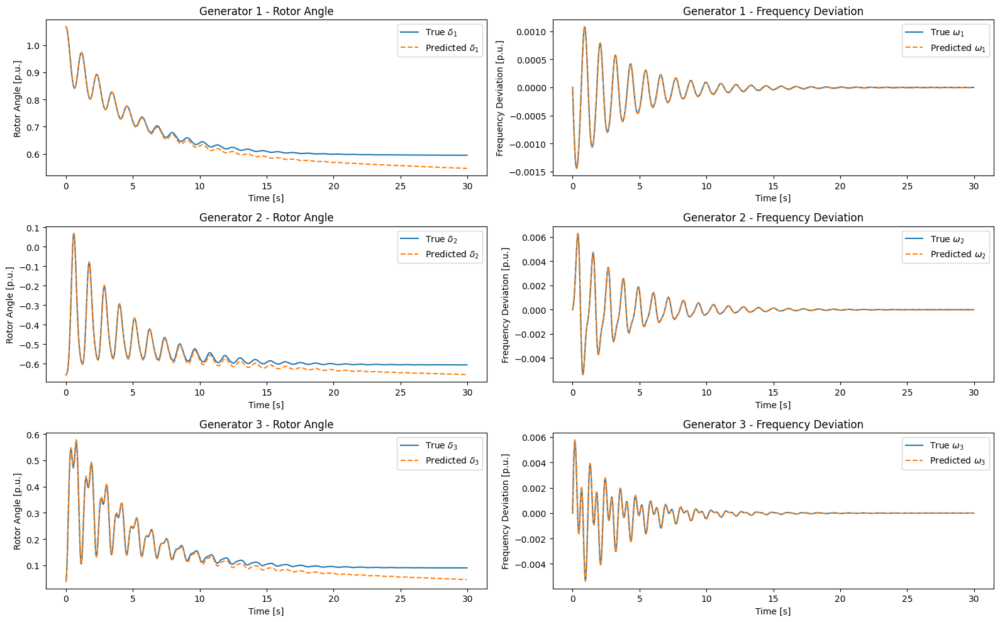

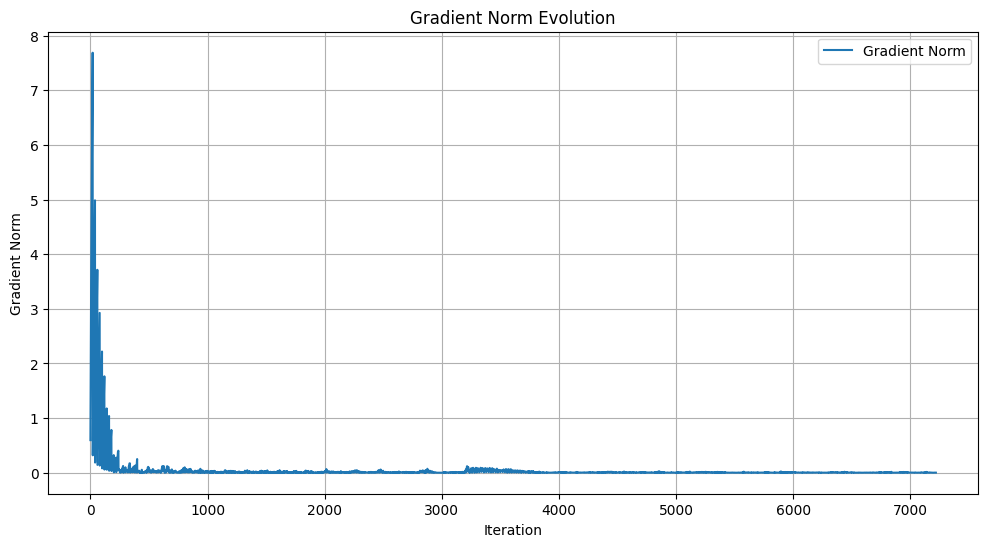


Iteration 380 | Total Loss 0.00341559178195893764
Updated Parameters:
M2: 17.958139419555664
M3: 11.917617797851562
D2: 9.662409782409668
D3: 9.97074031829834
V2: 2.446911334991455
V3: 2.017246723175049
Pmech2: -3.043537139892578
Pmech3: 0.4694082736968994


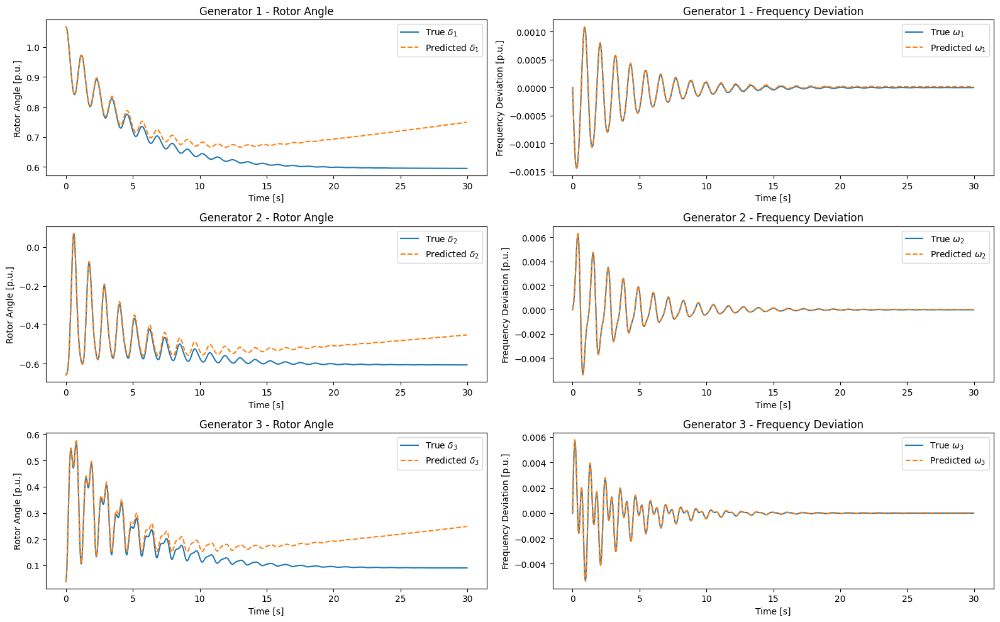

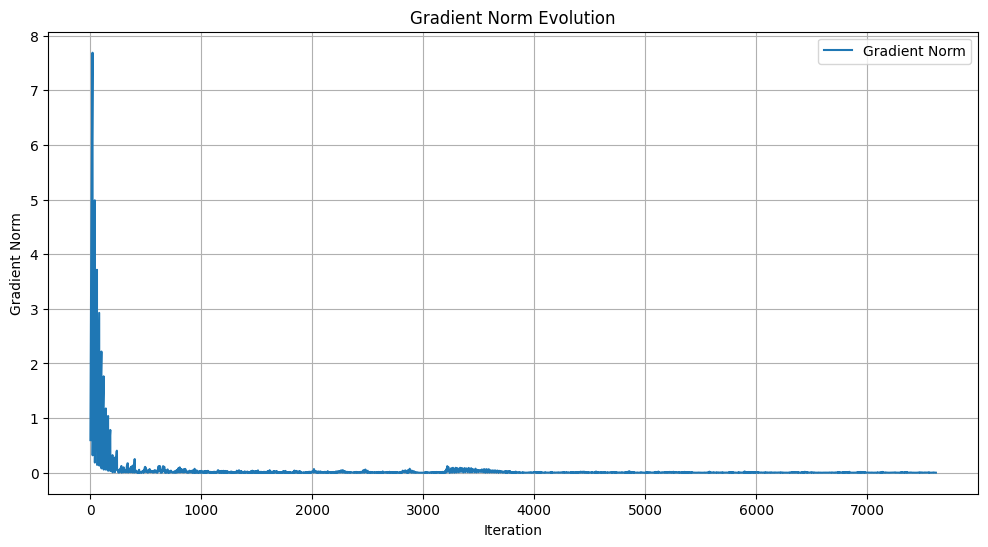


Iteration 400 | Total Loss 0.00842049159109592438
Updated Parameters:
M2: 17.98271369934082
M3: 11.961681365966797
D2: 9.688172340393066
D3: 9.930291175842285
V2: 2.4431076049804688
V3: 2.0194339752197266
Pmech2: -3.0410168170928955
Pmech3: 0.46712198853492737


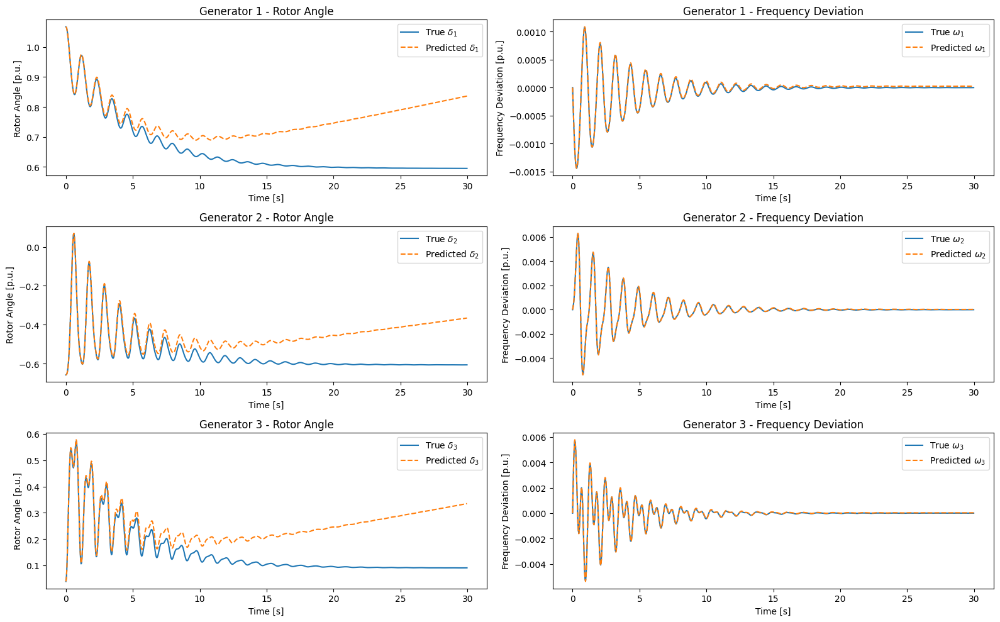

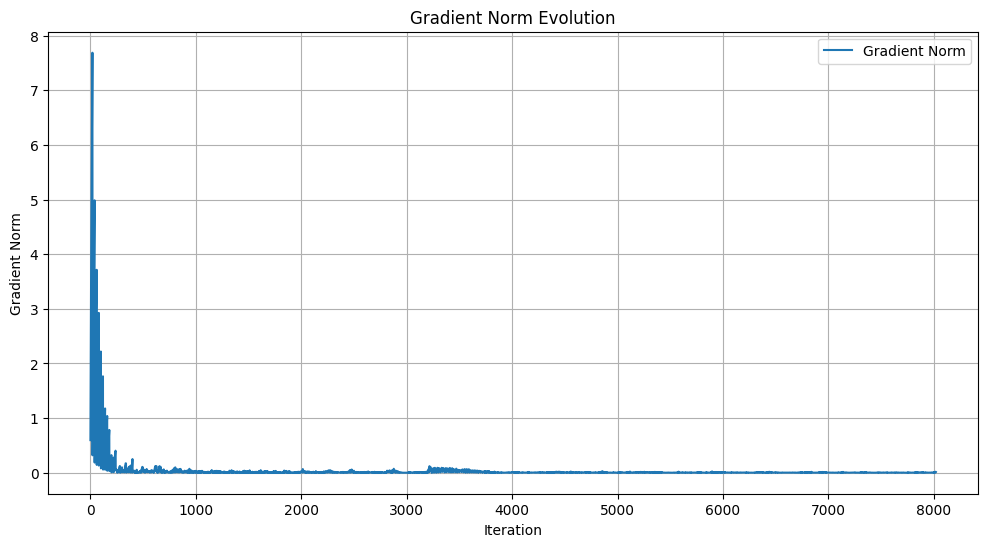


Iteration 420 | Total Loss 0.00137349090073257685
Updated Parameters:
M2: 17.959951400756836
M3: 11.944318771362305
D2: 9.728900909423828
D3: 9.937881469726562
V2: 2.4425477981567383
V3: 2.0215940475463867
Pmech2: -3.0403330326080322
Pmech3: 0.46588388085365295


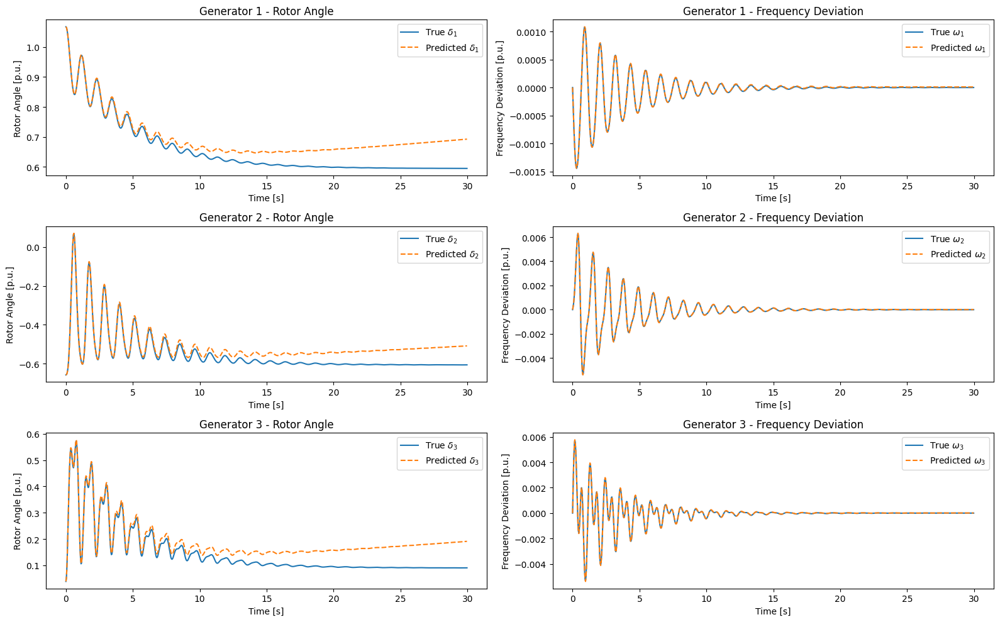

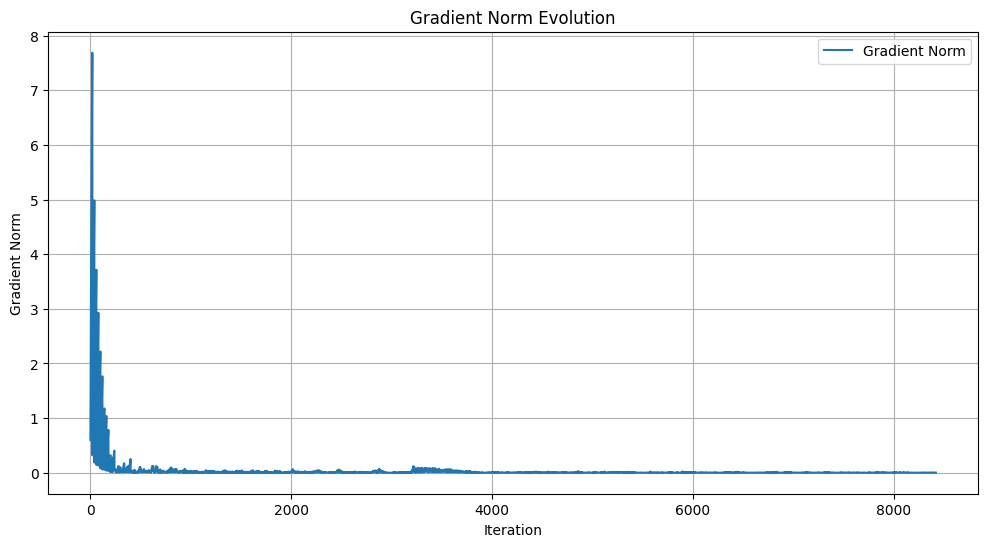


Iteration 440 | Total Loss 0.00200437312014400959
Updated Parameters:
M2: 17.957897186279297
M3: 11.948243141174316
D2: 9.727218627929688
D3: 9.907154083251953
V2: 2.4403316974639893
V3: 2.0220775604248047
Pmech2: -3.0385947227478027
Pmech3: 0.46423035860061646


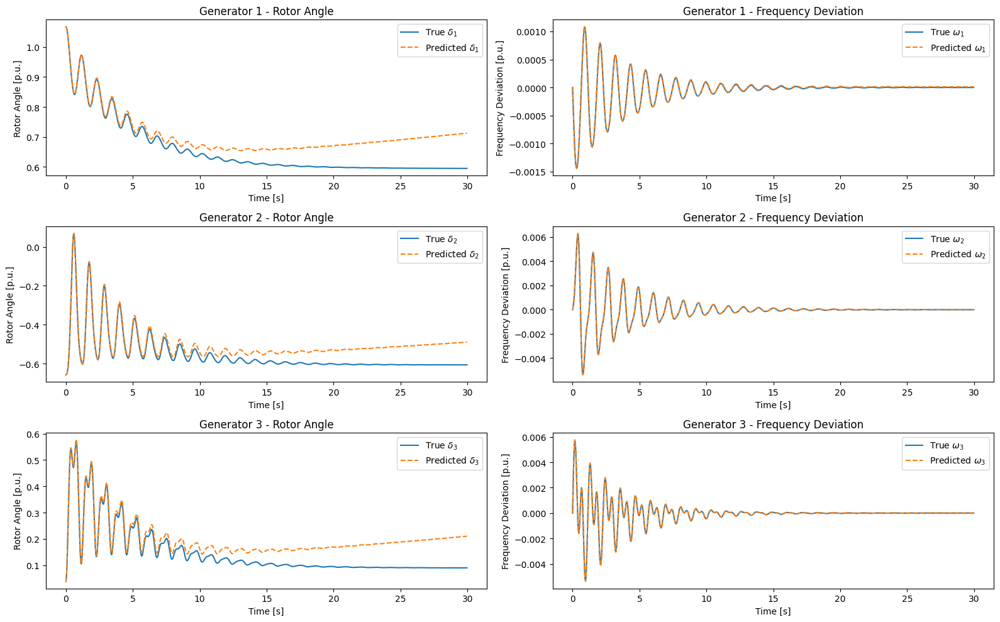

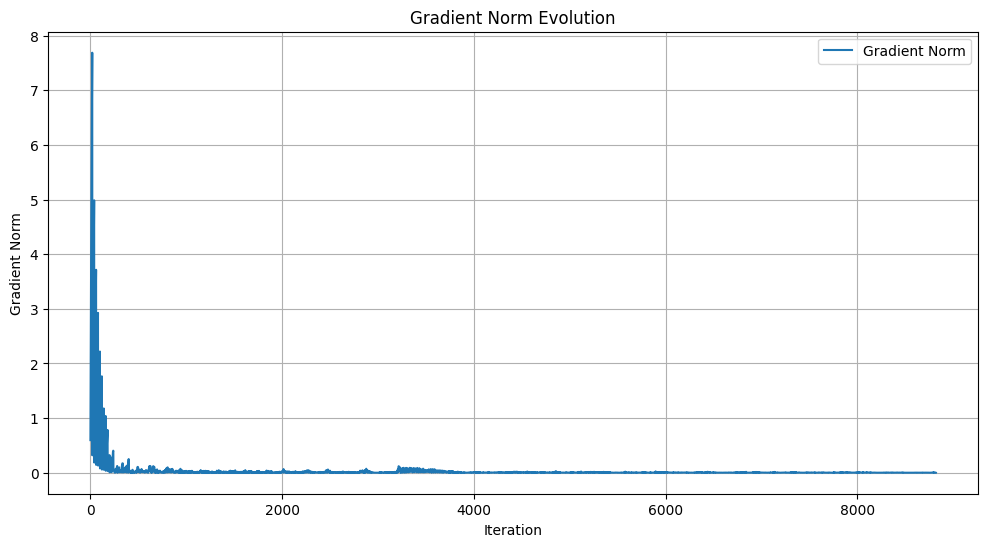


Iteration 460 | Total Loss 0.00986653286963701248
Updated Parameters:
M2: 17.976787567138672
M3: 11.958261489868164
D2: 9.770214080810547
D3: 9.88890552520752
V2: 2.437941551208496
V3: 2.0237503051757812
Pmech2: -3.038055658340454
Pmech3: 0.4624974727630615


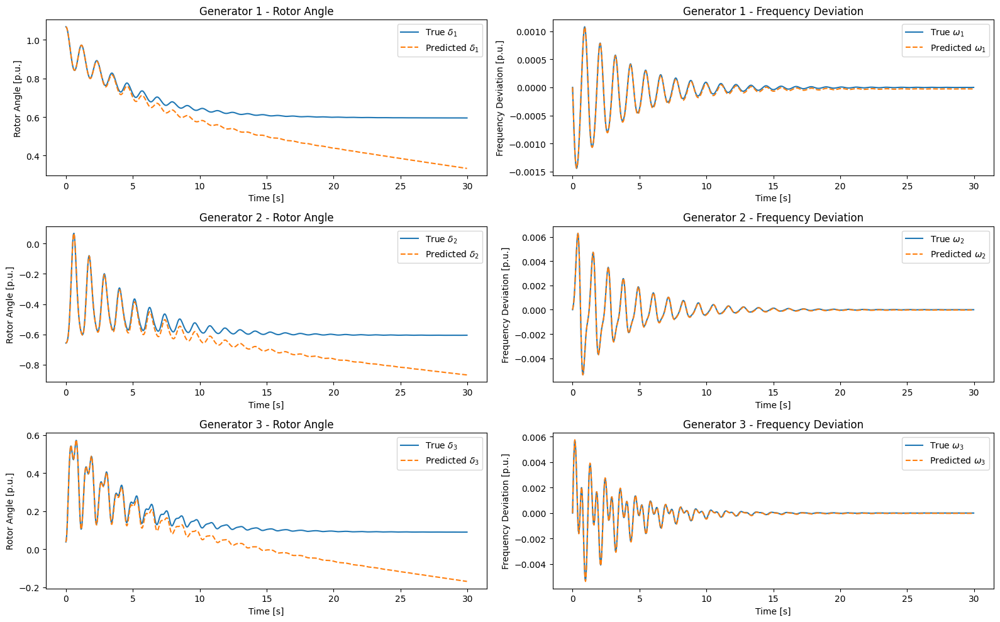

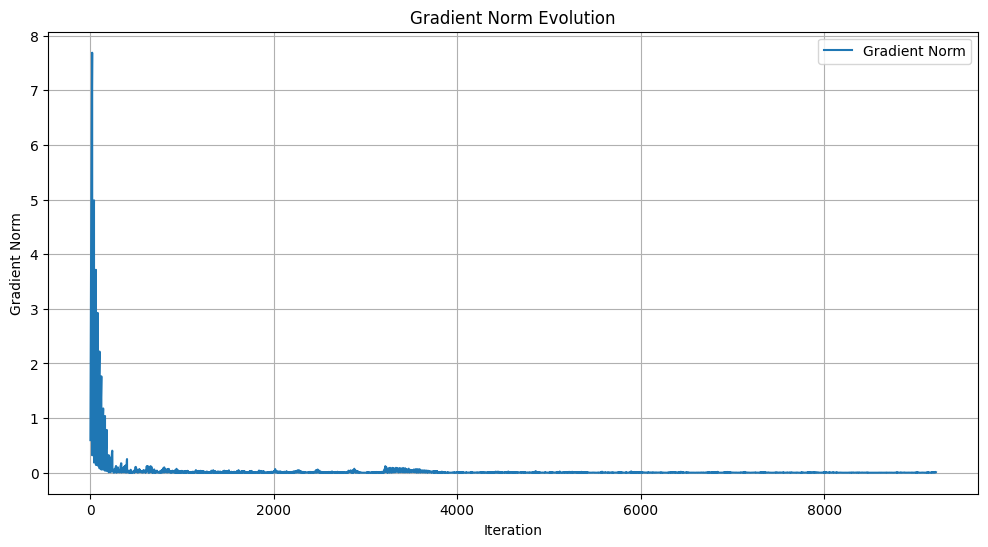


Iteration 480 | Total Loss 0.00461278716102242470
Updated Parameters:
M2: 17.971717834472656
M3: 11.981682777404785
D2: 9.818286895751953
D3: 9.913408279418945
V2: 2.439728021621704
V3: 2.026209831237793
Pmech2: -3.0376367568969727
Pmech3: 0.4621366560459137


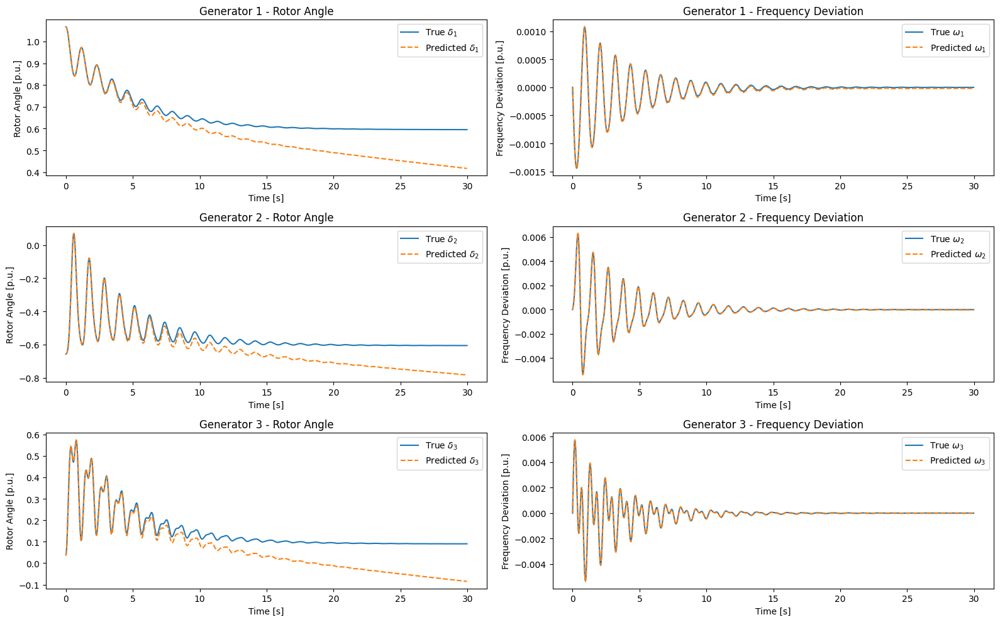

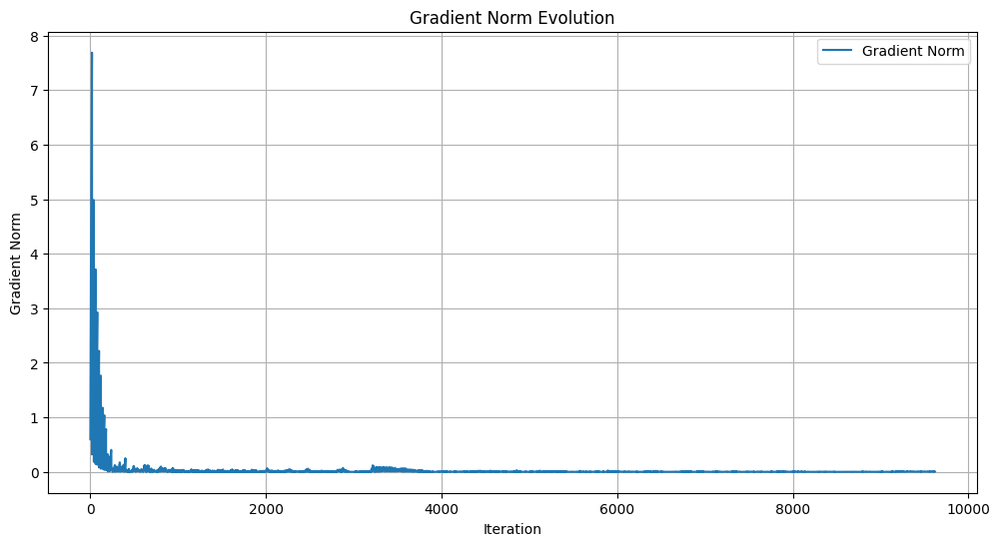


Iteration 500 | Total Loss 0.00029886362608522177
Updated Parameters:
M2: 17.971811294555664
M3: 11.983907699584961
D2: 9.810606956481934
D3: 9.899068832397461
V2: 2.437161684036255
V3: 2.026629686355591
Pmech2: -3.0370771884918213
Pmech3: 0.46203163266181946


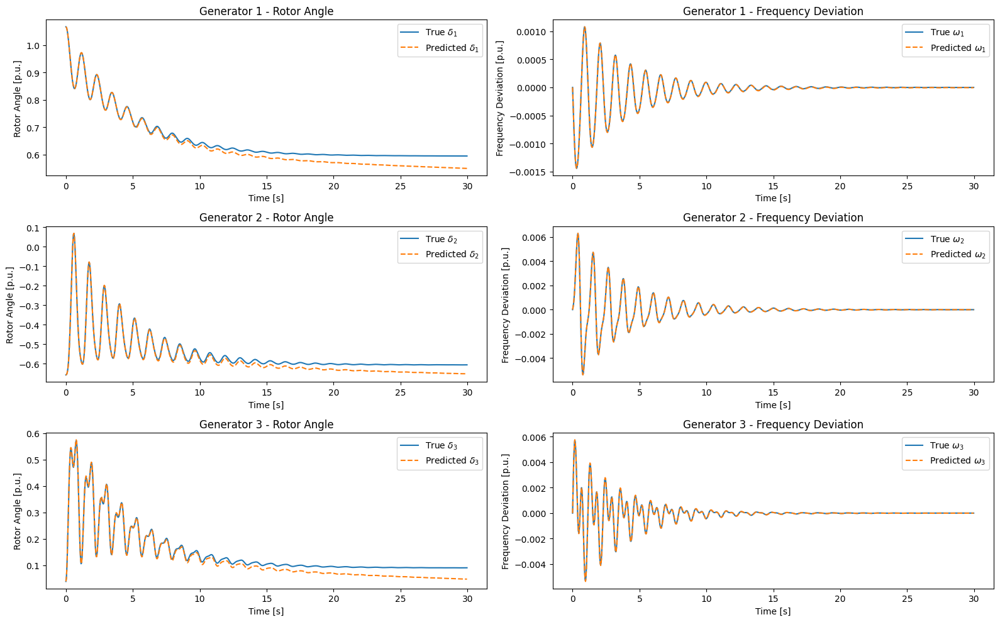

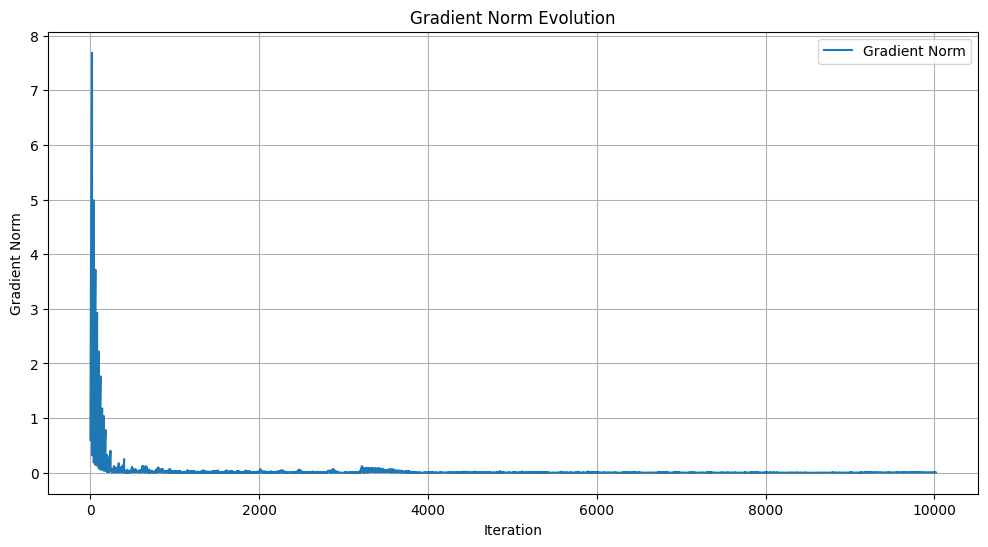


Iteration 520 | Total Loss 0.00016346602933481336
Updated Parameters:
M2: 17.96886444091797
M3: 11.975517272949219
D2: 9.813541412353516
D3: 9.87341022491455
V2: 2.4376418590545654
V3: 2.0294172763824463
Pmech2: -3.036846876144409
Pmech3: 0.46166345477104187


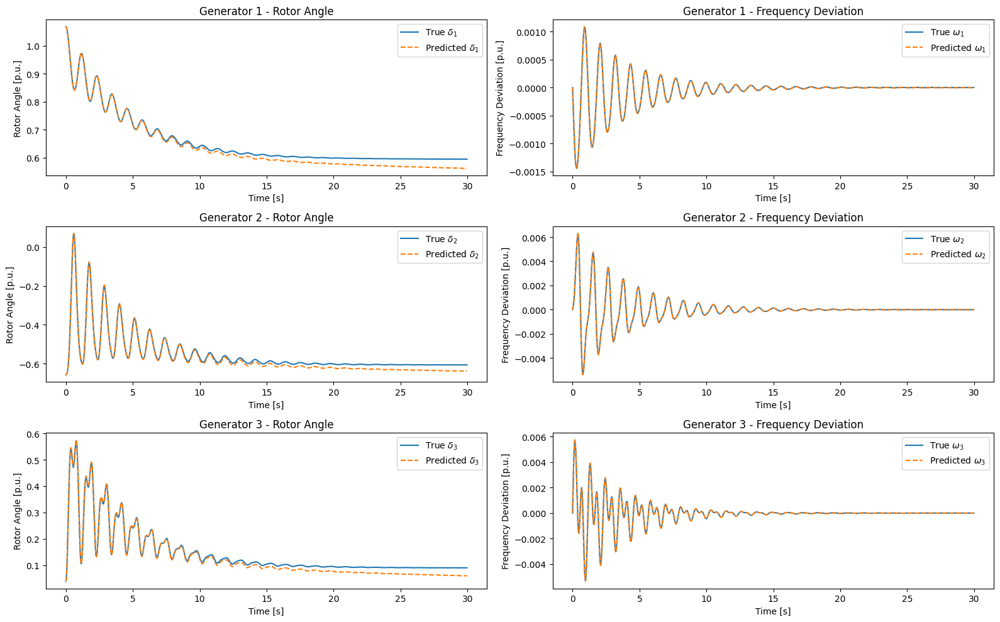

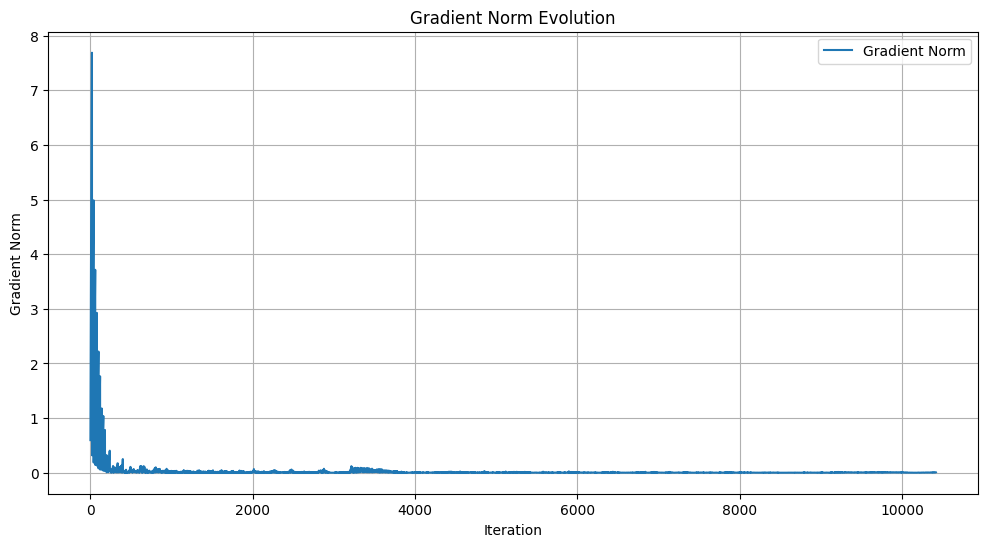


Iteration 540 | Total Loss 0.00005399089786806144
Updated Parameters:
M2: 17.970619201660156
M3: 11.957313537597656
D2: 9.82850170135498
D3: 9.886990547180176
V2: 2.436307668685913
V3: 2.0293288230895996
Pmech2: -3.036381483078003
Pmech3: 0.461398720741272


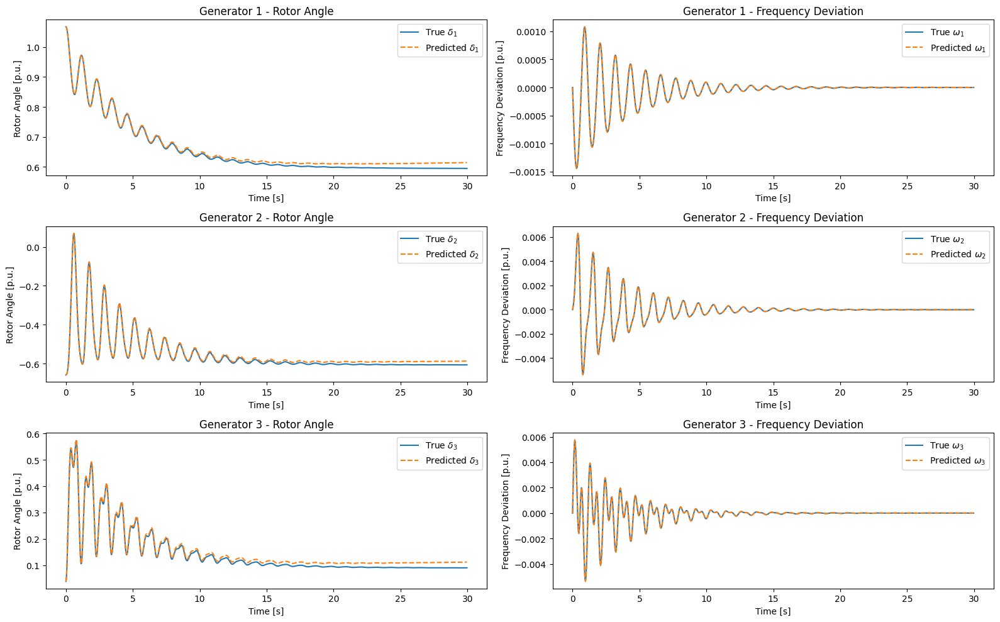

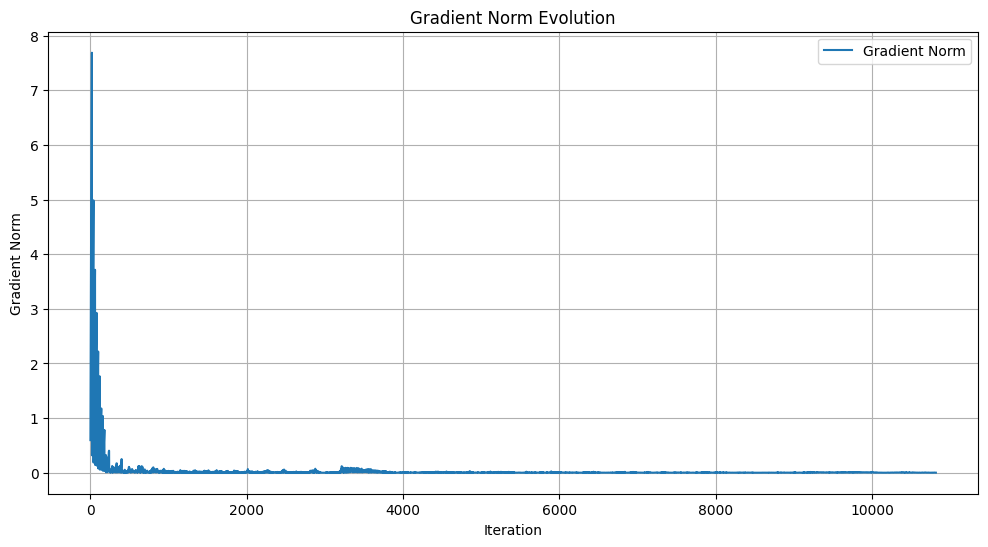


Iteration 560 | Total Loss 0.00039888985338620842
Updated Parameters:
M2: 17.970455169677734
M3: 11.976572036743164
D2: 9.842002868652344
D3: 9.894233703613281
V2: 2.433408260345459
V3: 2.029005527496338
Pmech2: -3.0359225273132324
Pmech3: 0.4608175754547119


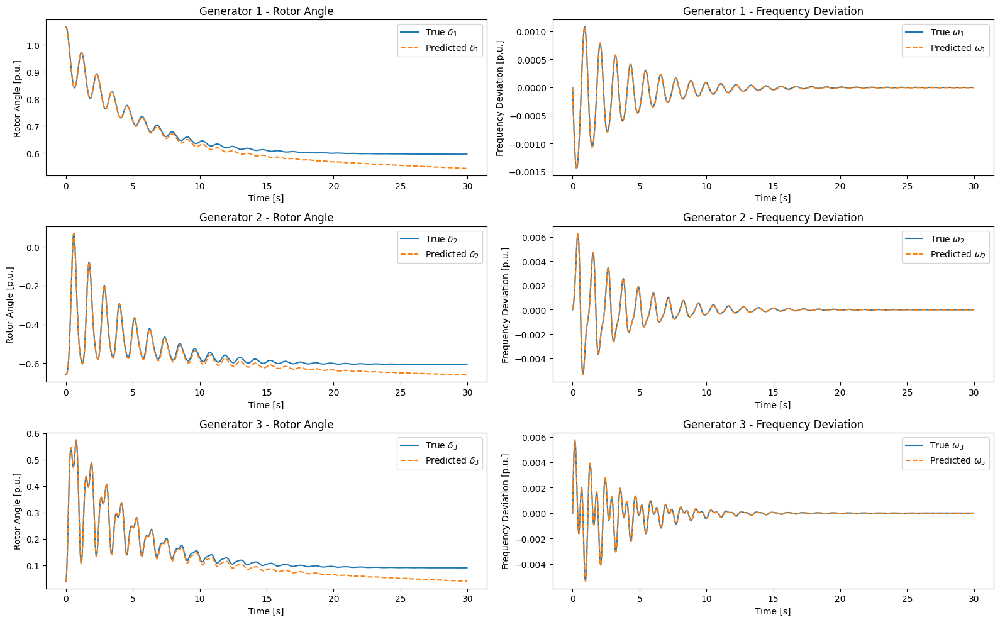

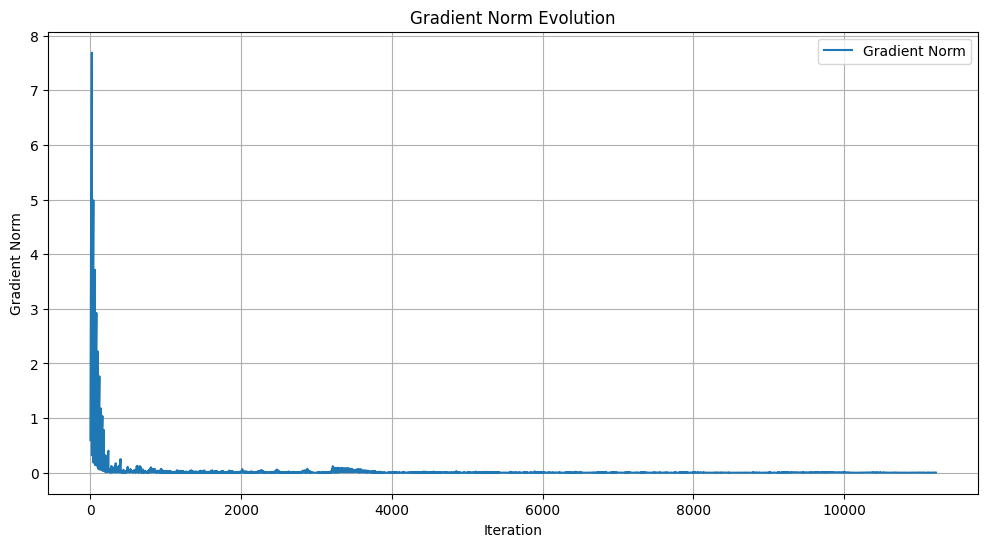


Iteration 580 | Total Loss 0.00042164701153524220
Updated Parameters:
M2: 17.97856903076172
M3: 11.967864036560059
D2: 9.863028526306152
D3: 9.89140510559082
V2: 2.433915615081787
V3: 2.030121326446533
Pmech2: -3.0354628562927246
Pmech3: 0.46027109026908875


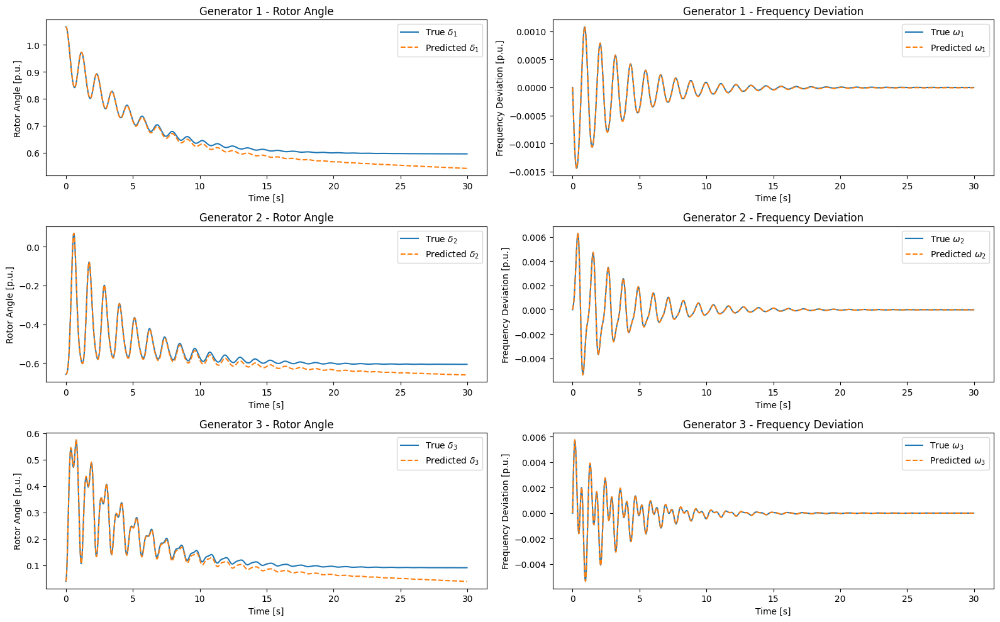

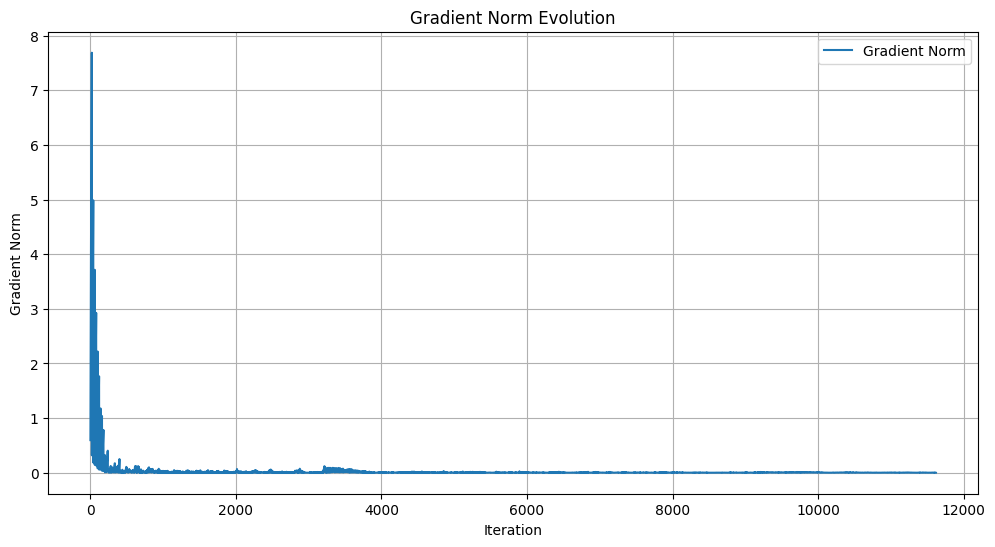


Iteration 600 | Total Loss 0.00094264996005222201
Updated Parameters:
M2: 17.971324920654297
M3: 11.971929550170898
D2: 9.860696792602539
D3: 9.87716293334961
V2: 2.433043956756592
V3: 2.0303499698638916
Pmech2: -3.034653425216675
Pmech3: 0.4598815441131592


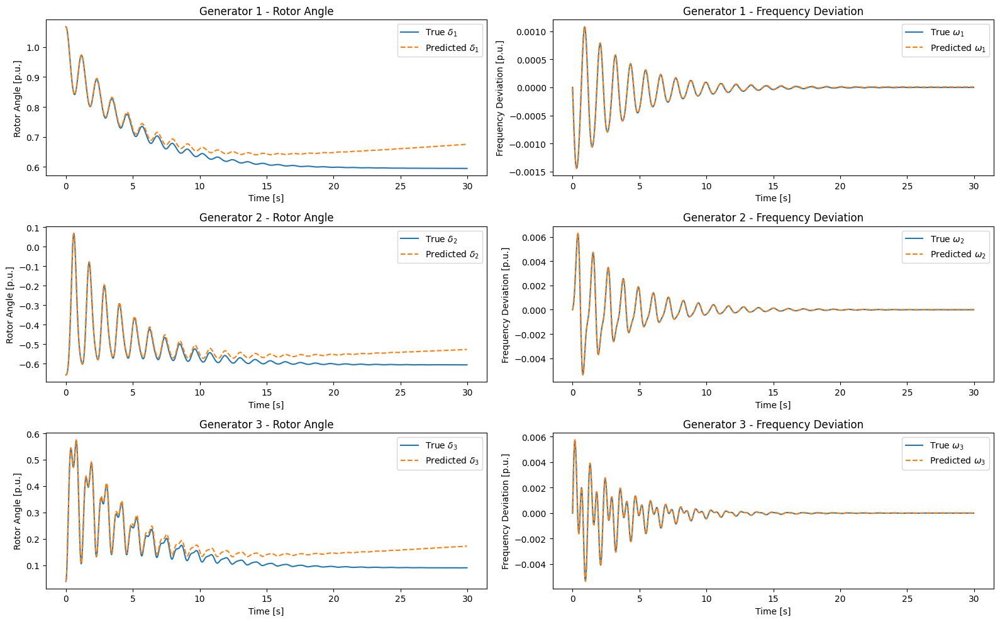

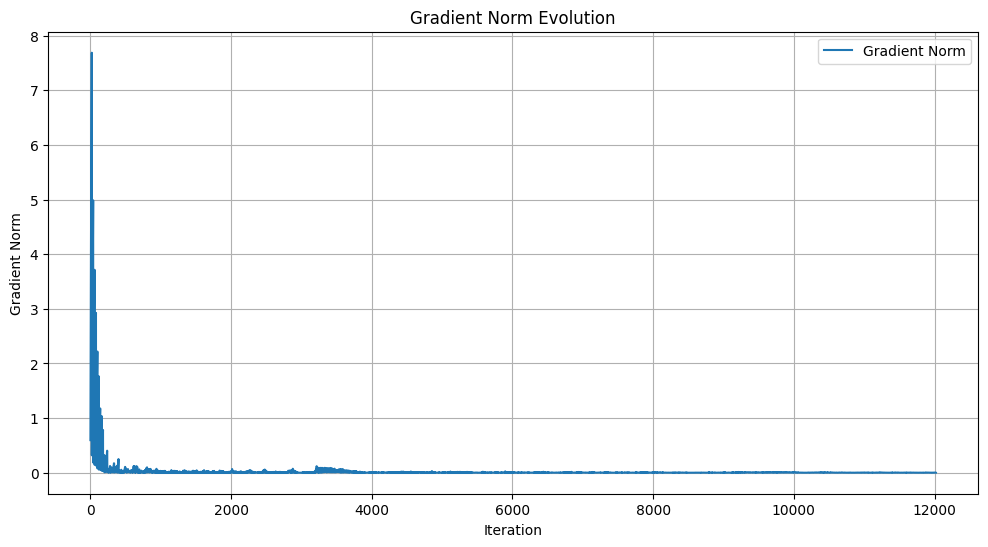


Iteration 620 | Total Loss 0.00010533203749218956
Updated Parameters:
M2: 17.97934341430664
M3: 11.969700813293457
D2: 9.865913391113281
D3: 9.876394271850586
V2: 2.4337968826293945
V3: 2.030081272125244
Pmech2: -3.034364938735962
Pmech3: 0.45941948890686035


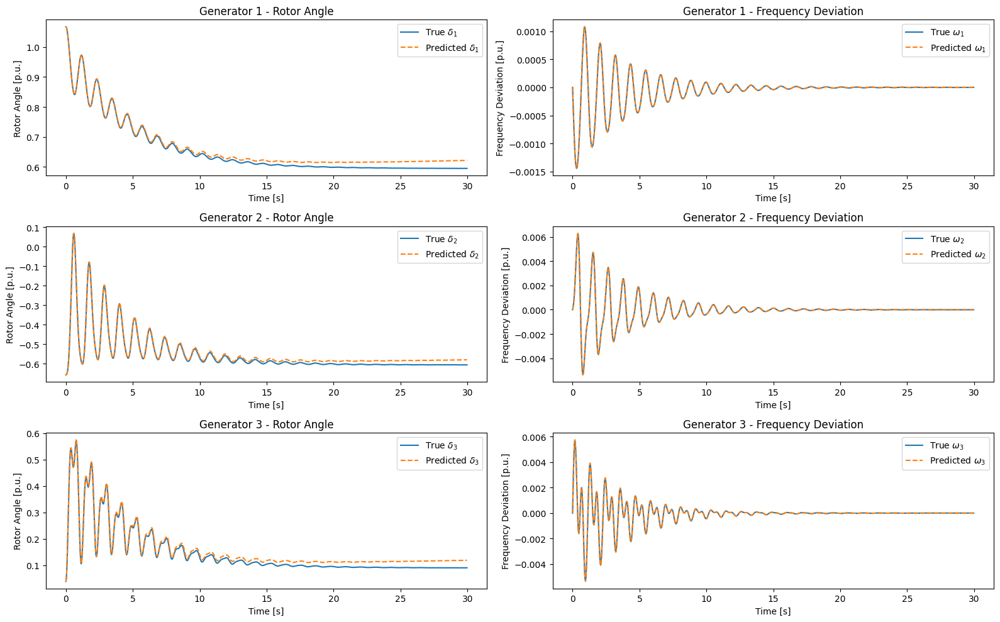

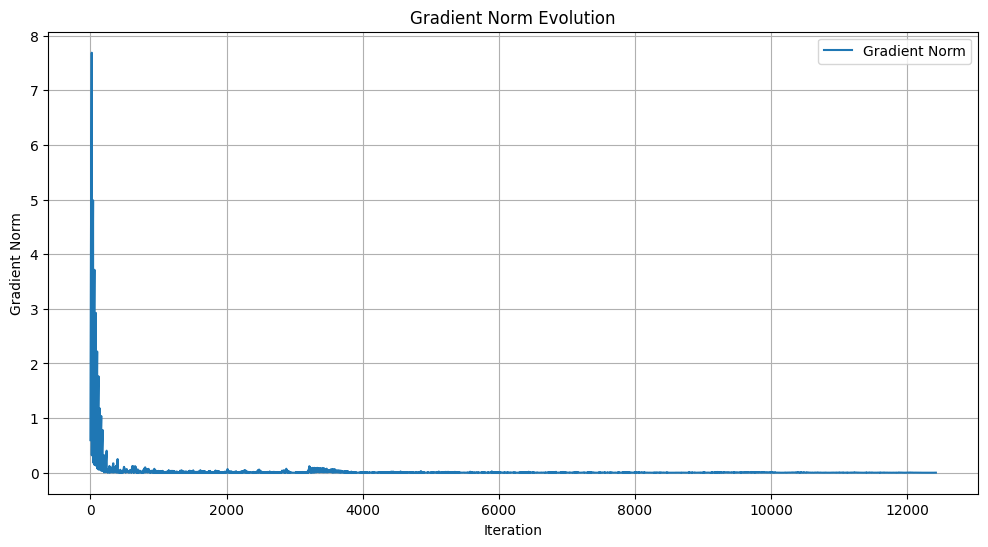


Iteration 640 | Total Loss 0.00018609951075632125
Updated Parameters:
M2: 17.977283477783203
M3: 11.968714714050293
D2: 9.873714447021484
D3: 9.866279602050781
V2: 2.4329280853271484
V3: 2.030782461166382
Pmech2: -3.0340309143066406
Pmech3: 0.4590950012207031


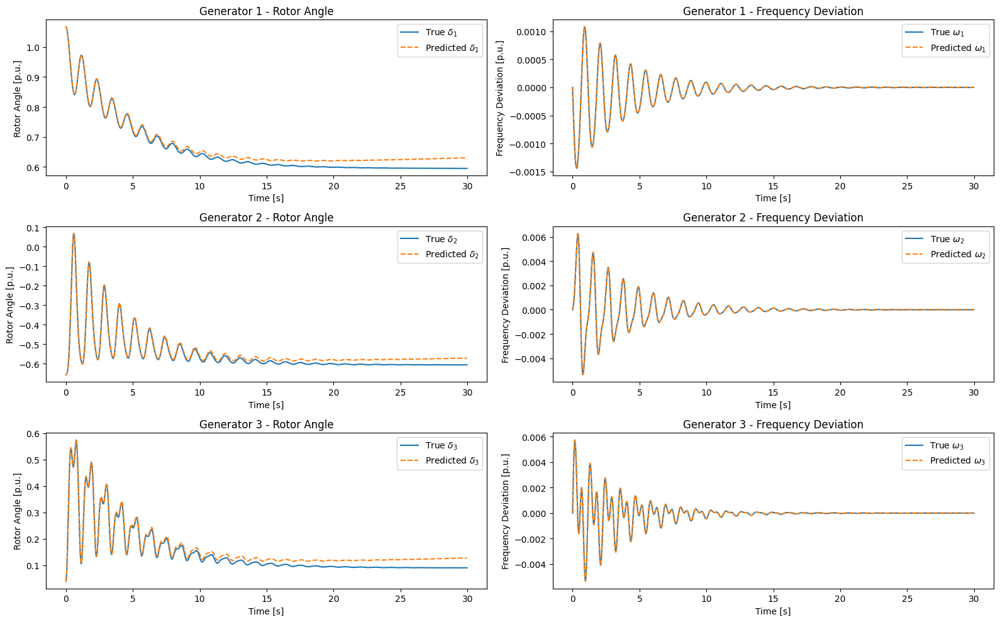

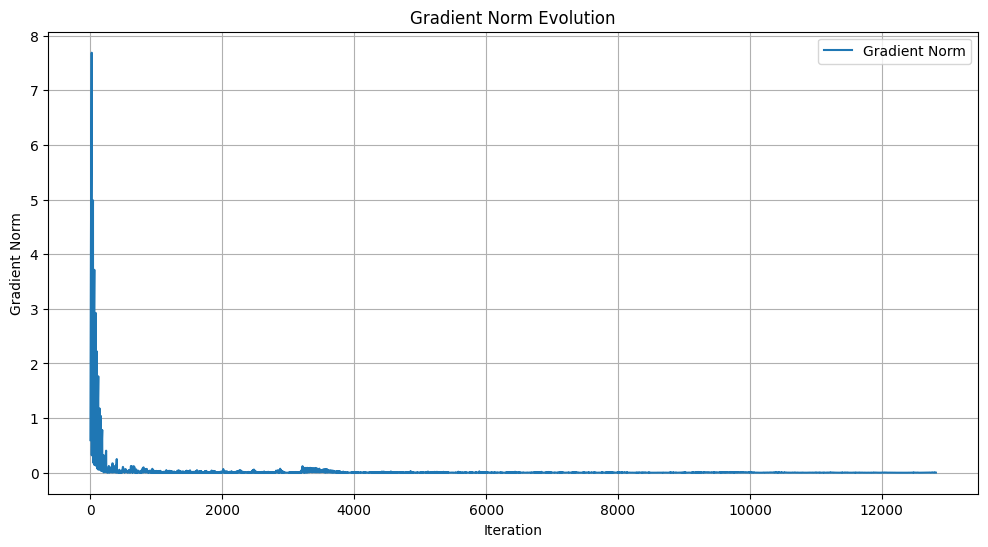


Iteration 660 | Total Loss 0.00109623488970100880
Updated Parameters:
M2: 17.9785099029541
M3: 11.969078063964844
D2: 9.877019882202148
D3: 9.85990047454834
V2: 2.432859420776367
V3: 2.031048059463501
Pmech2: -3.03373122215271
Pmech3: 0.4589376151561737


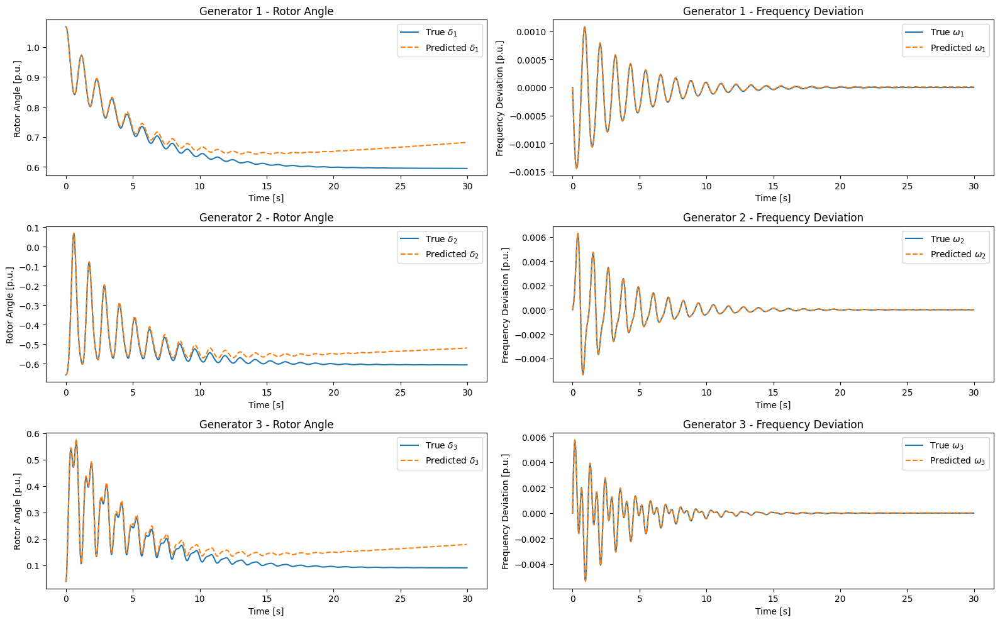

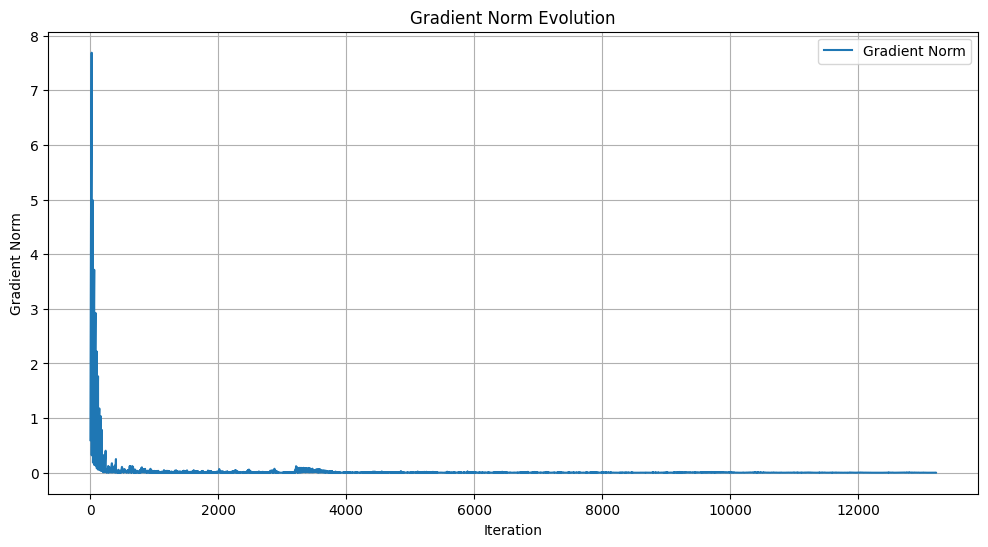


Iteration 680 | Total Loss 0.00000185979195066466
Updated Parameters:
M2: 17.974977493286133
M3: 11.9717435836792
D2: 9.88429069519043
D3: 9.856328010559082
V2: 2.433210849761963
V3: 2.0317206382751465
Pmech2: -3.033628225326538
Pmech3: 0.45850837230682373


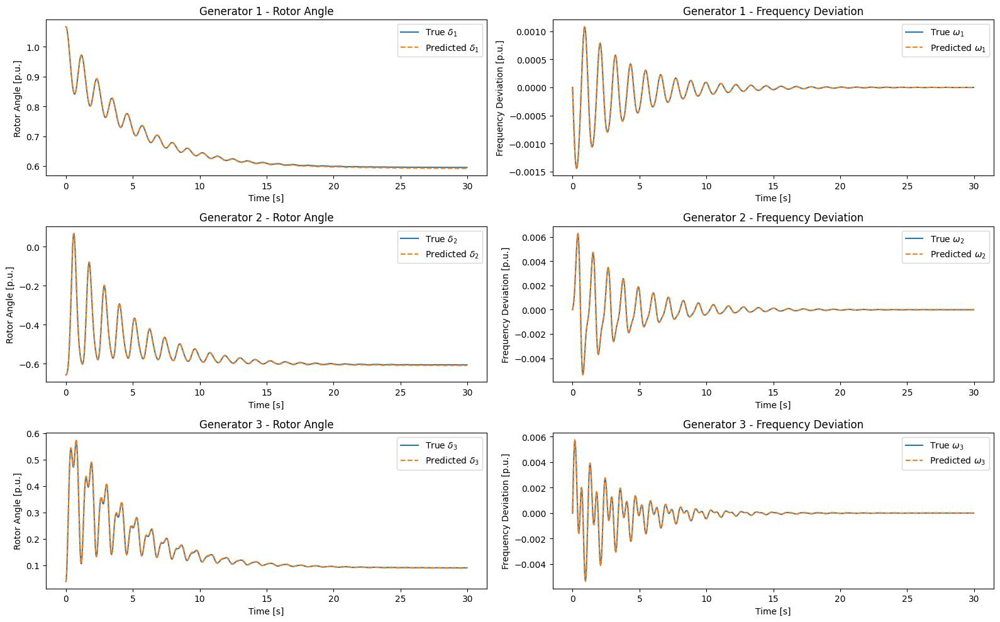

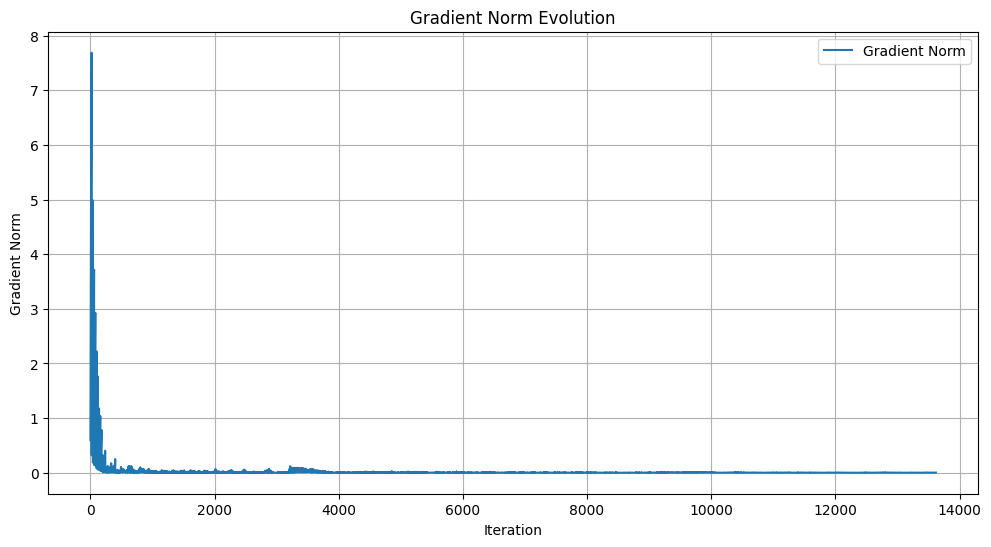


Iteration 700 | Total Loss 0.00006128176028141752
Updated Parameters:
M2: 17.97809410095215
M3: 11.975128173828125
D2: 9.893192291259766
D3: 9.859783172607422
V2: 2.4322800636291504
V3: 2.031097650527954
Pmech2: -3.033430337905884
Pmech3: 0.4583180844783783


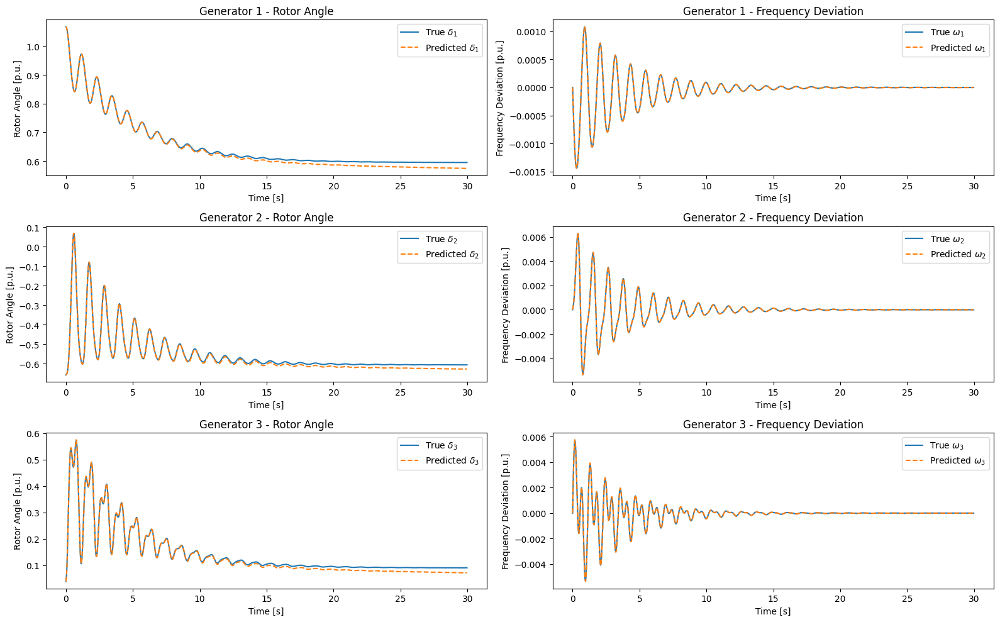

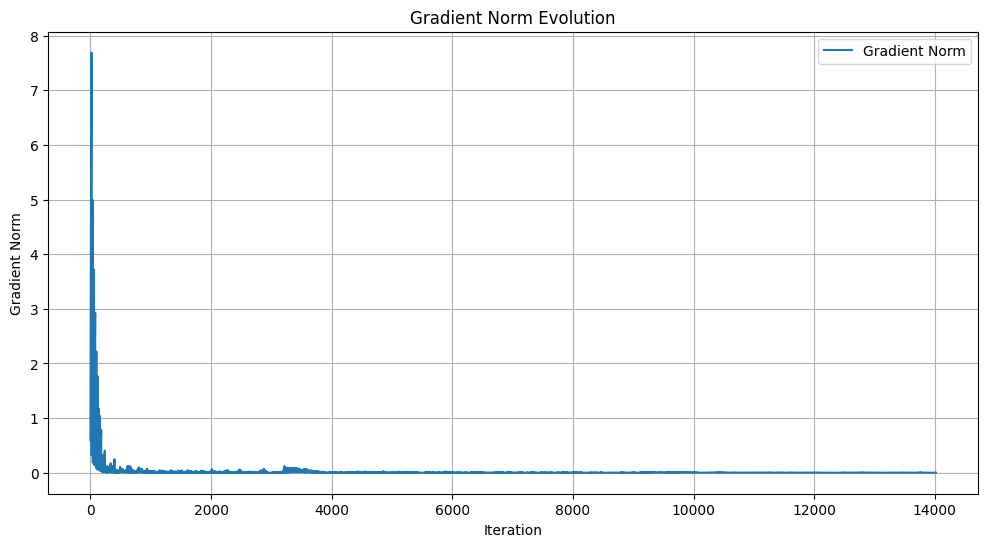


Iteration 720 | Total Loss 0.00000543988653589622
Updated Parameters:
M2: 17.97804832458496
M3: 11.973353385925293
D2: 9.89238166809082
D3: 9.857755661010742
V2: 2.4322445392608643
V3: 2.031935453414917
Pmech2: -3.0332443714141846
Pmech3: 0.4581637680530548


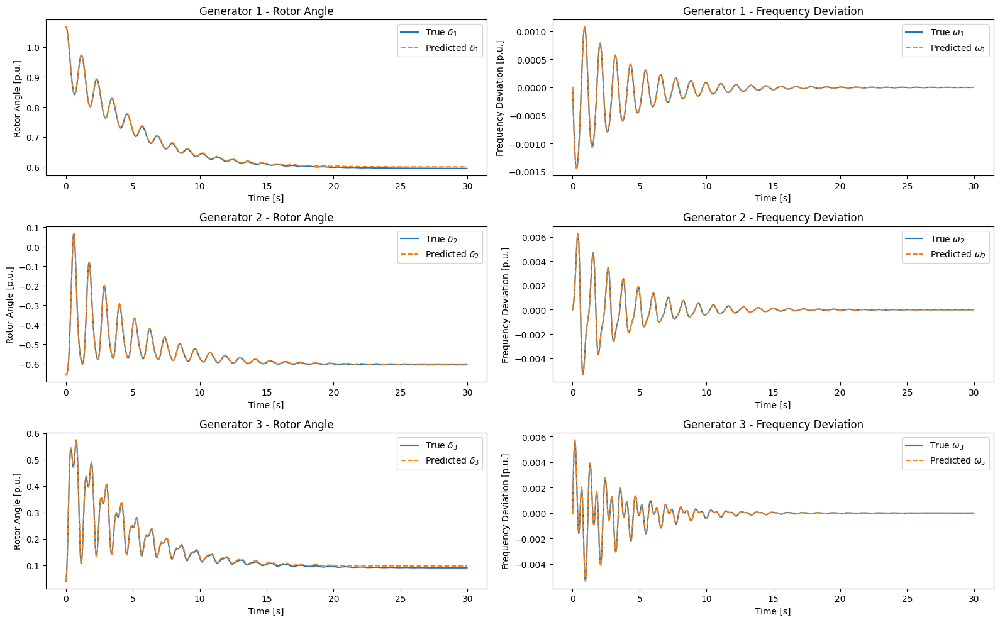

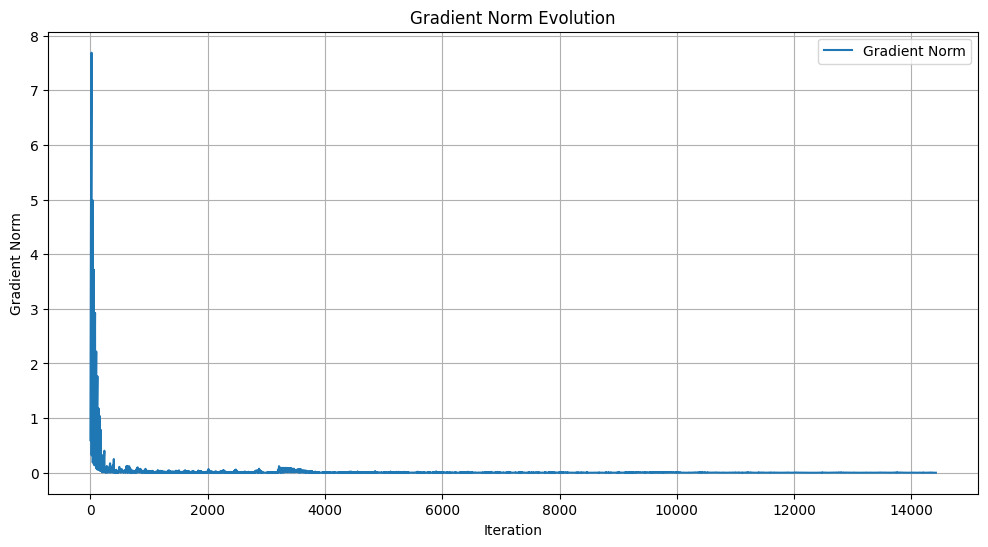


Iteration 740 | Total Loss 0.00000163562003763218
Updated Parameters:
M2: 17.977378845214844
M3: 11.972060203552246
D2: 9.892936706542969
D3: 9.855480194091797
V2: 2.4318788051605225
V3: 2.032176971435547
Pmech2: -3.0330495834350586
Pmech3: 0.457953542470932


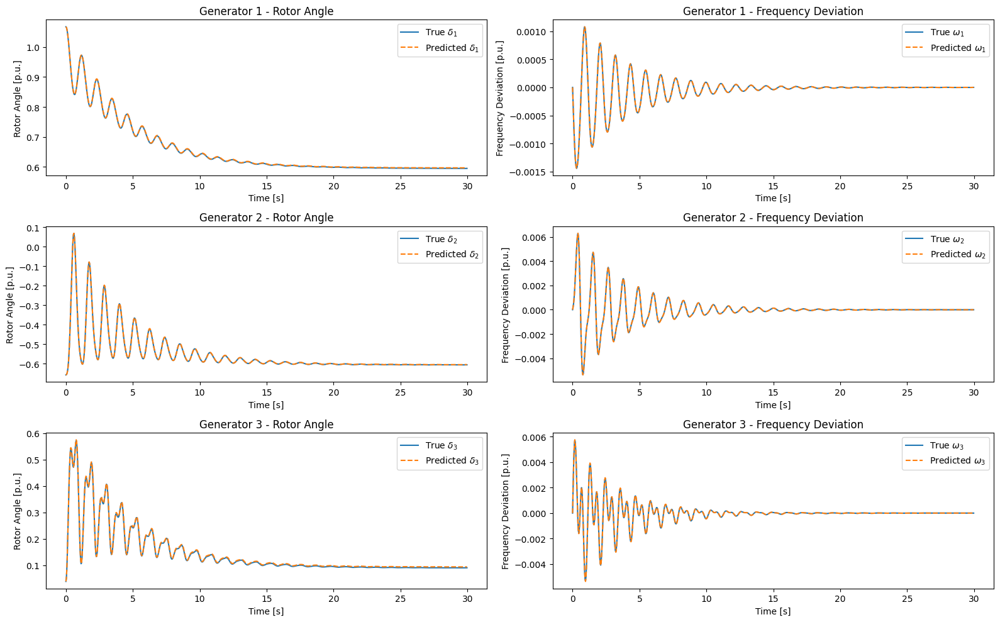

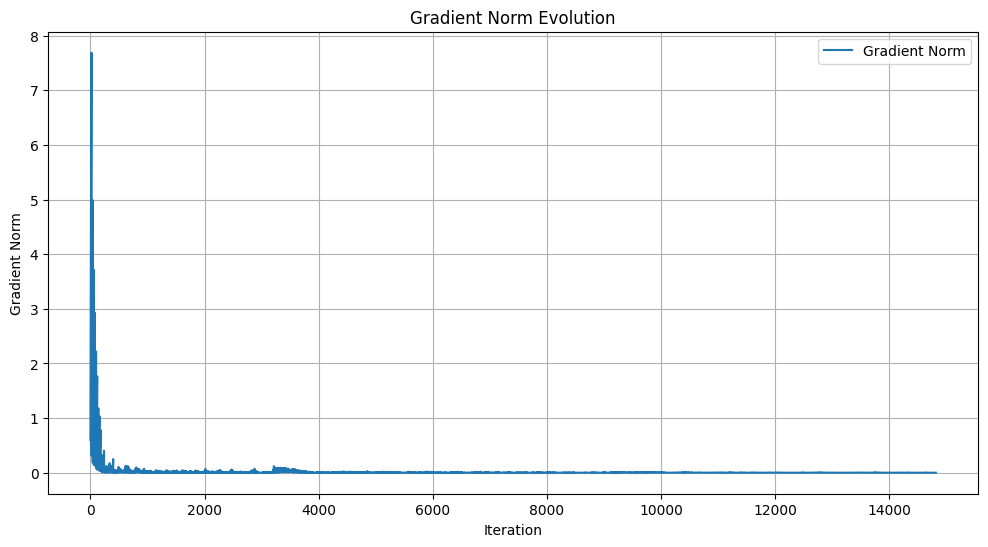


Iteration 760 | Total Loss 0.00025192965404130518
Updated Parameters:
M2: 17.98038673400879
M3: 11.974928855895996
D2: 9.892417907714844
D3: 9.850618362426758
V2: 2.431370496749878
V3: 2.032562494277954
Pmech2: -3.032813310623169
Pmech3: 0.45782962441444397


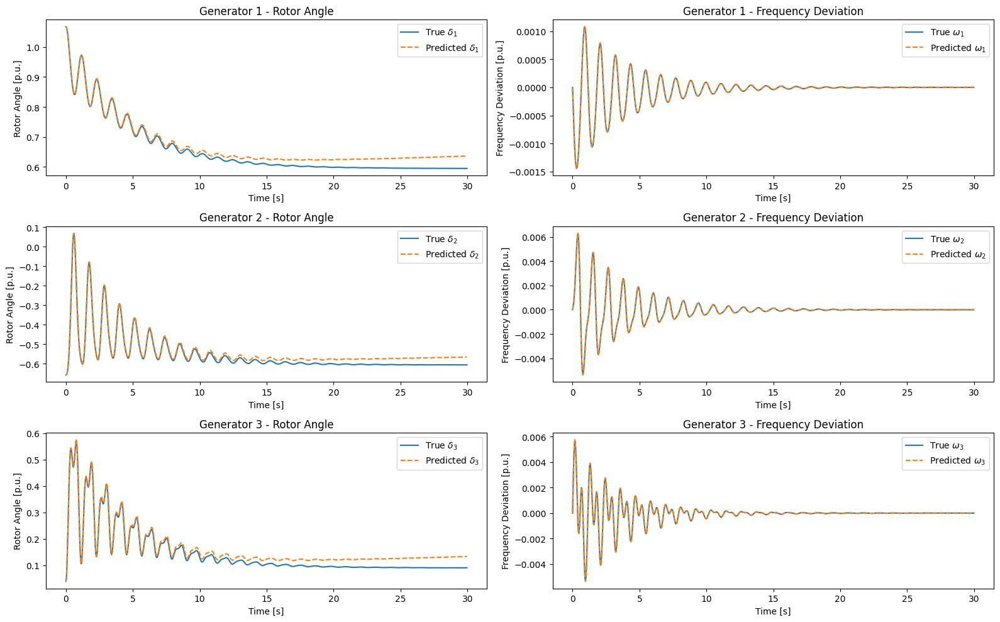

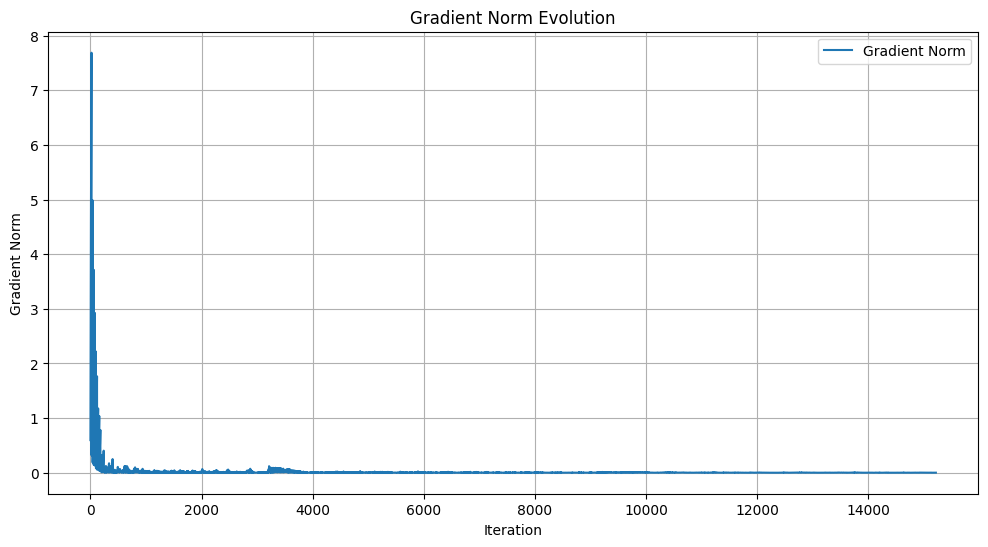


Iteration 780 | Total Loss 0.00000420959895564010
Updated Parameters:
M2: 17.979310989379883
M3: 11.971797943115234
D2: 9.896798133850098
D3: 9.847272872924805
V2: 2.4313836097717285
V3: 2.0333218574523926
Pmech2: -3.032724380493164
Pmech3: 0.4575835168361664


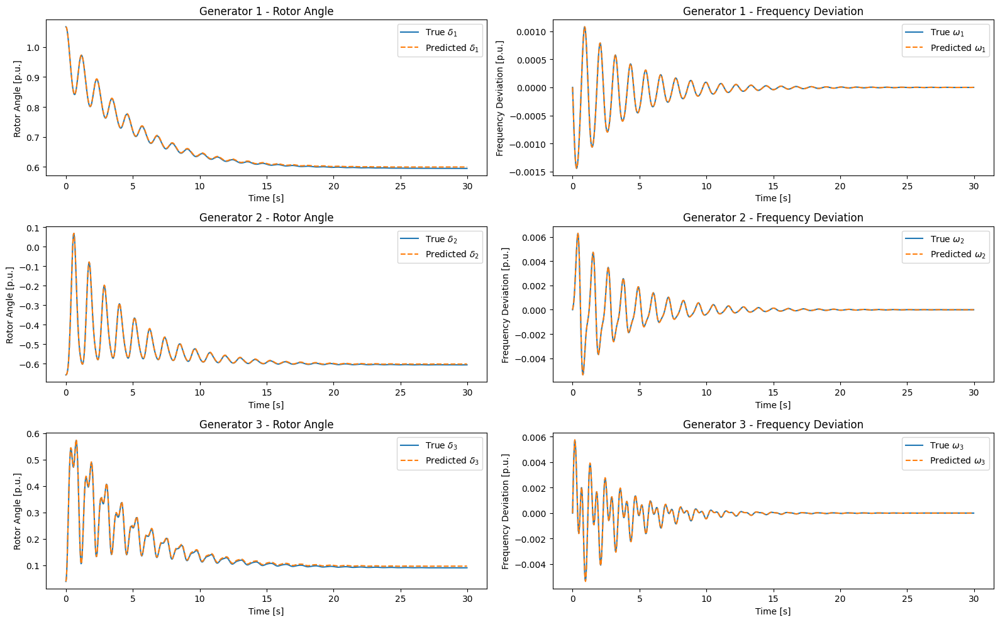

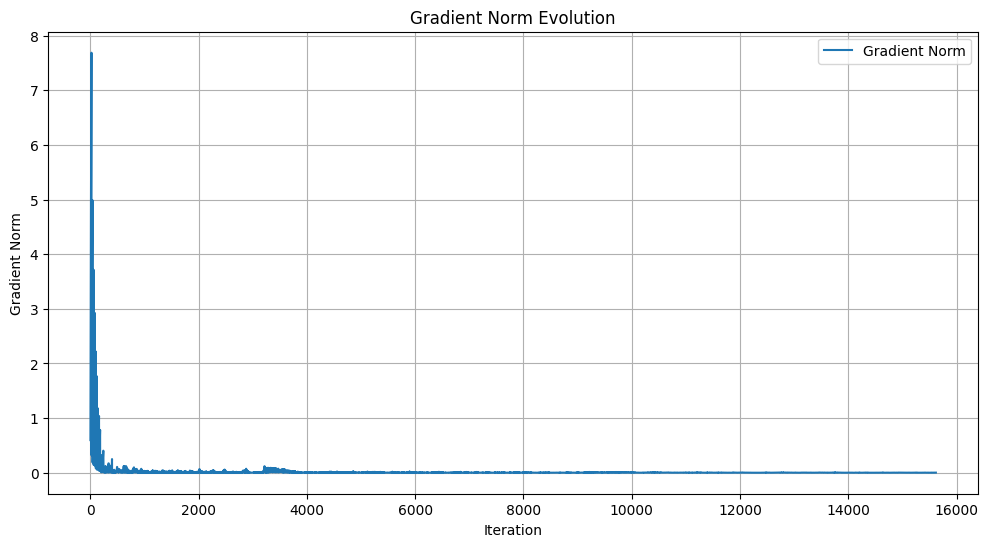


Iteration 800 | Total Loss 0.00000367356983588252
Updated Parameters:
M2: 17.98123550415039
M3: 11.9763822555542
D2: 9.899637222290039
D3: 9.842878341674805
V2: 2.4306604862213135
V3: 2.033597230911255
Pmech2: -3.0325820446014404
Pmech3: 0.4574170708656311


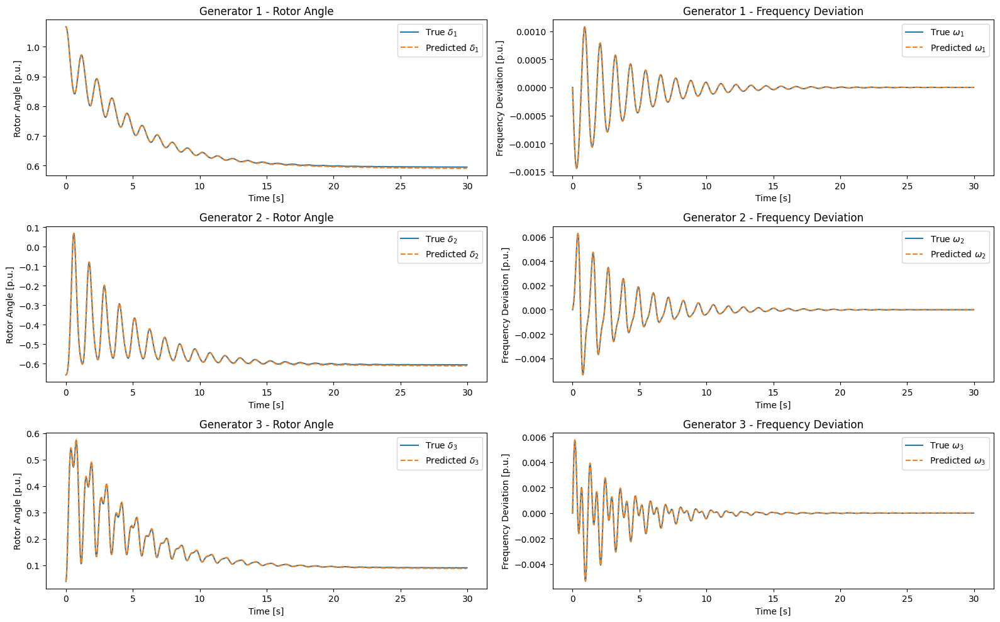

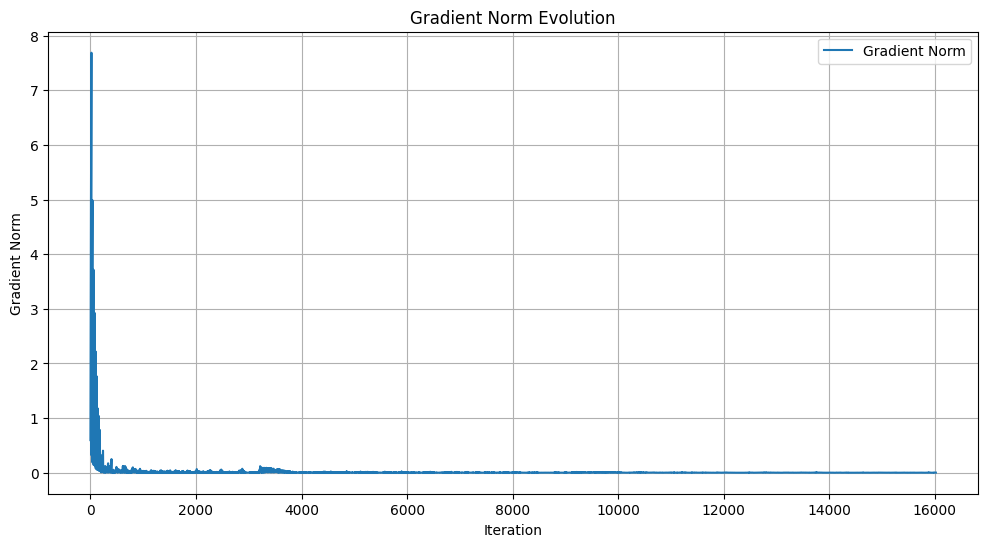


Iteration 820 | Total Loss 0.00000256275484389334
Updated Parameters:
M2: 17.980052947998047
M3: 11.97588062286377
D2: 9.902708053588867
D3: 9.842927932739258
V2: 2.4304800033569336
V3: 2.033670663833618
Pmech2: -3.0324857234954834
Pmech3: 0.4573431611061096


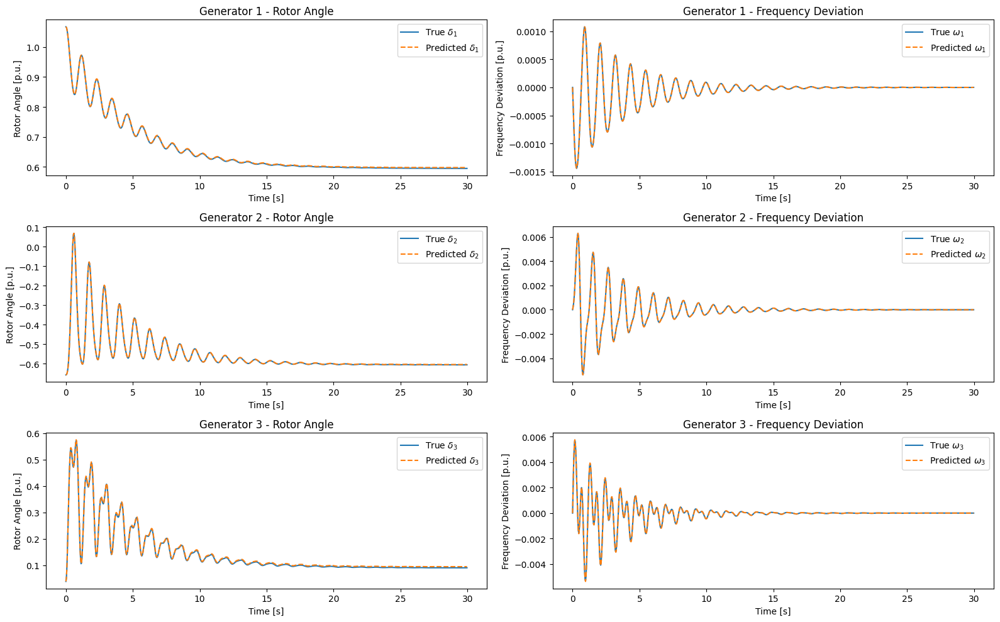

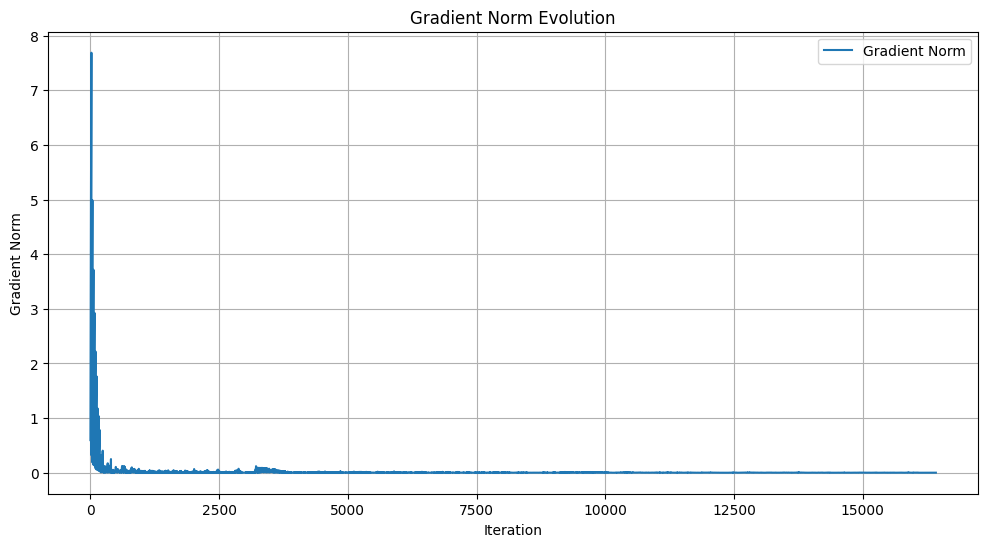


Iteration 840 | Total Loss 0.00000219473895413103
Updated Parameters:
M2: 17.97934913635254
M3: 11.977328300476074
D2: 9.904837608337402
D3: 9.84359359741211
V2: 2.4306061267852783
V3: 2.0337860584259033
Pmech2: -3.0324065685272217
Pmech3: 0.45723479986190796


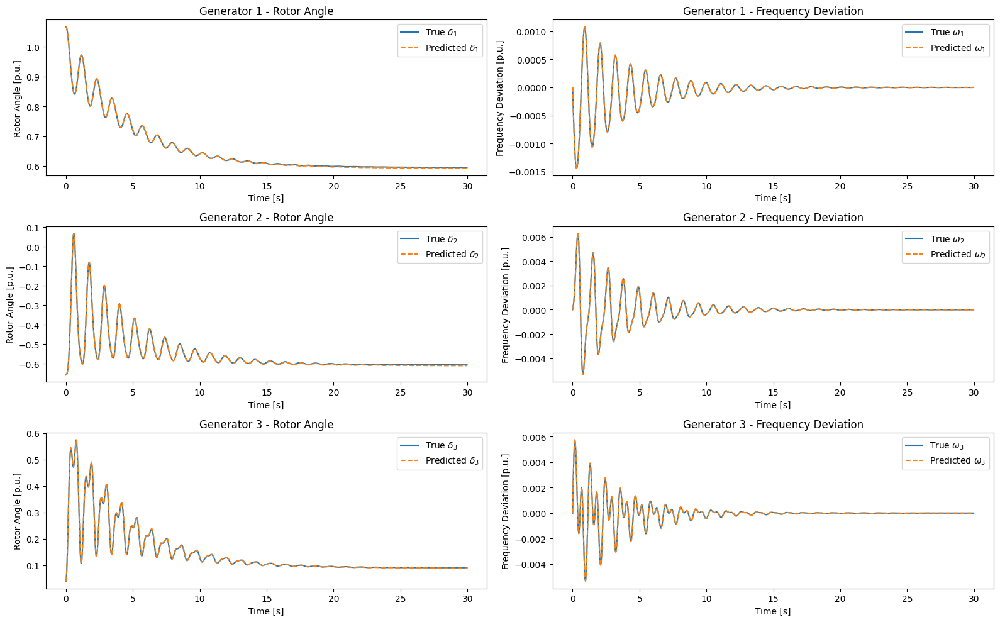

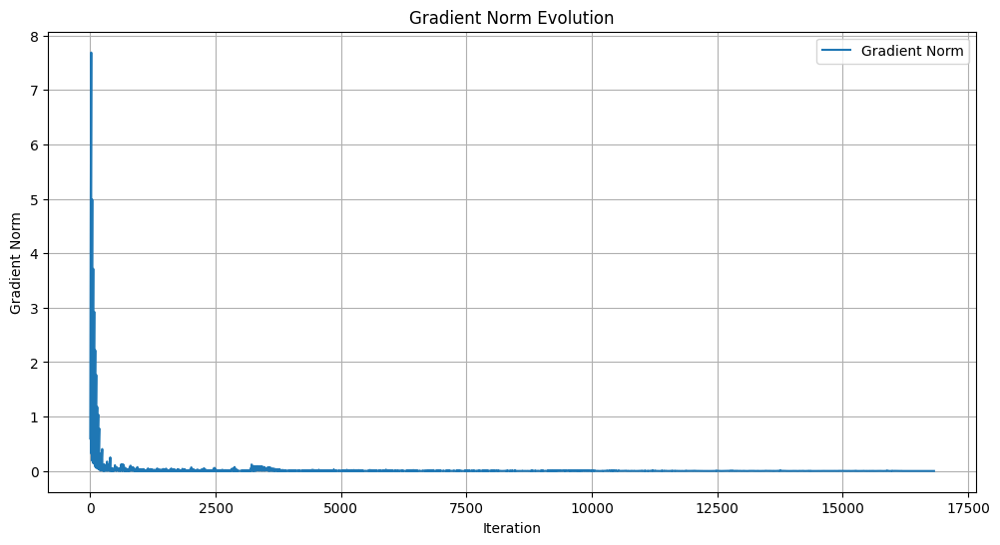


Iteration 860 | Total Loss 0.00012590558617375791
Updated Parameters:
M2: 17.9800968170166
M3: 11.976409912109375
D2: 9.909358024597168
D3: 9.845252990722656
V2: 2.4307854175567627
V3: 2.034200668334961
Pmech2: -3.032292127609253
Pmech3: 0.4571903347969055


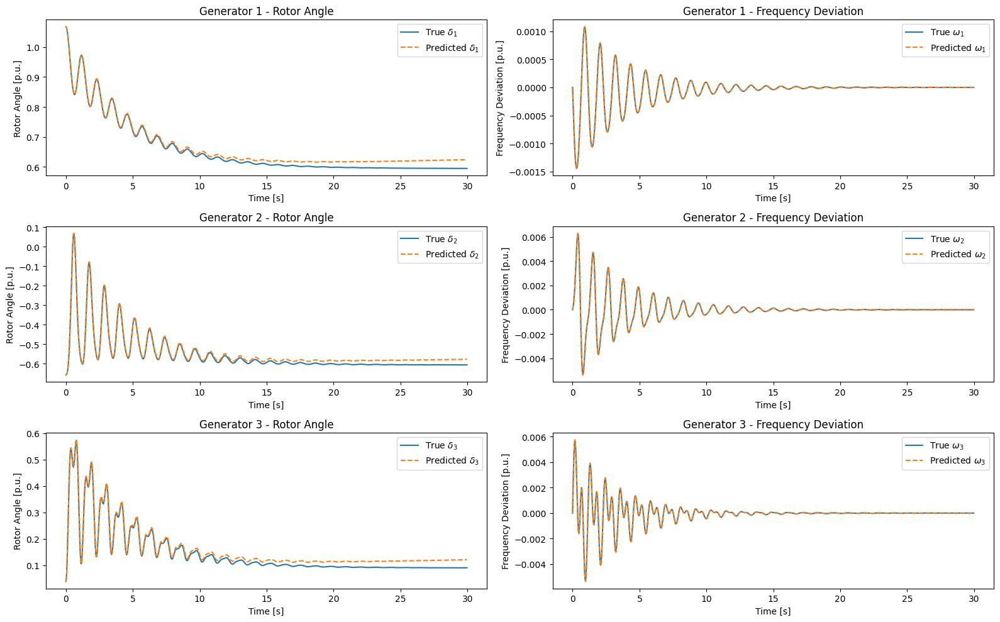

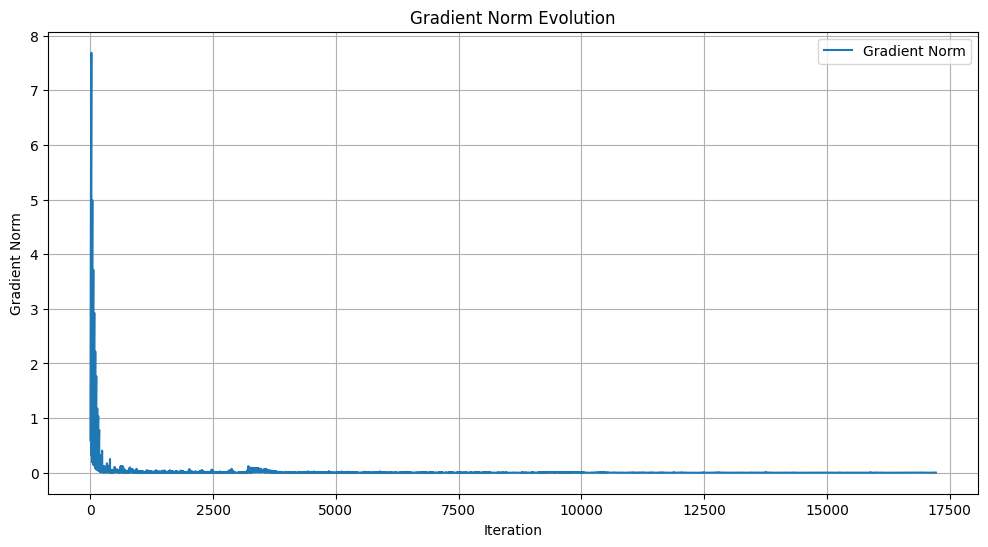


Iteration 880 | Total Loss 0.00007489325798815116
Updated Parameters:
M2: 17.980588912963867
M3: 11.977272987365723
D2: 9.9116792678833
D3: 9.846092224121094
V2: 2.430518627166748
V3: 2.034029483795166
Pmech2: -3.0322043895721436
Pmech3: 0.4570983648300171


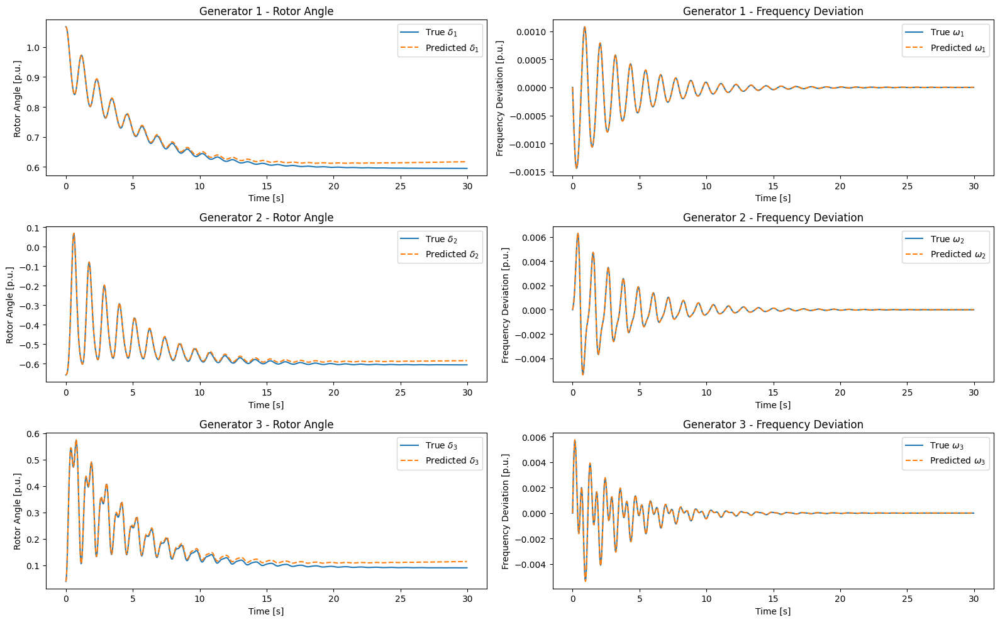

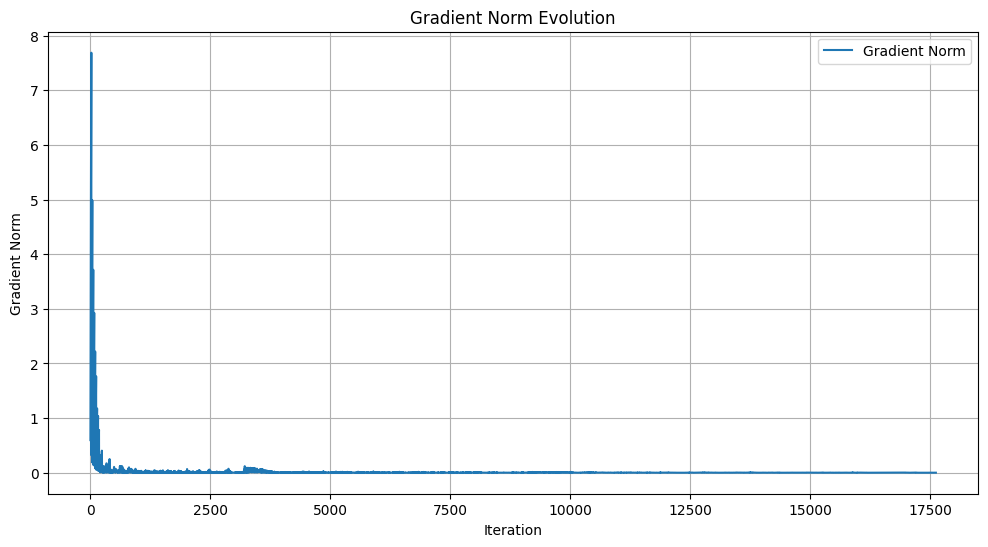


Iteration 900 | Total Loss 0.00008503421122441068
Updated Parameters:
M2: 17.981250762939453
M3: 11.977715492248535
D2: 9.912802696228027
D3: 9.847676277160645
V2: 2.4304986000061035
V3: 2.0343363285064697
Pmech2: -3.0321297645568848
Pmech3: 0.45701098442077637


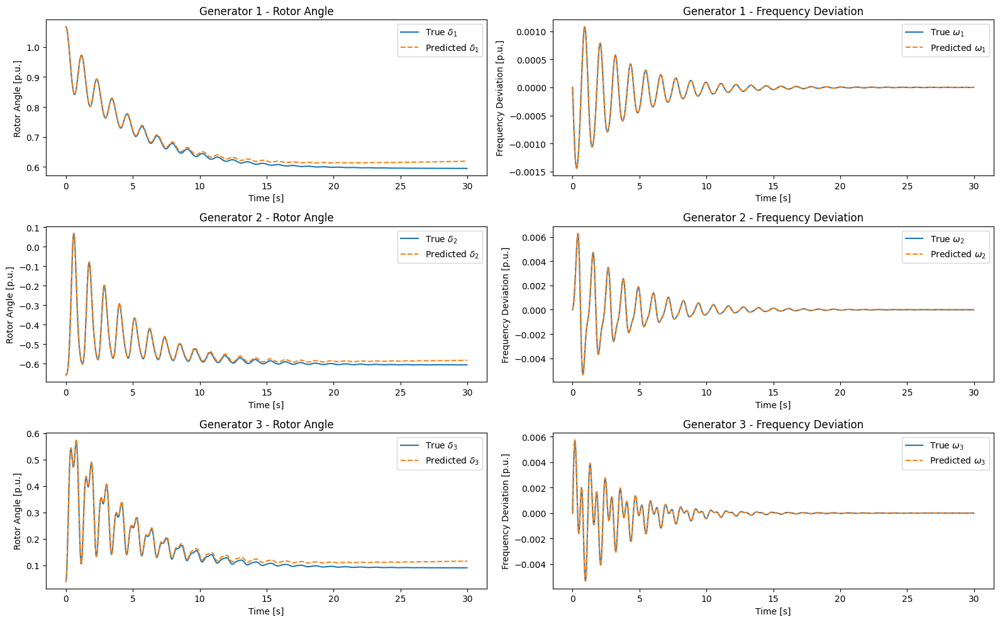

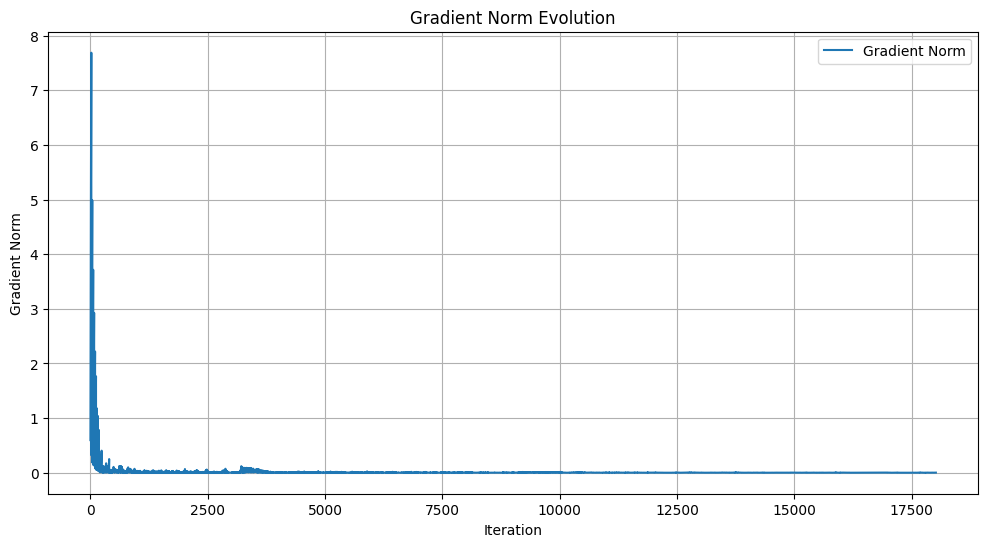


Iteration 920 | Total Loss 0.00000140945417115290
Updated Parameters:
M2: 17.981462478637695
M3: 11.978766441345215
D2: 9.91315746307373
D3: 9.848721504211426
V2: 2.430417060852051
V3: 2.0343093872070312
Pmech2: -3.032107353210449
Pmech3: 0.4569246768951416


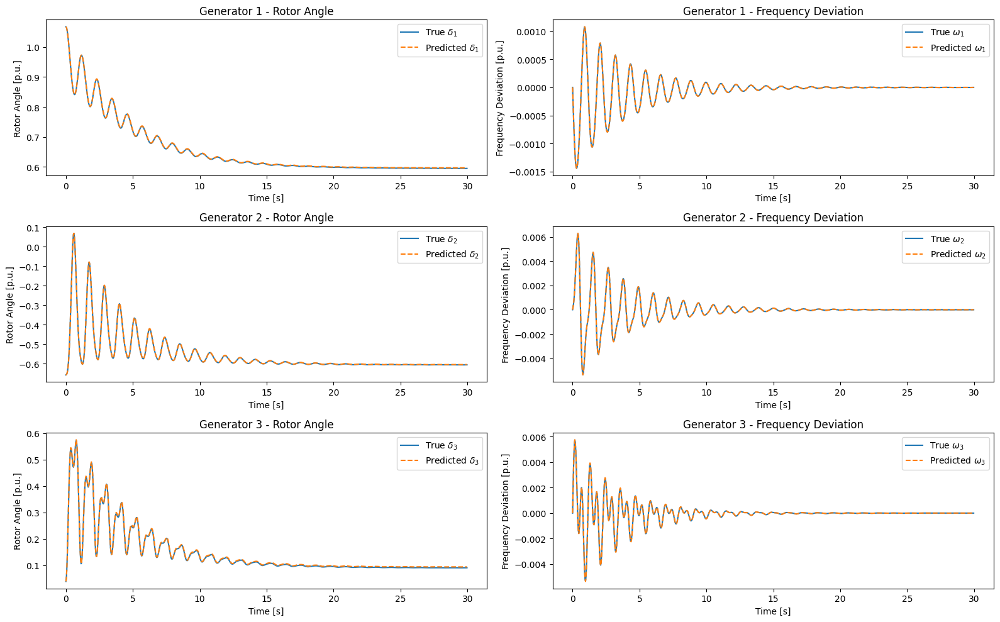

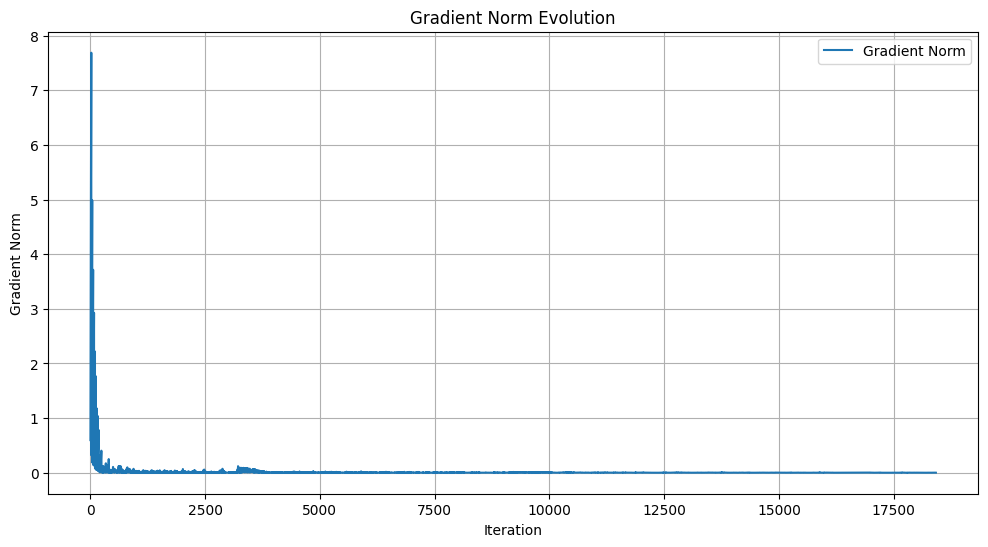

KeyboardInterrupt: 

In [10]:
#Training loop - MAC - MDV
Delta = 1.10 #Porcentual deviation from real value
#TargetPercent = 0.01
Treshold = 1e-7 #3Bus3Gen: For MD 1e-15, For MDV 1e-10, MDVP 1e-7
#2Bus2Gen: Originally 1e-13, 1e-11 for all cases, 1e-13 for M2, D2
M1_G = M1
D1_G = D1
M2_G = Delta*M2
D2_G = Delta*D2
M3_G = Delta*M3
D3_G = Delta*D3
V1_G = v1star
V2_G = Delta*v2star
V3_G = Delta*v3star
B12_G = B12
B13_G = B13
B23_G = B23
G12_G = G12
G13_G = G13
G23_G = G23
Pmech1_G = Pmech1star
Pmech2_G = Delta*Pmech2star
Pmech3_G = Delta*Pmech3star

parameters_correct = [M1,D1,M2,D2,M3,D3,v1star,v2star,v3star,B12,B13,B23,G12,G13,G23,Pmech1star,Pmech2star,Pmech3star]
parameters_data = []


csv_file_path = "MDVP/Data.csv"
plot_save_path = "MDVP/Initial.png"

os.makedirs(os.path.dirname(csv_file_path), exist_ok=True)


#def percent_deviation(current_value, target_value):
#     return abs(current_value - target_value) / target_value * 100 #Relative Estimation Error

print(f"M1: {M1.item()}", f"M1_G: {M1_G.item()}")
print(f"D1: {D1.item()}", f"D1_G: {D1_G.item()}")
print(f"M2: {M2.item()}", f"M2_G: {M2_G.item()}")
print(f"D2: {D2.item()}", f"D2_G: {D2_G.item()}")
print(f"M3: {M3.item()}", f"M3_G: {M3_G.item()}")
print(f"D3: {D3.item()}", f"D3_G: {D3_G.item()}")
print(f"V1: {v1star.item()}", f"V1_G: {V1_G.item()}")
print(f"V2: {v2star.item()}", f"V2_G: {V2_G.item()}")
print(f"V3: {v3star.item()}", f"V3_G: {V3_G.item()}")
print(f"B12: {B12.item()}", f"B12_G: {B12_G.item()}")
print(f"B13: {B13.item()}", f"B13_G: {B13_G.item()}")
print(f"B23: {B23.item()}", f"B23_G: {B23_G.item()}")
print(f"G12: {G12.item()}", f"G12_G: {G12_G.item()}")
print(f"G13: {G13.item()}", f"G13_G: {G13_G.item()}")
print(f"G23: {G23.item()}", f"G23_G: {G23_G.item()}")
print(f"Pmech1: {Pmech1star.item()}", f"Pmech1_G: {Pmech1_G.item()}")
print(f"Pmech2: {Pmech2star.item()}", f"Pmech2_G: {Pmech2_G.item()}")
print(f"Pmech3: {Pmech3star.item()}", f"Pmech3_G: {Pmech3_G.item()}")

func = NeuralODE(M1_G, D1_G, M2_G, D2_G, M3_G, D3_G, V1_G, V2_G, V3_G, B12_G, B13_G, B23_G, G12_G, G13_G, G23_G, Pmech1_G, Pmech2_G, Pmech3_G).to(device)
normal_lr = 0.005 #For MDVP 0.005 at 0.95
special_lr = 0.0005
special_param = [func.Pmech2, func.Pmech3]
other_param = [param for name, param in func.named_parameters() if param not in special_param]
param_groups = [{'params': other_param, 'lr': normal_lr}, {'params': special_param, 'lr': special_lr}]
optimizer = torch.optim.RMSprop(param_groups) #RMSprop
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size = 100, gamma=0.5, verbose=False)
#scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.005, epochs=1000, steps_per_epoch=20)
end = time.time()
#time_meter = RunningAverageMeter(0.97)
#loss_meter = RunningAverageMeter(0.97)
ii = 0

with torch.no_grad():
    print('Initial Parameters:')
    for name, param in func.named_parameters():
        print(f"{name}: {param.data}")
    initial_pred = odeint(func,x0,t).to(device)
    initial_true = true_x.to(device)
    visualize(initial_true, initial_pred, t, omega0, viz, plot_save_path)

grad_norm_values = []
start_time = time.time()

for itr in range(0, niters):
    grad_norm = 0
    optimizer.zero_grad()
    s, batch_x0, batch_t, batch_x = get_batch()

    for batch_n in range(0,batch_size):
        low = int(s[batch_n])
        high = low + batch_time
        pred_x = odeint(func, batch_x0[batch_n], batch_t, method = method).to(device)
        #print(batch_n+1)
        #loss = torch.mean((pred_x - batch_x[:,batch_n,:,:])**2) #loss using all states.
        loss = torch.mean((pred_x[:,0:2,0] - batch_x[:,batch_n,0:2,0])**2) #loss using only delta1 and omega1.
        loss.backward() #Calculate the dloss/dparameters
        optimizer.step() #Update value of parameters

        with torch.no_grad():
            for name, param in func.named_parameters():
                if name in ['M2', 'D2','V2', 'M3', 'D3', 'V3']:
                    param.clamp_(min=0.2)
                if name in ['D3']:
                    param.clamp_(max=20)
                
        for param in func.parameters():
            if param.grad is not None:
                grad_norm = param.grad.data.norm(2).item()**2
        grad_norm = math.sqrt(grad_norm)
        grad_norm_values.append(grad_norm)

        current_parameters = [param.item() for name, param in func.named_parameters()]
        iteration_time = time.time() - start_time
        parameters_data.append([itr] + current_parameters + [loss.item(), iteration_time, grad_norm])

    if itr % test_freq == 0:
        with torch.no_grad():
            pred_x = odeint(func, x0, t).to(device)
            #loss = torch.mean((func.dydt -  real_dynamics.dxdt)**2)
            #loss = torch.mean((pred_x - true_x)**2) #Loss using all states.
            loss = torch.mean((pred_x[:,0:2,0] - true_x[:,0:2,0])**2) #Loss using only delta1 and omega1.
            print(f'\nIteration {itr:d} | Total Loss {loss.item():.20f}')
            print('Updated Parameters:')
            for name, param in func.named_parameters():
                print(f"{name}: {param.data}")
            plot_save_path = f'MDVP/Iteration_{itr}.png'
            visualize(true_x, pred_x, t, omega0, viz, plot_save_path)
            
            with open(csv_file_path, 'a', newline='') as csvfile:
                writer = csv.writer(csvfile)
                if itr == 0:
                    header = ['Iteration'] + [name for name, _ in func.named_parameters()] + ['Loss', 'Time', 'Gradient Norm']
                    writer.writerow(header)
                writer.writerows(parameters_data)
                parameters_data = []
            ii += 1

            plt.figure(figsize=(12, 6))
            plt.plot(grad_norm_values, label= 'Gradient Norm')
            plt.xlabel('Iteration')
            plt.ylabel('Gradient Norm')
            plt.title('Gradient Norm Evolution')
            plt.legend()
            plt.grid(True)
            plt.show()

    scheduler.step()
    end = time.time()

    #if grad_norm <= Treshold:
    if loss <= Treshold:
         print(f'Stopping at iteration {itr} as the norm of the gradients is below the threshold: {Treshold}')
         print(f'Loss: {loss.item():.20f}')
         print(f'M2_G: {func.M2.item():.20f}')
         print(f'D2_G: {func.D2.item():.20f}')
         print(f'M3_G: {func.M3.item():.20f}')
         print(f'D3_G: {func.D3.item():.20f}')
         print(f'V2_G: {func.V2.item():.20f}')
         print(f'V3_G: {func.V3.item():.20f}')
         print(f'B12_G: {func.B12.item():.20f}')
         print(f'B13_G: {func.B13.item():.20f}')
         print(f'B23_G: {func.B23.item():.20f}')
         print(f'G12_G: {func.G12.item():.20f}')
         print(f'G13_G: {func.G13.item():.20f}')
         print(f'G23_G: {func.G23.item():.20f}')
         print(f'Pmech2_G: {func.Pmech2.item():.20f}')
         print(f'Pmech3_G: {func.Pmech3.item():.20f}')

         with torch.no_grad():
             pred_x = odeint(func, x0, t).to(device)
             #loss = torch.mean((pred_x - true_x)**2) #Loss using all states.
             loss = torch.mean((pred_x[:,0:2,0] - true_x[:,0:2,0])**2) #Loss using only delta1 and omega1.
             print(f'\nIteration {itr:d} | Total Loss {loss.item():.20f}')
             print('Updated Parameters:')
             for name, param in func.named_parameters():
                 print(f"{name}: {param.data}")
             plot_save_path = f'MDVP/Iteration_{itr}.png'
             visualize(true_x, pred_x, t, omega0, viz, plot_save_path)
             with open(csv_file_path, 'a', newline='') as csvfile:
                 writer = csv.writer(csvfile)
                 writer.writerows(parameters_data)
         break
